# VIP - Vortex Image Processing package

For VIP *v0.9.11* and *v1.0.0* onwards

Written by: *Carlos Alberto Gomez Gonzalez*. New additions and updates for v1.0.0 by *Valentin Christiaens*.

Last update: *2021/09/07*

## Table of contents

* [1. Loading ADI data](#1.-Loading-ADI-data)

* [2. Pre-processing the ADI cube](#2.-Pre-processing-the-ADI-cube)
    - [**2.1. Re-centering the ADI frames**](#2.1.-Re-centering-the-ADI-frames)
        - [2.1.1. Individual 2D negative Gaussian fits](#2.1.1.-Individual-2D-negative-Gaussian-fits)
        - [**2.1.2. Cross-correlation + 2D negGaussian**](#2.1.2.-Cross-correlation-+-2D-negGaussian)
        - [**2.1.3. Iterative speckle cross-correlation + 2D negGaussian**](#2.1.3.-Iterative-speckle-cross-correlation-+-2D-negGaussian)
    - [**2.2. Additional calibration/pre-processing procedures**](#2.2.-Additional-calibration/pre-processing-procedures)

* [**3. Image rotation and sub-px shifts**](#3.-Image-rotation-and-sub-px-shifts)
    - [**3.1. Interpolation-based methods**](#3.1.-Interpolation-based-methods)
    - [**3.2. FT-based method**](#3.2.-FT-based-method)
 
* [4. Signal to noise and significance](#4.-Signal-to-noise-and-significance)
    - [4.1. S/N map](#4.1.-S/N-map)
    - [**4.2. Significance**](#4.2.-Significance)
    - [**4.3. STIM map**](#4.3.-STIM-map)
    
* [5. Model PSF subtraction for ADI](#5.-Model-PSF-subtraction-for-ADI)
    - [5.1. median-ADI](#5.1.-median-ADI)
    - [5.2. Pairwise frame difference](#5.2.-Pairwise-frame-difference)
    - [5.3. Least-squares approximation - LOCI](#5.3.-Least-squares-approximation---LOCI)
    - [5.4. Full-frame PCA](#5.4.-Full-frame-PCA)
        - [5.4.1. Optimizing the number of PCs for full-frame ADI PCA](#5.4.1.-Optimizing-the-number-of-PCs-for-full-frame-ADI-PCA)
        - [5.4.2. Full-frame ADI PCA with a PA rejection criterion](#5.4.2.-Full-frame-ADI-PCA-with-a-PA-rejection-criterion)
        - [5.4.3. PCA for big datacubes](#5.4.3.-PCA-for-big-datacubes)
    - [5.5. Annular PCA](#5.5.-Annular-PCA)
    - [**5.6. PCA in a single annulus**](#5.6.-PCA-in-a-single-annulus)
    - [5.7. Full-frame NMF](#5.7.-Full-frame-NMF)
    - [**5.8. Annular NMF**](#5.8.-Annular-NMF)
    - [5.9. LLSG](#5.9.-LLSG)
    - [5.10. Mosaic with the ADI model PSF subtraction techniques so far](#5.10.-Mosaic-with-the-ADI-model-PSF-subtraction-techniques-so-far)
    
* [6. Detection function](#6.-Detection-function)
  
* [7. Generating synthetic planets](#7.-Generating-synthetic-planets)
 
* [8. **Flux and position estimation with NEGFC**](#8.-Flux-and-position-estimation-with-NEGFC)
    - [8.1. **Nelder-Mead based optimization**](#8.1.-Nelder-Mead-based-optimization)
    - [8.2. Planet subtraction](#8.2.-Planet-subtraction)
    - [8.3. **NEGFC technique coupled with MCMC**](#8.3.-NEGFC-technique-coupled-with-MCMC)
        - [8.3.1. Running the MCMC sampler](#8.3.1.-Running-the-MCMC-sampler)
        - [8.3.2. Visualizing the MCMC chain: corner plots and walk plots](#8.3.2.-Visualizing-the-MCMC-chain:-corner-plots-and-walk-plots)
        - [**8.3.3. Highly probable values and confidence intervals**](#8.3.3.-Highly-probable-values-and-confidence-intervals)
    - [**8.4. Residual speckle uncertainty**](#8.4.-Residual-speckle-uncertainty)
    - [**8.5. Final uncertainties**](#8.5.-Final-uncertainties)
    
* [9. Throughput and contrast curve](#9.-Throughput-and-contrast-curve)
    - [9.1. **Algorithmic throughput**](#9.1.-Algorithmic-throughput)
    - [9.2. **Contrast curve generation for ADI**](#9.2.-Contrast-curve-generation-for-ADI)


*Bold face corresponds to either new additions or significant updates compared to the previous version of the notebook (made for VIP v0.9.11).

-----------

Let's assume ``VIP`` and ``HCIplot`` are properly installed. We import the packages along with other useful libraries:

In [1]:
%matplotlib inline
from matplotlib.pyplot import *
from matplotlib import pyplot as plt
import numpy as np

import vip_hci as vip
from hciplot import plot_frames, plot_cubes

Parts of the notebook will only run for versions 1.0.0 and above. We will set `if` switches and a version parser to avoid any bug: 

In [2]:
from packaging import version
vvip = vip.__version__
vvip

'1.0.0'

The ``HCIplot`` package aims to be the "Swiss army" solution for plotting and visualizing multi-dimensional high-contrast imaging datacubes. It replaces the `vip_hci.var.pp_subplots` function present in older version of ``VIP``. `VIP` also allows interactive work with `DS9` provided that it's installed on your system along with ``pyds9``. A `DS9` session (window) can be started with: 

```ds9 = vip.Ds9Window()```

If the above fails but you have pyds9 installed (``vip_ds9`` is only a wrapper around ``pyds9``), you may find the [following troubleshooting tips](https://community.lsst.org/t/ds9-communication-via-xpa/2242) useful (e.g. step 4 in particular).

Then the *ds9* methods will allow interaction with the `DS9` window. For example, for sending an in-memory array to the `DS9` window you can simply use:

```ds9.display(2d_or_3d_array)```

The above can be used instead of ```HCIplot```'s ```plot_frames``` and ```plot_cubes``` routines (the latter being used in this notebook) for visualization and interaction with your images/datacubes.

# 1. Loading ADI data

In the 'dataset' folder of the `VIP_extras` repository you can find a toy ADI (Angular Differential Imaging) cube and a NACO point spread function (PSF) to demonstrate the capabilities of ``VIP``. This is an L'-band VLT/NACO coronagraphic (VORTEX AGPM) dataset of beta Pictoris published in [Absil et al. (2013)](https://ui.adsabs.harvard.edu/abs/2013A%26A...559L..12A/abstract). The sequence has been heavily sub-sampled temporarily to make it smaller. The frames were also cropped to the central 101x101 area. In case you want to plug-in your cube just change the path of the following cells.

**IMPORTANT** - VIP's convention is to work with input frames and cubes with an **odd** number of pixels along the x and y directions. Centering of the star then places its centroid on the central pixel. Currently the only VIP module that does not follow this convention is the ```andromeda``` module, which assumes input datacubes with an *even* number of pixels (with the star centered between the 4 central pixels).

Let's inspect the fits file:

In [3]:
vip.fits.info_fits('../datasets/naco_betapic_cube.fits')

Filename: ../datasets/naco_betapic_cube.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU       7   (101, 101, 61)   float32   


The fits file contains an ADI datacube of 61 images 101x101 px across. ADI sequences are acquired in pupil tracking mode, which means that the instrument field derotator remains off during the observation, thereby keeping the instrument and telescope optics aligned while the field of view rotates with time. The orientation of north in the images is given by so-called parallactic angles, which are varying throughout an ADI sequence. 
The parallactic angle vector for this observation is saved in the `naco_betapic_pa.fits` file. 

<font color=orange> **Question 1.1:** When observing a celestial object with a given telecope, what 3 parameters do the values of parallactic angle depend on? </font>

**Note**: throughout this notebook, questions will be raised in <font color=orange>orange</font>. Corresponding answers will be provided in <font color=green>green</font> at the end of the respective (sub)sections.

Now we load the data "in" memory with the `open_fits` function:

In [4]:
psfnaco = '../datasets/naco_betapic_psf.fits'
cubename = '../datasets/naco_betapic_cube.fits'
angname = '../datasets/naco_betapic_pa.fits'

cube_orig = vip.fits.open_fits(cubename)
psf = vip.fits.open_fits(psfnaco)
pa = vip.fits.open_fits(angname)

Fits HDU-0 data successfully loaded. Data shape: (61, 101, 101)
Fits HDU-0 data successfully loaded. Data shape: (39, 39)
Fits HDU-0 data successfully loaded. Data shape: (61,)


`open_fits` is a wrapper of the `astropy` fits functionality. The fits file is now a ndarray or ``numpy`` array in memory.

**Tip**: more information on any python object can be obtained by appending `?`. E.g. run ```vip.fits.open_fits?``` for more information about the ```open_fits``` routine and its optional arguments.

If you open the datacube with ds9 (or send it to the `DS9` window) and adjust the cuts you will see the beta Pic b planet moving on a circular trajectory, among similarly bright but quasi-static speckle. Alternatively, you can use `hciplot.plot_cubes`:

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W

For instance, instead of opts('Points (size=5)', points) use points.opts(opts.Points(size=5))


:Dataset   [x,y,time]   (flux)
:Cube_shape	[101, 101, 61]


:DynamicMap   [time]
   :Image   [x,y]   (flux)
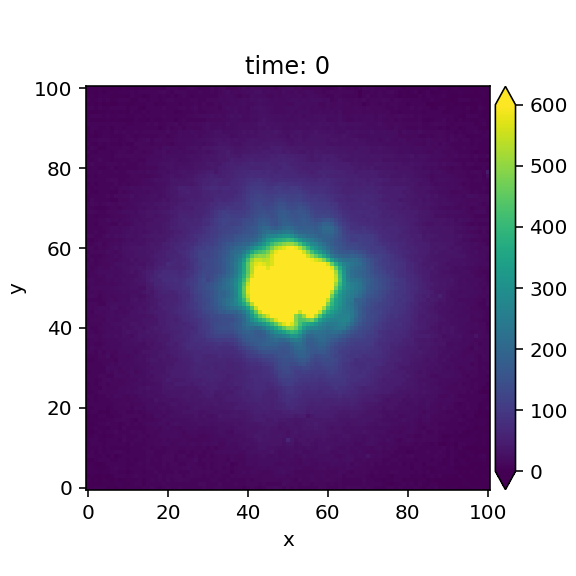

In [5]:
plot_cubes(cube_orig, vmin=0, vmax=600)

Note that the parallactic angles are not the final derotation angles to be applied to the images to match north up and east left (i.e. the standard convention for astronomical images). The final derotation angles are obtained by also adding the derotator offset (set at the beginning of the observation) and the true north angle (specific to the instrument and obtained here from a dedicated astrometric calibration of NACO). The values we adopt are taken from Absil et al. (2013).

In [6]:
derot_off = 104.84 # NACO derotator offset for this observation (Absil et al. 2013)
TN = -0.45         # Position angle of true north for NACO at the epoch of observation (Absil et al. 2013)

angs = pa+derot_off+TN

Let's measure the FWHM by fitting a 2D Gaussian to the core of the unsaturated non-coronagraphic PSF:

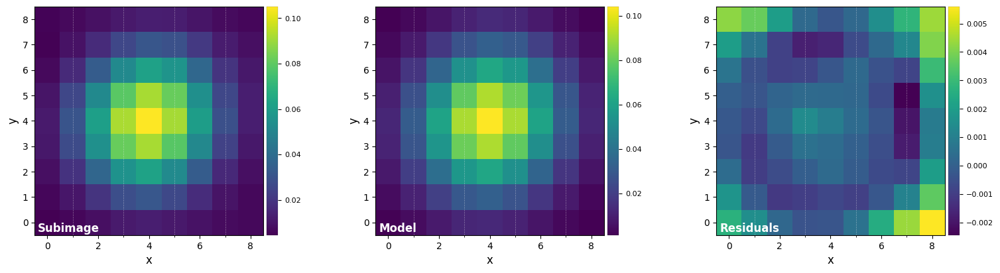

FWHM_y = 4.733218722257407
FWHM_x = 4.473682405059958 

centroid y = 19.006680059041216
centroid x = 18.999424475165455
centroid y subim = 4.006680059041214
centroid x subim = 3.9994244751654535 

amplitude = 0.10413004853269707
theta = -34.08563676836685


In [7]:
DF_fit = vip.var.fit_2dgaussian(psf, crop=True, cropsize=9, debug=True, full_output=True)

In [8]:
fwhm_naco = np.mean([DF_fit['fwhm_x'],DF_fit['fwhm_y']])
print(fwhm_naco)

4.603450563658683


Let's normalize the flux to one in a 1xFWHM aperture and crop the PSF array:

In [9]:
psfn = vip.metrics.normalize_psf(psf, fwhm_naco, size=19, imlib='ndimage-fourier')

Flux in 1xFWHM aperture: 1.228


The normalize_psf function performs internally a fine centering of the PSF (note the input PSF should already be centered within a few pixel accuracy for this fine centering to work). The `imlib` argument sets the library to be used for sub-px shifts (more details in [Section 5](#5.-Image-rotation)).

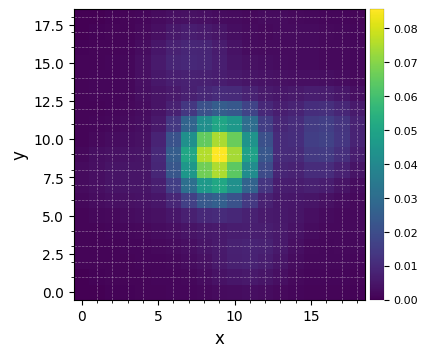

In [10]:
plot_frames(psfn, grid=True, size_factor=4)

Let's finally define the pixel scale for NACO (L' band), which we get from a dictionary stored in the `conf` subpackage:

In [11]:
pxscale_naco = vip.conf.VLT_NACO['plsc']
print(pxscale_naco, "arcsec/px")

0.02719 arcsec/px


<font color=orange> **Question 1.2:** The FWHM measured above can slightly vary depending on observing conditions and quality of the adaptive optics (AO) correction. In excellent conditions, the PSF gets narrower and can approach the theoretical diffraction limit. What is that angular resolution (in arcsec) at L' band, for a 8.1m diameter telescope such as the VLT?</font>

<font color=orange> **Question 1.3:** When building an instrument, one wants to make sure that even in the best observing conditions the PSF is always sampled at least at the Nyquist frequency - what would then be the coarsest pixel scale that would still allow a Nyquist sampling of the PSF at L' at the VLT? </font>

<font color=green> **Answer 1.1**: The parallactic angle depends on the celestial coordinates of the target, the latitude of the observatory and the observation time (commonly expressed in local hour angle for the target).</font> 

<font color=green> **Answer 1.2**: The theoretical diffraction limit is $\sim \lambda/D$, or $\sim$ 0.10 arcsec after conversion from radian to arcsec. </font> 

<font color=green> **Answer 1.3**: A pixel scale of 0.05 arcsec/px is required to ensure Nyquist sampling at L' band even in the best observing conditions.</font> 

[Go to the top](#Table-of-contents)

# 2. Pre-processing the ADI cube

The subpackage ``preproc`` contains all sorts of low-level image transformation routines: translation, rotation, cropping, pixel resampling, etc. It also contains functions dedicated for processing 3D or 4D arrays. In this tutorial we'll focus on ADI sequences, which come in the form of 3D arrays.

## 2.1. Re-centering the ADI frames

For ADI sequences, it's critical to have the star aligned at the center of the frames, a task that can be particularly difficult for coronagraphic observations. Image registration is an important step for any ADI post-processing algorithm, maximizing the S/N of any potential companion. ``preproc`` includes several re-centering functions:

- ``cube_recenter_2dfit`` for positive or negative 2D Gaussian/Moffat/Airy fits to the PSF;
- ``cube_recenter_dft_upsampling`` based on maximizing the cross-correlation of the DFT (Guizar et al. 2008);
- ``cube_recented_radon`` based on the Radon transform ([Pueyo et al. 2015](https://ui.adsabs.harvard.edu/abs/2015ApJ...803...31P/abstract)); 
- ``cube_recented_satspots`` based on the location of 4 satellite-spots - the star being at the center of the spots (standard e.g. for VLT/SPHERE data);
- ``cube_recenter_via_speckles`` based on maximizing the cross-correlation of speckles, expressed in log scale (originally proposed for NIRC2+AGPM data).

If we take a look at one single image of our toy datacube we will see the dark hole clearly off-center:

New shape: (15, 15)


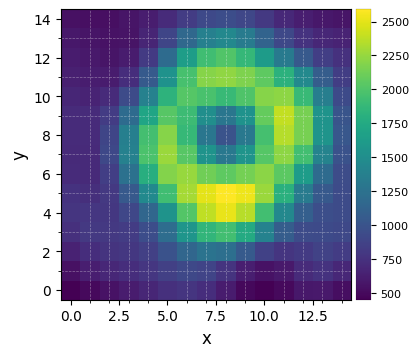

In [12]:
plot_frames(vip.preproc.frame_crop(cube_orig[0], 15), grid=True, size_factor=4)

For this NACO+AGPM dataset, three approaches could be considered for recentering - all assuming that the average location of the star throughout the observation coincides with the sweet spot (dark hole) of the coronagraph: 

### 2.1.1. Individual 2D negative Gaussian fits

This approach consists in fitting a negative 2D Gaussian model to the dark hole area for each individual image

In [13]:
from vip_hci.preproc import cube_recenter_2dfit

The coordinates of the centroid of the negative 2D Gaussian are then used to shift and align all images.

If using a different datacube, you may need to adjust the position `xy` of the center of the coronagraphic PSF to be fitted and the `subi_size` (sub-image size used for the fit, in pixels). Only use the `debug` mode on small datacubes (less than 20 frames), e.g. on a small subset of your datacube. In `debug` mode, set `nproc` to 1 or the plots won't show up (values larger than 1 trigger multiprocessing).

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Starting time: 2021-09-10 16:21:52
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
2d gauss-fitting
frames
0% [##############################] 100% | ETA: 00:00:00
Total time elapsed: 00:00:00
Shifting
0% [##############################] 100% | ETA: 00:00:00
Total time elapsed: 00:00:00
Running time:  0:00:01.231812
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――


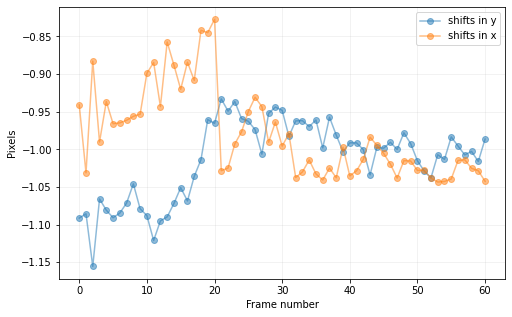

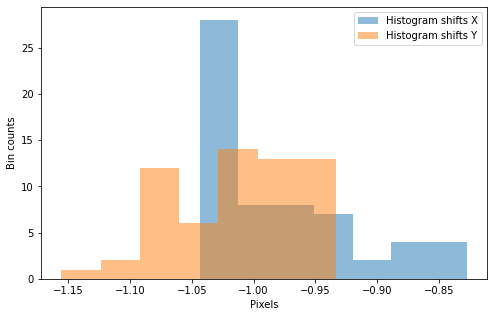

In [14]:
cube1, shy1, shx1 = cube_recenter_2dfit(cube_orig, xy=(51, 51), fwhm=fwhm_naco, nproc=1, subi_size=5, 
                                        model='gauss', negative=True, full_output=True, debug=False, 
                                        imlib='ndimage-fourier')

### 2.1.2. Cross-correlation + 2D negGaussian

This approach is a two-step procedure involving i) a cross-correlation based method in the Fourier plane used for alignment of the images with respect to each other and ii) fitting of a negative 2D gaussian to the mean of the aligned cube for final centering.

In [15]:
from vip_hci.preproc import cube_recenter_dft_upsampling, cube_shift

i) By not providing `subi_size` (default None), the routine will not try to recenter the first frame but simply align the subsequent frames with respect to the first one. If `subi_size` is an integer, it will be the size of the box used to fit a 2d gaussian to the first image, before aligning the subsequent frames to it (feel free to try running the cell below after uncommenting)

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Starting time: 2021-09-10 16:21:54
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
The first frame is assumed to be well centered wrt thecenter of the array
The rest of the frames will be shifted by cross-correlation wrt the 1st
frames
0% [##############################] 100% | ETA: 00:00:00
Total time elapsed: 00:00:01
Running time:  0:00:01.264155
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Shifts required to align the frames of the cube with respect to the first one:


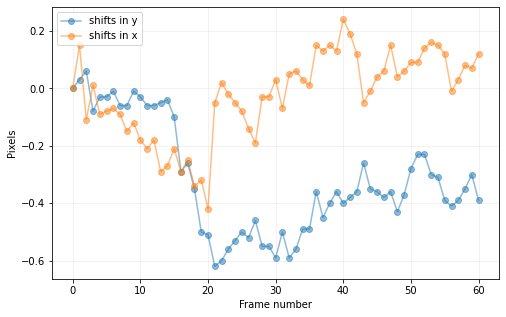

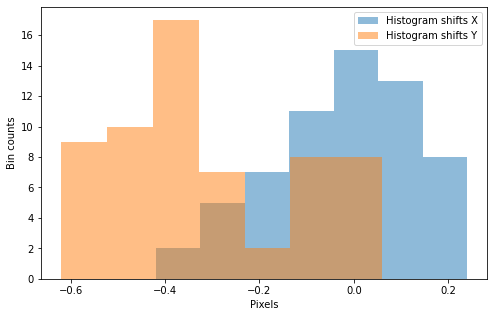

In [16]:
cube_align, shy2a, shx2a = cube_recenter_dft_upsampling(cube_orig, center_fr1=(51, 51), 
                                                        fwhm=fwhm_naco, #subi_size=5, negative=True,
                                                        full_output=True, debug=False, imlib='ndimage-fourier')
cube_al_mean = np.mean(cube_align,axis=0)
print("Shifts required to align the frames of the cube with respect to the first one:")
plt.show()

ii) we then leverage on the higher S/N in the mean image of all aligned images in order to find the final shift to place the star at the center of the images.

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Starting time: 2021-09-10 16:21:56
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
2d gauss-fitting
frames
0% [##############################] 100% | ETA: 00:00:00
Total time elapsed: 00:00:00
Shifting
0% [##############################] 100% | ETA: 00:00:00
Total time elapsed: 00:00:00
Running time:  0:00:00.022833
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Final shift to place the star at the center of the images:


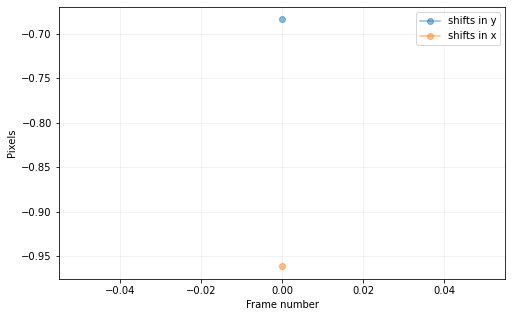

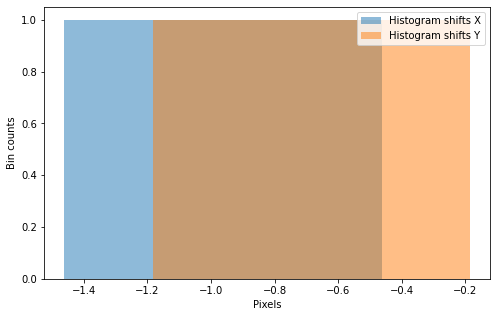

Combined shifts:


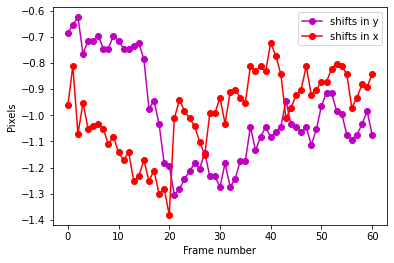

In [17]:
_, shy2b, shx2b = cube_recenter_2dfit(cube_al_mean[np.newaxis,:,:], xy=(51, 51), fwhm=fwhm_naco, 
                                      nproc=1, subi_size=5, model='gauss', negative=True, 
                                      full_output=True, debug=False, imlib='ndimage-fourier')
print("Final shift to place the star at the center of the images:")
plt.show()
cube2 = cube_shift(cube_align,shy2b[0],shx2b[0])
shy2 = shy2a+shy2b[0]
shx2 = shx2a+shx2b[0]

print("Combined shifts:")
plt.plot(range(cube_orig.shape[0]),shy2,'mo-', label='shifts in y')
plt.plot(range(cube_orig.shape[0]),shx2,'ro-', label='shifts in x')
plt.xlabel("Frame number")
plt.ylabel("Pixels")
plt.legend()
plt.show()

### 2.1.3. Iterative speckle cross-correlation + 2D negGaussian

This approach is iterative and involves two steps at each iteration: i) the images of the cube are aligned with respect to each other based on cross-correlation of the images in log-scale intensity, to better capture fainter speckle with radial separation (i.e. a speckle based cross-correlation alignment); ii) 2D negative Gaussian fit of the the median image of the aligned cube. By default, it involves 5 iterations. It is well suited for NIRC2+AGPM data, where an extended speckle pattern can be seen in the images in log scale.

In [18]:
from vip_hci.preproc import cube_recenter_via_speckles

Sub frame shape: (61, 49, 49)
Center pixel: (24.0, 24.0)
Square sum of shift vecs: 89.44960130532182
Square sum of shift vecs: 3.0493191038521013
Square sum of shift vecs: 1.0087524349940595
Square sum of shift vecs: 0.19414213562373095
Square sum of shift vecs: 0.07


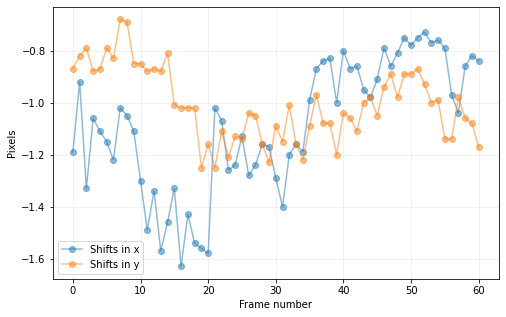

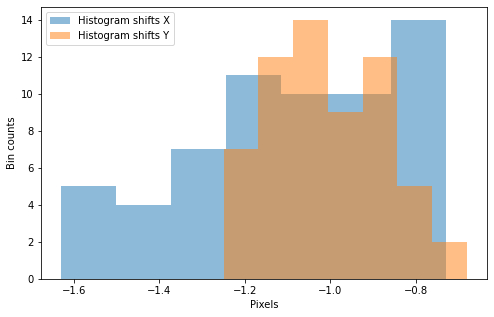

In [19]:
cube3, _, _, shy3, shx3 = cube_recenter_via_speckles(cube_orig, alignment_iter=5, fwhm=fwhm_naco, debug=False, 
                                                     recenter_median=True, fit_type='gaus', negative=True, crop=True, 
                                                     subframesize=49, mask=None, imlib='ndimage-fourier', plot=True, 
                                                     full_output=True)

Frames re-centering is a case-dependent procedure. For the purpose of this tutorial let's proceed with the results of the second procedure. Let's check the mean frame of the sequence before vs. after the shift was applied:

In [20]:
cube = cube2

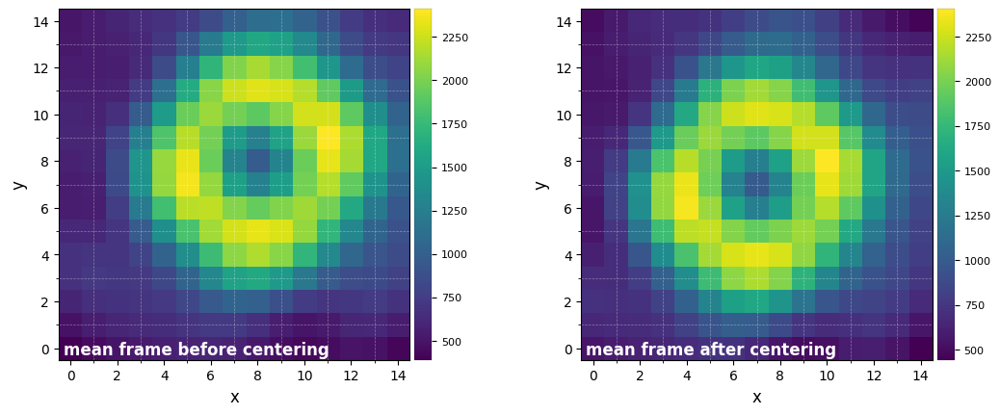

In [21]:
im1 = vip.preproc.frame_crop(cube_orig.mean(axis=0), 15, verbose=False)
im2 = vip.preproc.frame_crop(cube.mean(axis=0), 15, verbose=False)
plot_frames((im1, im2), grid=True, label=('mean frame before centering', 'mean frame after centering'))

If you wish to save any results (1, 2 or 3d arrays) in FITS format use: ```vip.fits.write_fits```

[Go to the top](#Table-of-contents)

## 2.2. Additional calibration/pre-processing procedures 

**Important**: The input images and datacubes for VIP's routines are typically assumed to have already undergone basic calibration (e.g. dark/sky subtraction, flat-fielding, bad pixel correction) since these steps are typically dealt with instrument-specific pipelines.

Note however that VIP also has a few calibration routines of interest which may be useful if a given instrument pipeline does not yield satisfactory results:

- For bad pixel correction, you may consider ``vip.preproc.cube_fix_badpix_isolated`` (standard sigma filtering), ``vip.preproc.cube_fix_badpix_annuli`` (for circularly symmetric PSFs) or ``vip.preproc.cube_fix_badpix_isolated`` (runs iteratively to correct images plagued with clumps of bad pixels). These tasks can be made significantly faster if you install ``numba`` in your environment (up to 50x faster for large datasets).
- For sky subtraction, you may consider using VIP's PCA-based sky subtraction routine ``vip.preproc.cube_subtract_sky_pca`` ([Gomez Gonzalez et al. 2017](https://ui.adsabs.harvard.edu/abs/2017AJ....154....7G/abstract]), [Hunziker et al. 2018](https://ui.adsabs.harvard.edu/abs/2018A%26A...611A..23H/abstract)).

`preproc` also includes several bad-frames detection functions as well as pixel upscaling routines. Furthermore, `vip.var` contains high and low pass filtering functions. All these routines may be useful as additional pre-processing steps depending on your dataset, although in this notebook we won't do any further pre-processing to our toy cube and rather focus on post-processing (i.e. stellar PSF modeling and subtraction), point-source detection and characterization.

[Go to the top](#Table-of-contents)

# 3. Image rotation and sub-px shifts

Image centering at sub-px accuracy is a crucial pre-processing step as seen in Section 2.
Moreover, all post-processing algorithms based on angular differential imaging also involve the rotation of images. 
Before proceeding further it is therefore useful to take a little detour to understand how these operations are made in practice.
Two main types of methods exist to either shift or rotate images by arbitrary amounts: 

1) interpolation-based methods;
    
2) Fourier-transform based methods (i.e. operation done in the Fourier plane). 

<font color='orange'> **Question 3.1**: Which of the two kinds of method is expected to be the most accurate to preserve the total flux and its distribution in the image?</font> 

To answer this question, let's consider the mean image of the observation as test image:

In [22]:
test_image = cube.mean(axis=0)

To evaluate how well the flux is preserved by each method, we rotate the image 72 times by 5deg (=360deg), and compare the resulting image to the original PCA-ADI image. The available options for `imlib` in the case of *image rotation* (i.e. in all ADI-based functions) are:
- `opencv` to use the opencv python package;
- `skimage` to use functions of the scikit-image package;
- `vip-fft` to use the FFT-based rotation method desribed in Larkin et al. (1997) and implemented in VIP.

If imlib is set to `opencv` or `scipy-ndimage`, the `interpolation` argument will set the degree of interpolation to be used - check the description of `vip.preproc.frame_rotate` for all available options.

Although the subsequent tests focus on image rotation only, similar tests could be performed with *sub-px shifts*. In the latter case, the available options for `imlib` (i.e. in the recentering functions) are:
- `opencv` to use the opencv python package;
- `ndimage-interp` to use functions of the scipy ndimage package; 
- `ndimage-fourier` to use the FFT-based shift function implemented in scipy ndimage.

## 3.1. Interpolation-based methods

The most common way to rotate an image involves inferring pixel intensities in the rotated/shifted image based on interpolation of the original grid of pixel intensities. Different kernels of increasing complexity/order can be used for the interpolation.

Let's first test different interpolation orders with the `skimage` package.

In [23]:
imlib_test = 'skimage'
from vip_hci.preproc import frame_rotate
from vip_hci.conf import time_ini, timing

test_image_rot_bil = test_image.copy()
test_image_rot_bic = test_image.copy()
test_image_rot_biq = test_image.copy()
test_image_rot_biq5 = test_image.copy()

print("*** Bilinear ({}) test ***".format(imlib_test))
t0 = time_ini(False)
for i in range(72):
    test_image_rot_bil = frame_rotate(test_image_rot_bil , 5, imlib=imlib_test, interpolation='bilinear')
timing(t0) 
    
print("*** Bicubic ({}) test ***".format(imlib_test))
t0 = time_ini(False)
for i in range(72):
    test_image_rot_bic = frame_rotate(test_image_rot_bic, 5, imlib=imlib_test, interpolation='bicubic')
timing(t0) 

print("*** Biquartic (skimage) test ***")
t0 = time_ini(False)
for i in range(72):
    test_image_rot_biq = frame_rotate(test_image_rot_biq, 5, imlib='skimage', interpolation='biquartic')
timing(t0)
   
print("*** Biquintic (skimage) test ***")
t0 = time_ini(False)
for i in range(72):
    test_image_rot_biq5 = frame_rotate(test_image_rot_biq5, 5, imlib='skimage', interpolation='biquintic')
timing(t0)

*** Bilinear (skimage) test ***
Running time:  0:00:00.056030
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
*** Bicubic (skimage) test ***
Running time:  0:00:00.071523
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
*** Biquartic (skimage) test ***
Running time:  0:00:00.322766
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
*** Biquintic (skimage) test ***
Running time:  0:00:00.353397
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――


Let's set the cuts for the images to be displayed

In [24]:
vmax12 = float(test_image.max())
vmax3 = 20
vmin12 = float(test_image.min())
vmin3 = -20

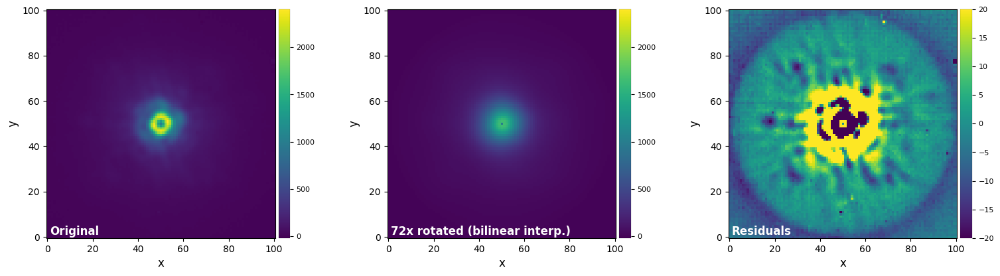

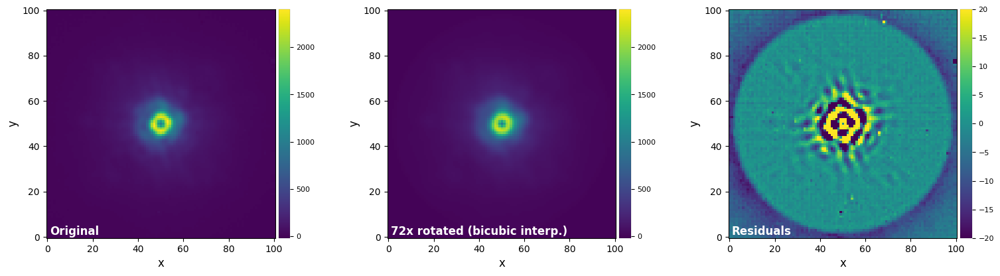

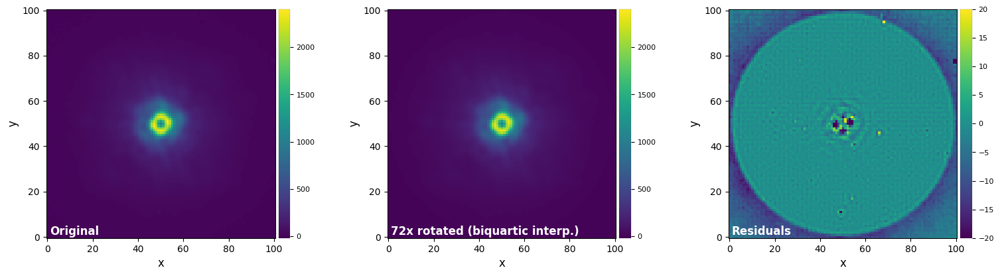

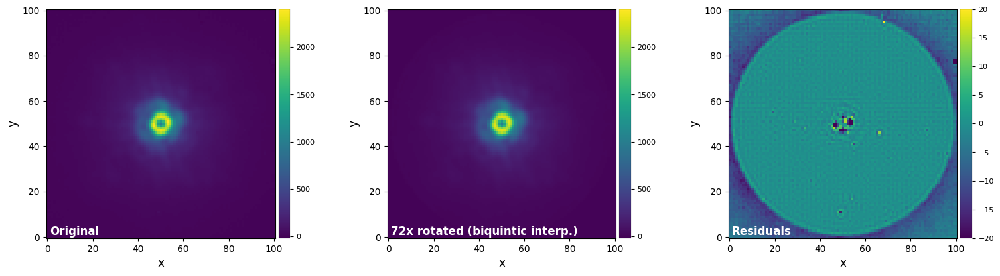

In [25]:
plot_frames((test_image, test_image_rot_bil, test_image_rot_bil-test_image),
             vmax=(vmax12, vmax12, vmax3), vmin=(vmin12, vmin12, vmin3),
             label = ("Original", "72x rotated (bilinear interp.)", "Residuals"))
plot_frames((test_image, test_image_rot_bic, test_image_rot_bic-test_image),
             vmax=(vmax12, vmax12, vmax3), vmin=(vmin12, vmin12, vmin3),
             label = ("Original", "72x rotated (bicubic interp.)", "Residuals"))
plot_frames((test_image, test_image_rot_biq, test_image_rot_biq-test_image),
             vmax=(vmax12, vmax12, vmax3), vmin=(vmin12, vmin12, vmin3),
             label = ("Original", "72x rotated (biquartic interp.)", "Residuals"))
plot_frames((test_image, test_image_rot_biq5, test_image_rot_biq5-test_image),
             vmax=(vmax12, vmax12, vmax3), vmin=(vmin12, vmin12, vmin3),
             label = ("Original", "72x rotated (biquintic interp.)", "Residuals"))

Interpolation-based methods are relatively fast, with the degree of interpolation usually setting the trade-off between flux conservation (higher orders more accurate) and speed (lower orders faster). For the test above, we see that the biquartic result yields a good compromise between flux conservation and speed.

Let's now test interpolation-based rotation using `opencv`. Note that `opencv` is an optional requirement, hence you may not be able to run the following test if you did not manually install `opencv`.

*** Bilinear (opencv) test ***
Running time:  0:00:00.025133
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
*** Bicubic (opencv) test ***
Running time:  0:00:00.038959
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
*** Lanczos4 (opencv) test ***
Running time:  0:00:00.138115
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――


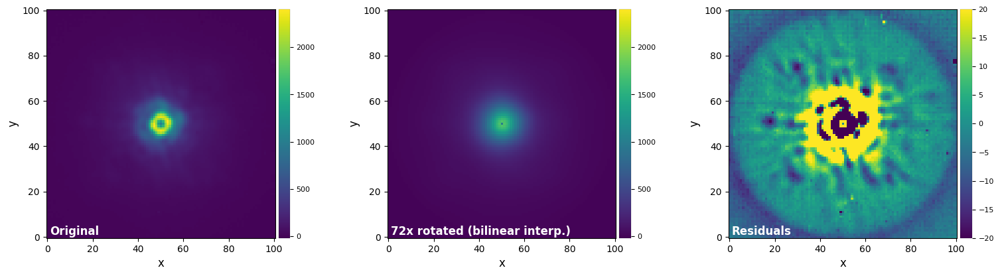

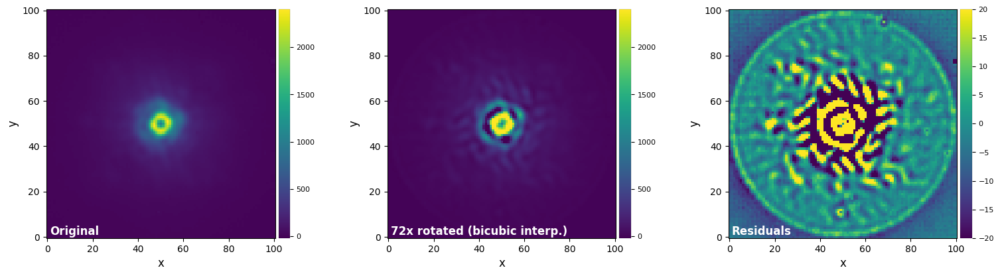

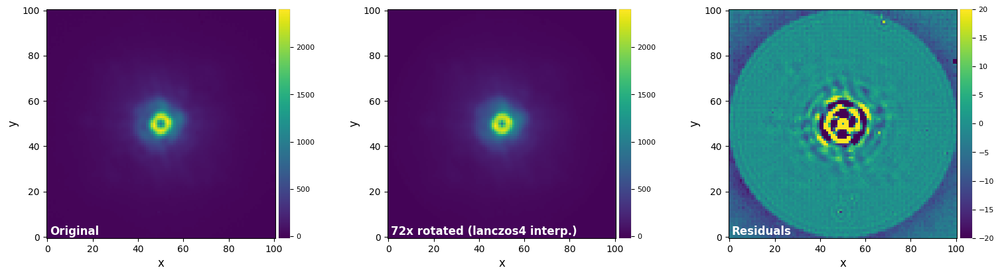

In [26]:
try:
    import cv2
    nocv2 = False
except:
    nocv2 = True

if not nocv2:
    imlib_test = 'opencv'

    test_image_rot_bil = test_image.copy()
    test_image_rot_bic = test_image.copy()
    test_image_rot_lzs4 = test_image.copy()

    print("*** Bilinear ({}) test ***".format(imlib_test))
    t0 = time_ini(False)
    for i in range(72):
        test_image_rot_bil = frame_rotate(test_image_rot_bil , 5, imlib=imlib_test, interpolation='bilinear')
    timing(t0) 

    print("*** Bicubic ({}) test ***".format(imlib_test))
    t0 = time_ini(False)
    for i in range(72):
        test_image_rot_bic = frame_rotate(test_image_rot_bic, 5, imlib=imlib_test, interpolation='bicubic')
    timing(t0) 

    t0 = time_ini(False)
    print("*** Lanczos4 ({}) test ***".format(imlib_test))
    for i in range(72):
        test_image_rot_lzs4 = frame_rotate(test_image_rot_lzs4, 5, imlib=imlib_test, interpolation='lanczos4')
    timing(t0)
    
    plot_frames((test_image, test_image_rot_bil, test_image_rot_bil-test_image),
                 vmax=(vmax12, vmax12, vmax3), vmin=(vmin12, vmin12, vmin3),
                 label = ("Original", "72x rotated (bilinear interp.)", "Residuals"))
    plot_frames((test_image, test_image_rot_bic, test_image_rot_bic-test_image),
                 vmax=(vmax12, vmax12, vmax3), vmin=(vmin12, vmin12, vmin3),
                 label = ("Original", "72x rotated (bicubic interp.)", "Residuals"))
    plot_frames((test_image, test_image_rot_lzs4, test_image_rot_lzs4-test_image),
                 vmax=(vmax12, vmax12, vmax3), vmin=(vmin12, vmin12, vmin3),
                 label = ("Original", "72x rotated (lanczos4 interp.)", "Residuals"))

Using the `opencv` library yields significantly faster speeds than `skimage`, but an overall decrease in accuracy.

Beware that in presence of high-spatial frequency or step-edge like signals (e.g. numerical or physical coronagraphic mask), higher order interpolation can lead to ringing artefacts:

In [27]:
from vip_hci.var import mask_circle

test_image_mask = mask_circle(test_image.copy(),8)
test_image_rot_bil = test_image_mask.copy()
test_image_rot_bic = test_image_mask.copy()
test_image_rot_biq4 = test_image_mask.copy()

print("*** Bilinear test ***")
t0 = time_ini(False)
for i in range(72):
    test_image_rot_bil = frame_rotate(test_image_rot_bil, 5, imlib='skimage', interpolation='bilinear')
timing(t0) 

print("*** Bicubic test ***")
t0 = time_ini(False)
for i in range(72):
    test_image_rot_bic = frame_rotate(test_image_rot_bic, 5, imlib='skimage', interpolation='bicubic')
timing(t0)

print("*** Biquartic test ***")
t0 = time_ini(False)
for i in range(72):
    test_image_rot_biq4 = frame_rotate(test_image_rot_biq4, 5, imlib='skimage', interpolation='biquartic')
timing(t0)

if not nocv2:
    test_image_rot_lzs4 = test_image_mask.copy()
    imlib_test = 'opencv'
    print("*** Lanczos4 (opencv) test ***")
    t0 = time_ini(False)
    for i in range(72):
        test_image_rot_lzs4 = frame_rotate(test_image_rot_lzs4, 5, imlib=imlib_test, interpolation='lanczos4')
    timing(t0)

*** Bilinear test ***
Running time:  0:00:00.064688
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
*** Bicubic test ***
Running time:  0:00:00.069413
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
*** Biquartic test ***
Running time:  0:00:00.319242
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
*** Lanczos4 (opencv) test ***
Running time:  0:00:00.055629
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――


Update the cuts:

In [28]:
vmax12 = float(test_image_mask.max())
vmax3 = 20
vmin12 = float(test_image_mask.min())
vmin3 = -20

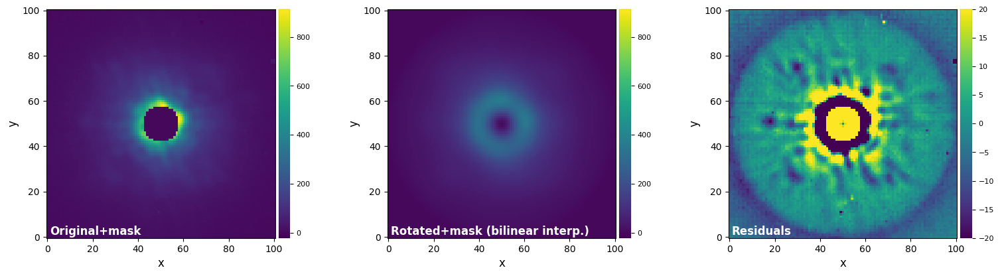

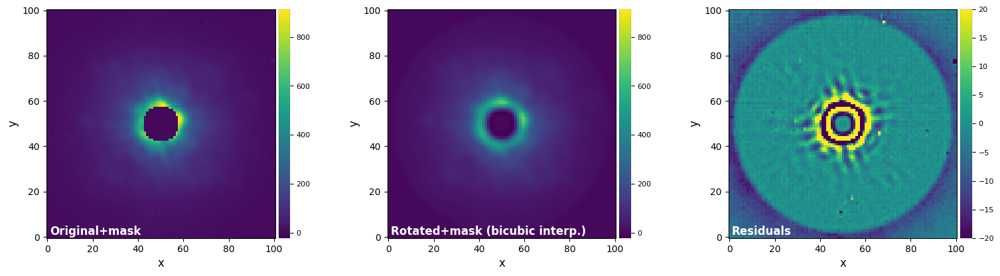

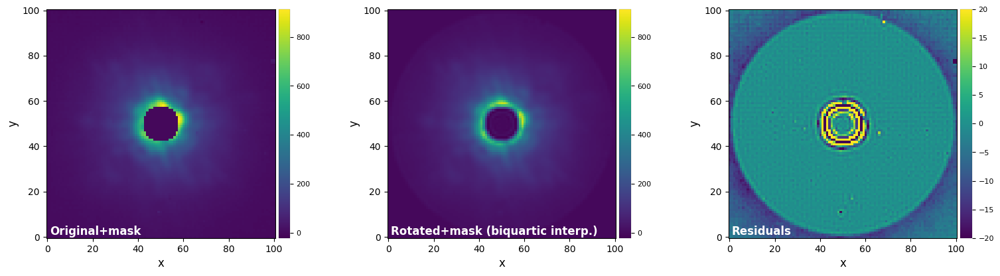

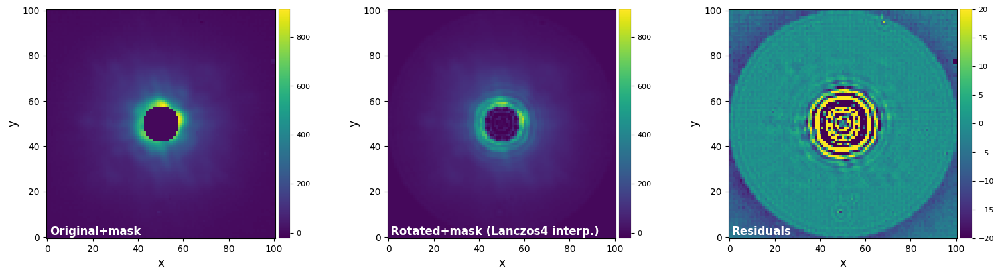

In [29]:
plot_frames((test_image_mask, test_image_rot_bil, test_image_rot_bil-test_image_mask),
             vmax=(vmax12, vmax12, vmax3), vmin=(vmin12, vmin12, vmin3),
             label = ("Original+mask", "Rotated+mask (bilinear interp.)", "Residuals"))
plot_frames((test_image_mask, test_image_rot_bic, test_image_rot_bic-test_image_mask),
             vmax=(vmax12, vmax12, vmax3), vmin=(vmin12, vmin12, vmin3),
             label = ("Original+mask", "Rotated+mask (bicubic interp.)", "Residuals"))
plot_frames((test_image_mask, test_image_rot_biq4, test_image_rot_biq4-test_image_mask),
             vmax=(vmax12, vmax12, vmax3), vmin=(vmin12, vmin12, vmin3),
             label = ("Original+mask", "Rotated+mask (biquartic interp.)", "Residuals"))
if not nocv2:
    plot_frames((test_image_mask, test_image_rot_lzs4, test_image_rot_lzs4-test_image_mask),
                 vmax=(vmax12, vmax12, vmax3), vmin=(vmin12, vmin12, vmin3),
                 label = ("Original+mask", "Rotated+mask (Lanczos4 interp.)", "Residuals"))

Notice both the artificial concentric rings and the non-zero residuals in the central masked area. The ringing artefacts are worse near the mask for higher interpolation orders. How would you solve the ringing artifact issue? Jump to Section 3.3 for one possible solution implemented in `VIP`.

## 3.2. FT-based method

A *shift* in the image plane corresponds to a multiplication by a phase factor in the Fourier plane. Furthermore[Larkin et al. 1997](1997OptCo.139...99L) demonstrated that *image rotation* could be decomposed into three consecutive 1D shears in the Fourier plane (along the x-, y- and x-axis again), i.e. by multiplication of the DFT of the image by a complex phase factor.

The FT-based method is only available in VIP v1.0.0 and above.

*** FFT-based rotation test ***
Running time:  0:00:04.268867
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――


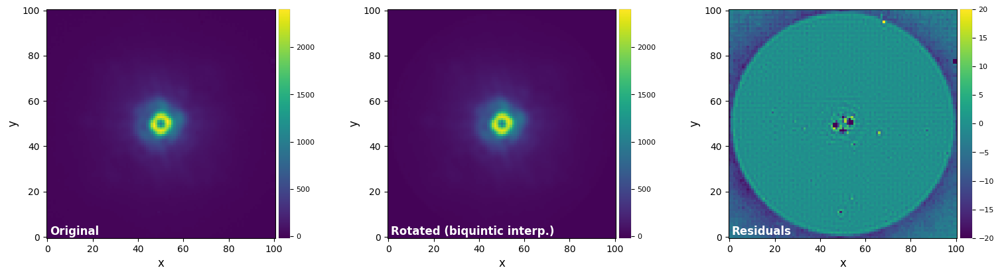

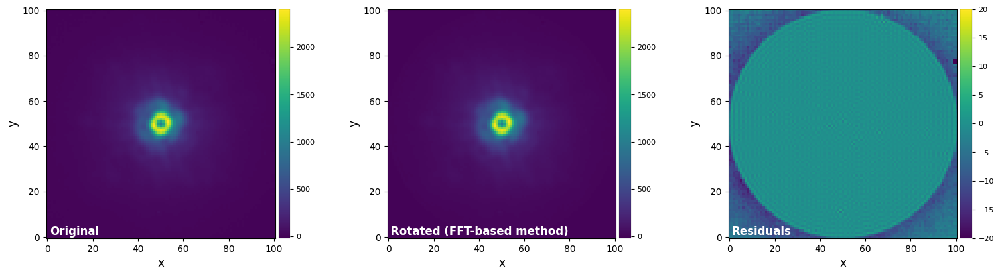

In [30]:
if version.parse(vvip) >= version.parse('1.0.0'):
    imlib_test = 'vip-fft'
    interp = None
    test_image_rot_fft = test_image.copy() 

    print("*** FFT-based rotation test ***")
    t0 = time_ini(False)
    for i in range(72):
        test_image_rot_fft = frame_rotate(test_image_rot_fft, 5, imlib=imlib_test, interpolation=interp)
    timing(t0)
    
    vmax12 = float(test_image.max())
    vmin12 = float(test_image.min())
    
    plot_frames((test_image, test_image_rot_biq5, test_image_rot_biq5-test_image),
                 vmax=(vmax12, vmax12, vmax3), 
                 vmin=(vmin12, vmin12, vmin3),
                 label = ("Original", "Rotated (biquintic interp.)", "Residuals"))
    plot_frames((test_image, test_image_rot_fft, test_image_rot_fft-test_image),
                 vmax=(vmax12, vmax12, vmax3), 
                vmin=(vmin12, vmin12, vmin3),
                 label = ("Original", "Rotated (FFT-based method)", "Residuals"))

The comparison with the biquintic interpolation reolution (the most accurate among our interpolation tests) reveals the clear superiority of the FT-based method to preserve the flux in the image, even after a large number of image rotations.

The last test also revealed a downside of the FT-based method: it is significantly slower than interpolation-based methods, due to the calculation of large and complex arrays (zero-padding is required before calculating the DFT making the arrays larger). For this toy dataset, the rotation test took ~50x (resp 8x) longer with the FT-based rotation than with `opencv`+Lanczos4 (resp. `skimage`+biquartic) interpolation. When using the `cube_derotate` function, it is recommended to use `nproc` to enable multiprocessing - i.e. parallel rotation of the images in the cube to significantly speed up the process.

Let's illustrate another downside of the FT-based method, by:

1) setting randomly a pixel as bad in the input image;

2) setting a numerical mask

In [31]:
if version.parse(vvip) >= version.parse('1.0.0'):
    bad_test_img = test_image.copy()
    bad_test_img[30,30] = 3000 # let's inject randomly a single bad pixel
    
    imlib_test = 'vip-fft'
    interp = None
    bad_test_rot_fft = bad_test_img.copy() 
    mask_test = mask_circle(test_image,4) # let's mask the inner 4 pixels of the image - i.e. replace them by 0
    
    bad_test_rot_fft = frame_rotate(bad_test_img, 5, imlib=imlib_test, interpolation=interp)
    
    mask_test_rot_fft = frame_rotate(mask_test, 5, imlib=imlib_test, interpolation=interp)

Let's also adapt the cuts to better visualize the effect:

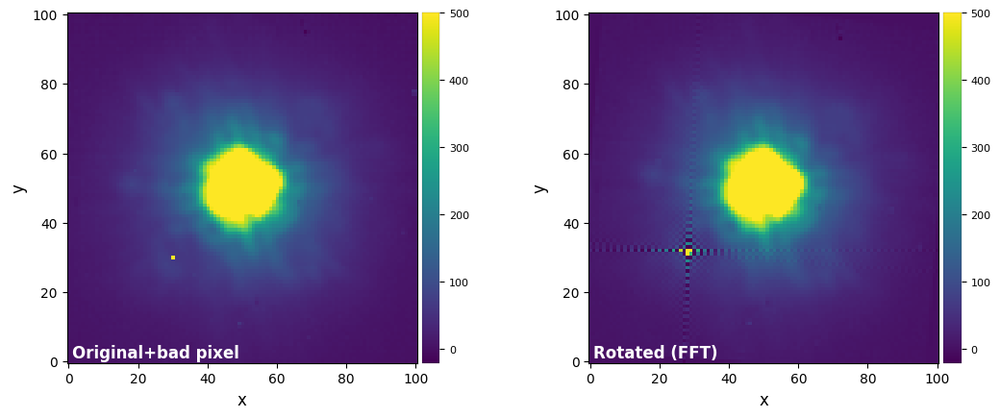

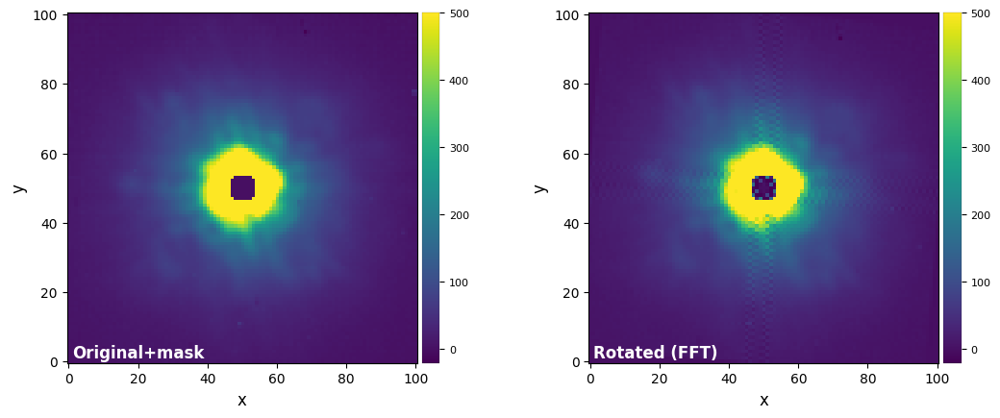

In [32]:
if version.parse(vvip) >= version.parse('1.0.0'):
    vmax12 = 500
    vmin=0
    plot_frames((bad_test_img, bad_test_rot_fft),
                 vmax=(vmax12, vmax12), vmin=(vmin12, vmin12),
                 label = ("Original+bad pixel", "Rotated (FFT)"))
    plot_frames((mask_test, mask_test_rot_fft),
                 vmax=(vmax12, vmax12), vmin=(vmin12,vmin12),
                 label = ("Original+mask", "Rotated (FFT)"))

<font color=orange> **Question 3.2**: The test above shows that the FT-based rotation method can induce large-scale positive/negative artifacts plaguing significant portions of the rotated image, when either bad pixels or a numerical mask are present. Why is that so?  </font>

If the artifacts stem from bad pixels, the best solution is to either use one of `VIP`'s bad pixel correction algorithms (possibly with more stringent parameters for bad pixel correction) beforehand (see Section 2), or to slightly smooth the image afterwards (the latter may somewhat defeat the purpose of preserving flux though).

## 3.3. Edge-blending

If artifacts stem from an inner mask (for either high-order interpolation or FT-based methods), the `edge_blend` option can mitigate the effect of Gibbs artefacts. Edge-blending consists in replacing sharp edges to have a smoother transition. In this case, this is done using a Gaussian kernel to replace the mask values based on neighbouring intensity values (with the `astropy.convolution` module). After rotation, the original mask is then re-applied on the rotated image.

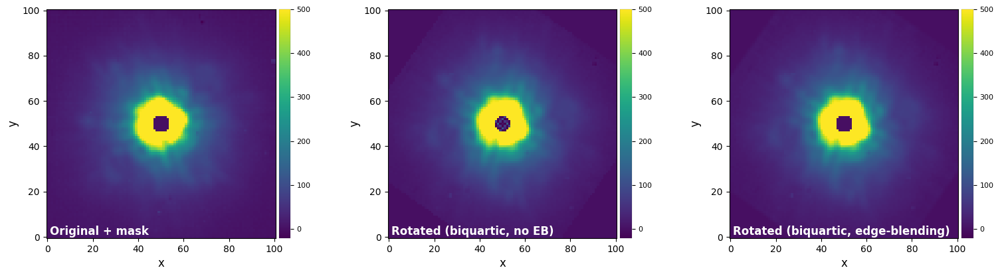

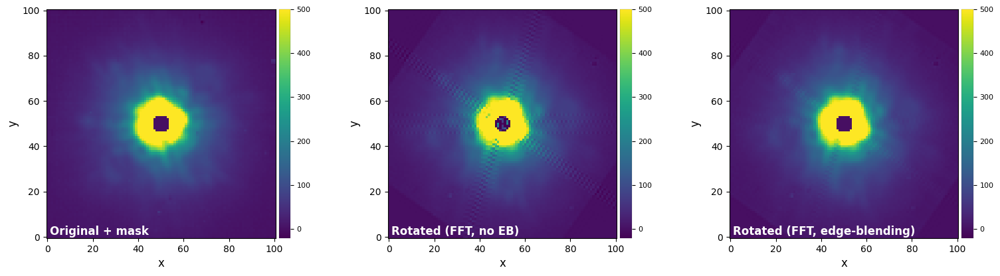

In [33]:
if version.parse(vvip) >= version.parse('1.0.0'):
    imlib_test = 'skimage'
    imlib_test2 = 'vip-fft'
    interp = None
    mask_test = mask_circle(test_image, 4)
    
    # no edge-bleding
    mask_test_rot_ski = frame_rotate(mask_test, 35, imlib='skimage', interpolation='biquartic')
    mask_test_rot_fft = frame_rotate(mask_test, 35, imlib='vip-fft', interpolation=None)
    
    # with edge-blending
    mask_test_rot_ski_eb = frame_rotate(mask_test, 35, imlib='skimage', interpolation='biquartic', 
                                        mask_val=0, edge_blend='interp', interp_zeros=True, ker=1)

    mask_test_rot_fft_eb = frame_rotate(mask_test, 35, imlib='vip-fft', interpolation=None, 
                                        mask_val=0, edge_blend='interp', interp_zeros=True, ker=1)
    
    plot_frames((mask_test, mask_test_rot_ski, mask_test_rot_ski_eb),
                 vmax=(vmax12,vmax12,vmax12), vmin=(vmin12,vmin12,vmin12),
                 label = ("Original + mask", "Rotated (biquartic, no EB)", "Rotated (biquartic, edge-blending)"))
    
    plot_frames((mask_test, mask_test_rot_fft, mask_test_rot_fft_eb),
                 vmax=(vmax12,vmax12,vmax12), vmin=(vmin12,vmin12,vmin12),
                 label = ("Original + mask", "Rotated (FFT, no EB)", "Rotated (FFT, edge-blending)"))

We can see that edge-blending worked well in both cases to remove the artifacts that can be seen in the middle column.

The choice of method to use for image rotation, and whether to consider artifacts-mitigating strategies such as edge-blending eventually depends on the intensity distribution in the original image and the specific purpose of the rotated image (e.g. is accurate flux measurement or aesthetics more important?). If installed, `opencv` will be `VIP`'s default library for shifts and rotations (along with default `interpolation` set to 'Lanczos4'), owing to its high speed. If better accuracy is required, feel free to adapt the value of `imlib` accordingly.

<font color=green> **Answer 3.1:** The tests shown in this section demonstrate the superiority of the FT-based method over interpolation-based methods in order to preserve the flux present in the image. Since the method only relies on applying phase factors to the Fourier transform, the almost perfect flux preservation is a direct consequence of Parseval's theorem (total power preserved in image and Fourier planes). </font>

<font color=green> **Answer 3.2**: To understand why the FT-based method is very sensitive to singularities in the grid (e.g. bad/hot/cold pixels, or numerical mask), it is useful to remember that an image is nothing more than an equally-spaced 2D sample from an intensity distribution. The FT-based method involves the calculation of both discrete Fourier Transform (DFT) and inverse DFT (note aside: both are typically calculated with a fast-Fourier transform - such that DFT and FFT are often used interchangeably). Calculating the DFT is equivalent to finding the coefficients of a truncated Fourier series. The artefacts stem from the fact that either a step-edge or a Dirac signal require on the contrary an *infinite* Fourier series to be perfectly represented. In turn, the inverse DFT of this truncated Fourier series (sinusoid in 1D) leads to Gibbs artifacts plaguing the rotated image.</font>

[Go to the top](#Table-of-contents)

# 4. Signal to noise and significance

## 4.1. S/N map

Before testing different stellar PSF modeling and subtraction algorithms, let's take another detour to define the S/N of point-like sources in high-contrast images (obtained after subtraction of the stellar PSF model). This is a useful figure of merit to assess the significance of a potential direct detection or to compare the performance of different algorithms in a dataset with a known companion. By default we adopt the definition of S/N given in [Mawet el al. (2014)](), which uses a two samples t-test for the problem of planet detection. Student (*t*) statistics are relevant for hypothesis testing in presence of a small sample. Since the structure of speckle noise varies radially, this is the case of high contrast imaging of point sources at small angles. 

The main idea is to test the flux of a given speckle or planet candidate against the flux measured in resolution elements at the same radial separation from the center:

$$S/N≡ \frac{\overline{x}_1 - \overline{x}_2}{s_2\sqrt{1+\frac{1}{n_2}}},$$

where $\overline{x}_1$ is the flux of the tested resolution element (blue dot in the figure below), $\overline{x}_2$ and $s_2$ are the mean and empirical standard deviation of the fluxes of the background resolution elements (red dots in the figure below) and $n_2$ the number of such background resolution elements.

Let's skip a step for now, and consider a final post-processed image with a companion candidate for which we want to assess whether the detection is significant (more details in Section 5):

In [34]:
xy_b = (35.5,58.5)

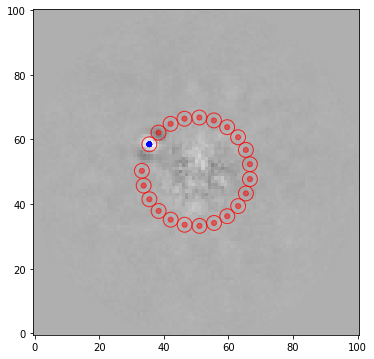

7.60549748671675

In [35]:
snr1 = vip.metrics.snr(vip.pca.pca(cube, angs, ncomp=6, verbose=False), 
                       source_xy=xy_b, fwhm=fwhm_naco, plot=True)
snr1

The S/N is relatively high, however we see that one of the test apertures is overlapping with one of the two negative side lobes (which is a typical signature for a point-source imaged with ADI). The `exclude_negative_lobes` option can be set to avoid considering apertures right next to the test aperture, which can make a significant difference in terms of S/N ratio in some cases:

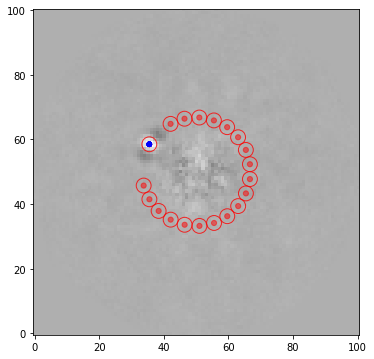

16.798393589311107

In [36]:
snr1 = vip.metrics.snr(vip.pca.pca(cube, angs, ncomp=6, verbose=False), 
                       source_xy=xy_b, fwhm=fwhm_naco, plot=True, exclude_negative_lobes=True)
snr1

One has to be careful with the `exclude_negative_lobes` option though, as it decreases the number of test apertures, hence increases the small-angle penalty factor.

In the ``metrics`` subpackage we have also implemented a function for S/N map generation, by computing the S/N for each pixel of a 2D array. It has a parameter `nproc` for exploiting multi-core systems which by default is *None*, meaning that it will get the number of physical cores available in the system.

In case we really need the S/N map of a big frame (which can take quite some time to compute depending on your hardware), a good option is to use the function `snrmap_fast`. It uses an approximated S/N definition that yields close results to the one mentioned earlier. 

<font color=orange> **Question 4.1**: In the presence of azimuthally extended disc signals in the field of view, how do you expect the S/N ratio of authentic sources to behave? Would the classical definition above still be reliable, or would it underestimate/overestimate the true S/N ratio of authentic circumstellar signals? </font>

## 4.2. Significance

[version >= 1.0.0 only]
Due to the common confusion between S/N ratio and significance, we have recently added a routine to convert (Student) S/N ratio (as defined above) into a Gaussian "sigma" significance, which is the most common metrics used to assess significance in signal detection theory. 

The conversion is based on matching the false positive fraction (FPF; e.g. $3 \times 10^{-7}$ for a $5\sigma$ detection threshold), or equivalently the confidence level CL = 1-FPF.

As an example, let's consider a second tentative source (arguably point-like) in our Beta Pic dataset:

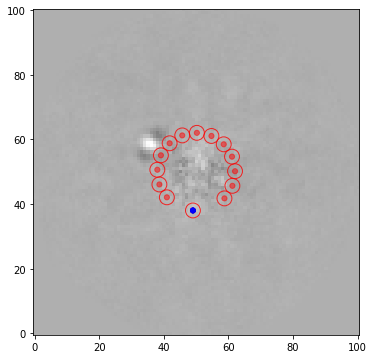

2.97104943113344


In [37]:
if version.parse(vvip) >= version.parse("1.0.0"):
    pca_img = vip.pca.pca(cube, angs, ncomp=6, verbose=False)
    #xy_test = (45.5,44)
    #xy_test = (39.5,50.)
    xy_test = (49,38.)
    snr2 = vip.metrics.snr(pca_img, source_xy=xy_test, fwhm=fwhm_naco, plot=True, exclude_negative_lobes=True)
    print(snr2)

The first blob (as shown in Sec. 4.1.) has a very high S/N of ~16.8.
The second point-like source has a S/N ~3.0.
What is the significance level that each blob is an authentic point source detection (i.e. not a residual speckle emerging randomly as part of the residual intensity distribution)?

The ``vip.metrics.significance`` routine takes into account both the S/N ratio and the radial separation of the point source (the FWHM is also required to express that radial separation in terms of FWHM), for conversion to significance in terms of Gaussian statistics. More details in Mawet et al. (2014).

In [38]:
if version.parse(vvip) >= version.parse("1.0.0"):
    from vip_hci.metrics import significance
    from vip_hci.var import frame_center
    cy, cx = frame_center(cube[0])
    rad1 = np.sqrt((cy-xy_b[1])**2+(cx-xy_b[0])**2)
    rad2 = np.sqrt((cy-xy_test[1])**2+(cx-xy_test[0])**2)
    sig1 = significance(snr1, rad1, fwhm_naco, student_to_gauss=True)
    sig2 = significance(snr2, rad2, fwhm_naco, student_to_gauss=True)
    msg = "The point-like signal at r = {:.1f}px ({:.1f} FWHM radius) with S/N={:.1f} corresponds to a {:.1f}sigma detection (Gaussian sigma)"
    print(msg.format(rad1, rad1/fwhm_naco, snr1, sig1))
    print(msg.format(rad2, rad2/fwhm_naco, snr2, sig2))

The point-like signal at r = 16.8px (3.7 FWHM radius) with S/N=16.8 corresponds to a 7.4sigma detection (Gaussian sigma)
The point-like signal at r = 12.0px (2.6 FWHM radius) with S/N=3.0 corresponds to a 2.6sigma detection (Gaussian sigma)


The first blob appears to be an authentic point source (i.e. physical companion or background object) given that its confidence level is equivalent to that of a $7.4\sigma$ detection (Gaussian sigma). For the second blob, the confidence level is equivalent to that of a $2.6\sigma$ detection (Gaussian statistics) - i.e. it is not a significant detection considering common detection thresholds of either 3 or 5$\sigma$.

<font color=orange>**Question 4.2**: How can one disentangle a physically bound companion (planet, brown dwarf of stellar binary) from a background object?</font>

## 4.3. STIM map

In the presence of extended disc signals, an alternative to the S/N map is to use the Standardized Trajectory Intensity Map (STIM; [Pairet et al. 2019](https://ui.adsabs.harvard.edu/abs/2019MNRAS.487.2262P/abstract)). A comparison between S/N and STIM maps for disc signals in the system of PDS 70 can be found in [Christiaens et al. 2019a](https://ui.adsabs.harvard.edu/abs/2019MNRAS.486.5819C/abstract).

The STIM map is defined by:

$${\rm STIM}(x,y) ≡ \frac{\mu_z(x,y)}{\sigma_z(x,y)},$$
where $\mu_z$ and $\sigma_z$ are the temporal mean and standard deviation of the *derotated residual cube* ($D_i$ in [Fig. 5.1](#5.1.-median-ADI)) across the temporal dimension, respectively. It is calculated for each pixel (x,y).
Let's calculate it for our Beta Pictoris L'-band test dataset.

In [39]:
from vip_hci.metrics import compute_stim_map
pca_img, _,_, pca_res, pca_res_der = vip.pca.pca(cube, angs, ncomp=15, verbose=False, full_output=True)

stim_map = compute_stim_map(pca_res_der)

In order to assess which signals are significant in the STIM map, Pairet et al. (2019) recommend to normalize the STIM map with the maximum intensity found in the inverse STIM map, which is obtained in a same way as the STIM map but using opposite angles for the derotation of the residual cube.

In [40]:
from vip_hci.metrics import compute_inverse_stim_map
inv_stim_map = compute_inverse_stim_map(pca_res, angs)
norm_stim_map = stim_map/np.nanmax(inv_stim_map)

Using the exact opposite values of derotation angles leads to a similar structure for the residual speckle noise, while authentic signals are not expected to sum up constructively. Therefore the maximum value in the inverse STIM map gives a good estimate of the maximum STIM intensity that one would expect from noise alone.

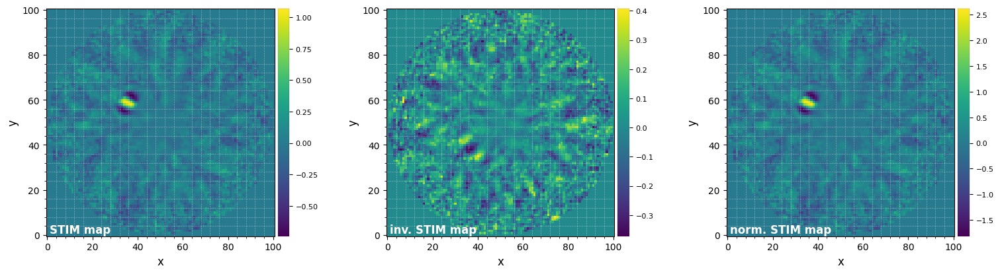

In [41]:
plot_frames((stim_map, inv_stim_map, norm_stim_map), grid=True, label=('STIM map', 'inv. STIM map', 'norm. STIM map'))

Any value larger than unity in the normalized STIM map is therefore expected to be significant. This can be visualized by thresholding the normalized STIM map.

In [42]:
thr_stim_map = norm_stim_map.copy()
thr_stim_map[np.where(thr_stim_map<1)]=0

Beta Pic b is considered significant with the above criterion, although no extended disc structure is detected:

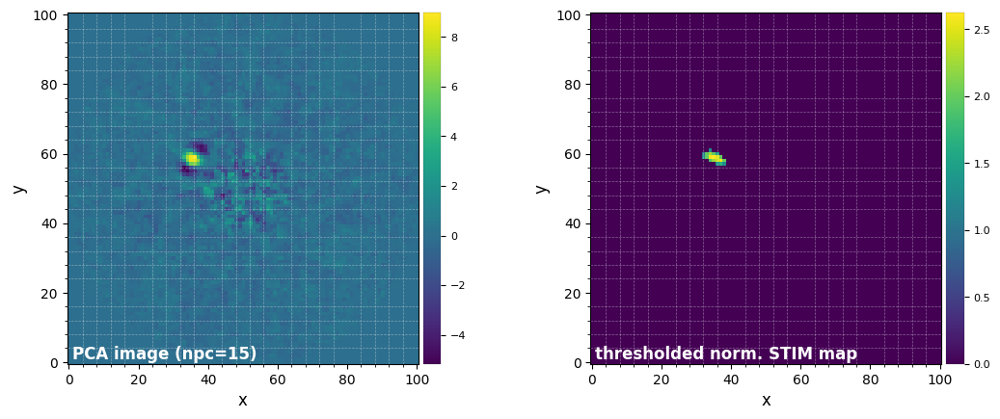

In [43]:
plot_frames((pca_img, thr_stim_map), grid=True, label=('PCA image (npc=15)', 'thresholded norm. STIM map'))

Note that in presence of azimuthally extended disc signals, the above criterion may still be too conservative to capture all disc signals present in the image - as these signals may also show up in the inverse STIM map and even dominate the maximum inverse STIM map values. Differential imaging strategies relying on other sources of *diversity* are required to identify azimuthally extended signals (e.g. RDI, SDI or PDI). 

<font color=green> **Answer 4.1:** When test apertures include disc signal, the mean flux $\bar{x}_2$ will be higher and/or the noise level will be overestimated (if the extended signal does not cover all apertures), hence leading in both cases to an underestimated S/N ratio of authentic disc signals. The above definition is therefore only relevant for point source detection.</font> 

<font color=green> **Answer 4.2:** With enough follow-up observations one can monitor the relative astrometry of the companion candidate with respect to the star, and compare it to the proper motion of the star (typically known to good precision thanks to Gaia for nearby stars). A background object (much further away) is expected to have a significantly different (typically much smaller) proper motion than the target. In absence of follow-up observations, a first statistical argument can be made based on the separation of the companion candidate and the number density of background objects in that area of the sky - this can be estimated with `VIP`'s `vip.stats.bkg_star_proba` routine combined with the help of a Galactic model (e.g. TRILEGAL or Besançon model). </font>

[Go to the top](#Table-of-contents)

# 5. Model PSF subtraction for ADI

In the framework of differential imaging techniques, we ultimately rely on modelling and subtracting the stellar PSF and associated speckle noise pattern. Algorithms of different complexities and performances have been proposed since 2006. Several of those algorithms are implemented in ``VIP`` and showcased in the next subsections.

All ADI-based algorithms involve image rotation. We therefore first set the preferred method to be used for image rotation. This is controlled with the `imlib` and `interpolation` optional arguments (see previous section). Feel free to adapt the following box to test other methods (keeping in mind that FFT-based rotation is only available in versions >= 1.0.0):

In [44]:
# For versions >= 1.0.0, use Fourier-transform based method
if version.parse(vvip) >= version.parse("1.0.0"):
    imlib_rot = 'vip-fft'
    interpolation=None
else:
    imlib_rot = 'skimage'
    interpolation = 'biquartic'    

## 5.1. median-ADI

The most simple approach is to model the PSF with the median of the ADI sequence. The median subtraction algorithm is the original post-processing approach proposed for ADI data (see [Marois et al. 2006](https://ui.adsabs.harvard.edu/abs/2006ApJ...641..556M/abstract)):

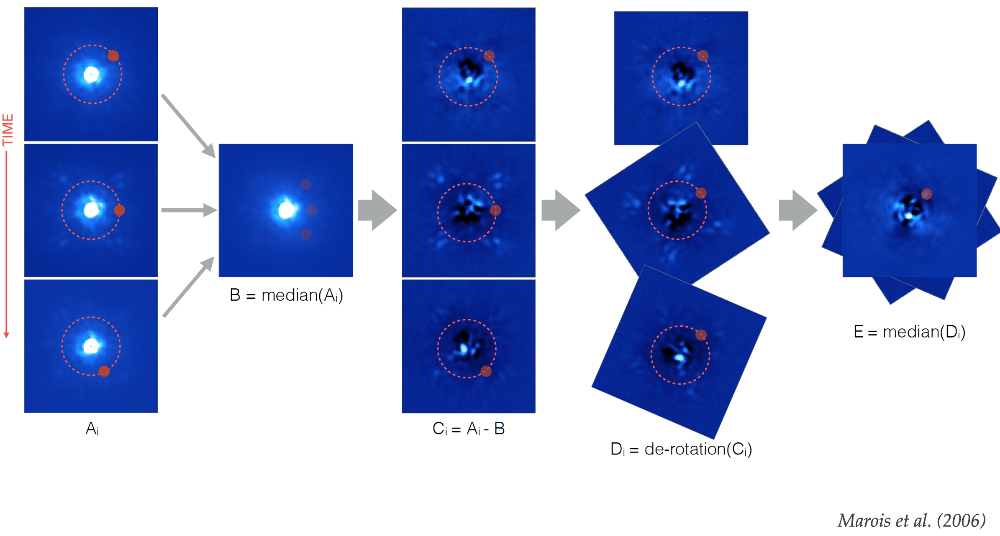

**Figure 5.1** - Median-ADI concept. A sequence of images $A_i$ is obtained in pupil-tracking mode. Any putative planet would rotate throughout the images, along with the field of view, while the stellar halo and speckle pattern remains quasi-static. The median $B_i$ of the sequence does not compare and is subtracted to $A_i$ to create a residual cube $C_i$. The residual cube is derotated ($D_i$) to align the field-of-view. The derotated residual cube is then stacked (typically with a median) to create a finale image $E$.

<font color=orange>**Question 5.1**: In practice, what are the main limitations of median-ADI? </font>

In [45]:
fr_adi = vip.medsub.median_sub(cube, angs, mode='fullfr', imlib=imlib_rot, interpolation=interpolation)

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Starting time: 2021-09-10 16:22:32
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Median psf reference subtracted
Done derotating and combining
Running time:  0:00:03.201297
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――


A "smart median-ADI" can be performed in concentric annuli and using a parallactic angle threshold. For each image of the input cube the subtracted model consists of the median of `nframes` closest images in time that have rotated by at least `delta_rot`x FWHM (linear motion). This model is constructed in concentric annuli of width `asize`x FWHM.

<font color=orange> **Question 5.2**: What are the pros and cons of using a parallactic angle threshold? </font>

In [46]:
fr_adi_an = vip.medsub.median_sub(cube, angs, fwhm_naco, asize=fwhm_naco, mode='annular', 
                                  delta_rot=0.5, nframes=4, imlib=imlib_rot, interpolation=interpolation)

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Starting time: 2021-09-10 16:22:35
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
N annuli = 10, FWHM = 4
Processing annuli:
PA threshold 46.97 is likely too big, will be set to 36.61
0% [##############################] 100% | ETA: 00:00:00
Total time elapsed: 00:00:00
Optimized median psf reference subtracted
Done derotating and combining
Running time:  0:00:03.292385
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――


Note that the parallactic angle threshold corresponding to 0.5 FWHM linear motion could not be met for the innermost annulus, and was therefore automatically relaxed to find `nframes` eligible frames to be used for the model.

Strong residuals can be seen near the center of the image, with a faint potential point source in the north-east of the final image:

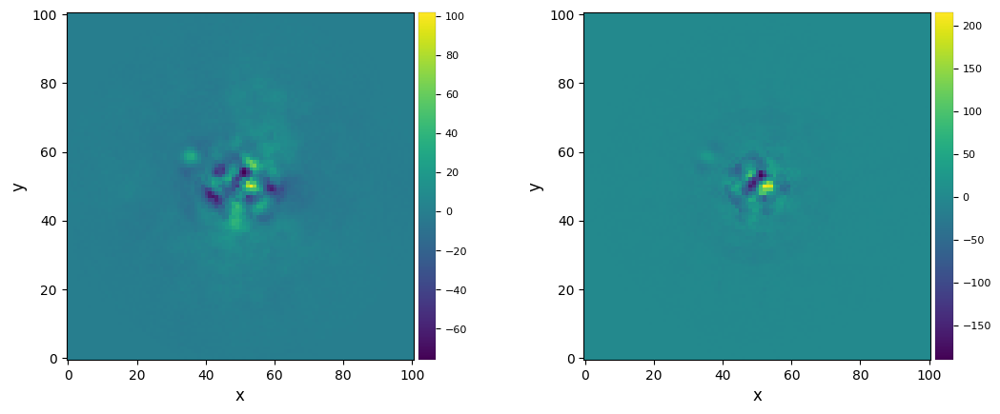

In [47]:
plot_frames((fr_adi, fr_adi_an))

<font color=green> **Answer 5.1** Quasi-static speckles are one of the main limitations. These stem from slowly varying aberrations in the instrument and optics (e.g. due to different mechanical flexures) while tracking the object during the observation. If observing conditions are not stable (e.g. sudden burst in seeing), the adaptive optics performance may also fluctuate during the observing sequence, which can also lead to a decorrelation of the speckle pattern. The latter should be mitigated with bad frame removal (done in preprocessing).

<font color=green> **Answer 5.2** A non-zero parallactic angle threshold helps minimizing self-subtraction of putative planets, by only considering images where a putative planet has sufficiently rotated to not be included in the model used for subtraction. On the other hand, a large parallactic angle threshold can force the use of images taken far away in time from the one considered for modeling. If observing conditions were variable such that the PSF and speckle pattern were not stable throughout the sequence, this can lead to a poor PSF model for subraction. While a value of `delta_rot=1` will lead to low self-subtraction and is a good default value for observations obtained in *good* and *stable* conditions with *sufficient field rotation*, keep in mind that the optimal value of `delta_rot` for a specific dataset and planet radial separation may be different than 1.

[Go to the top](#Table-of-contents)

## 5.2. Pairwise frame difference

Another simple approach is to perform pairwise frame subtraction, taking into account a rotation threshold. This is similar to the algorithm proposed by Hagelberg et al. (2016). This implementation can also impose a distance threshold (similarity).

[Note: there was a bug in versions < 1.0.0 due to lack of imlib parameter]

In [48]:
if version.parse(vvip) >= version.parse("1.0.0"):
    fr_fdiff = vip.frdiff.frame_diff(cube, angs, fwhm_naco, metric='l1', dist_threshold=90, delta_rot=0.5, 
                                     radius_int=2, asize=fwhm_naco, nproc=1, imlib=imlib_rot, 
                                     interpolation=interpolation, verbose=True)

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Starting time: 2021-09-10 16:22:39
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
10 annuli. Performing pair-wise subtraction:
Ann 1    PA thresh: 29.96    Ann center:   4    N segments: 1 
Ann 2    PA thresh: 14.73    Ann center:   9    N segments: 1 
Ann 3    PA thresh:  9.74    Ann center:  14    N segments: 1 
Ann 4    PA thresh:  7.27    Ann center:  18    N segments: 1 
Ann 5    PA thresh:  5.80    Ann center:  23    N segments: 1 
Ann 6    PA thresh:  4.82    Ann center:  27    N segments: 1 
Ann 7    PA thresh:  4.13    Ann center:  32    N segments: 1 
Ann 8    PA thresh:  3.61    Ann center:  37    N segments: 1 
Ann 9    PA thresh:  3.21    Ann center:  41    N segments: 1 
Ann 10    PA thresh:  2.95    Ann center:  45    N segments: 1 
Done processing annuli
Running time:  0:01:04.105367
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――

As for the median-ADI results, there seems to be a faint point-like source towards the north-east, although strong residuals dominate the center of the image:

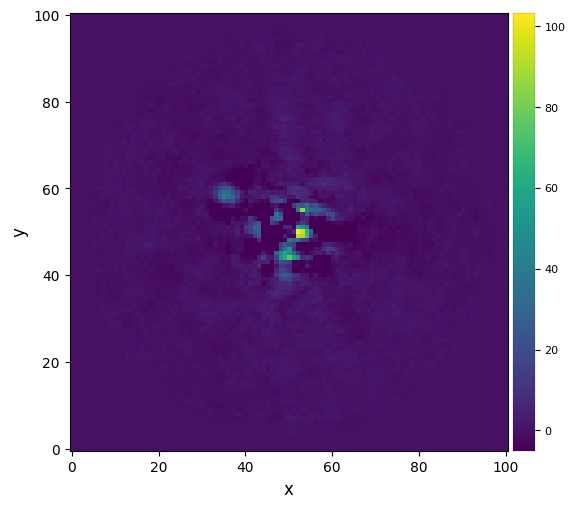

In [49]:
if version.parse(vvip) >= version.parse("1.0.0"):
    plot_frames(fr_fdiff, vmin=-5)

[Go to the top](#Table-of-contents)

## 5.3. Least-squares approximation - LOCI

A continuation of the idea of imposing a rotation/PA threshold was proposed by Lafreniere et al. 2007, but this time working in annular patches and using a more sophisticated model PSF. In this case the model PSF is built as a linear combination of the remaining frames (after discarding the ones that have not rotated enough). 

In [50]:
fr_lstsq = vip.leastsq.xloci(cube, angs, fwhm=fwhm_naco, asize=fwhm_naco, n_segments='auto', nproc=1, 
                             metric='correlation', dist_threshold=90, delta_rot=0.1, optim_scale_fact=2,
                             solver='lstsq', tol=0.01, imlib=imlib_rot, interpolation=interpolation)

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Starting time: 2021-09-10 16:23:44
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Building 10 annuli:
Ann 1    PA thresh: 11.42    Ann center:   2    N segments: 2 
Ann 2    PA thresh:  3.82    Ann center:   7    N segments: 3 
Ann 3    PA thresh:  2.29    Ann center:  12    N segments: 5 
Ann 4    PA thresh:  1.64    Ann center:  16    N segments: 7 
Ann 5    PA thresh:  1.27    Ann center:  21    N segments: 9 
Ann 6    PA thresh:  1.04    Ann center:  25    N segments: 11 
Ann 7    PA thresh:  0.88    Ann center:  30    N segments: 12 
Ann 8    PA thresh:  0.76    Ann center:  35    N segments: 14 
Ann 9    PA thresh:  0.67    Ann center:  39    N segments: 16 
Ann 10    PA thresh:  0.62    Ann center:  43    N segments: 18 
Patch-wise least-square combination and subtraction:
0% [##############################] 100% | ETA: 00:00:00
Total time elapsed: 00:00:10
Done pro

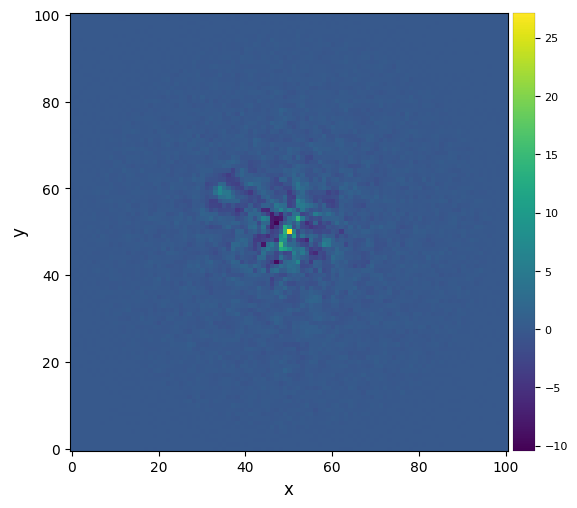

In [51]:
plot_frames(fr_lstsq)

[Go to the top](#Table-of-contents)

## 5.4. Full-frame PCA

Now let's try the PCA-based algorithms (Amara & Quanz 2012, Soummer et al. 2012) in `vip.pca`. As a reminder, below is a schematics summarizing how PCA-ADI works: 

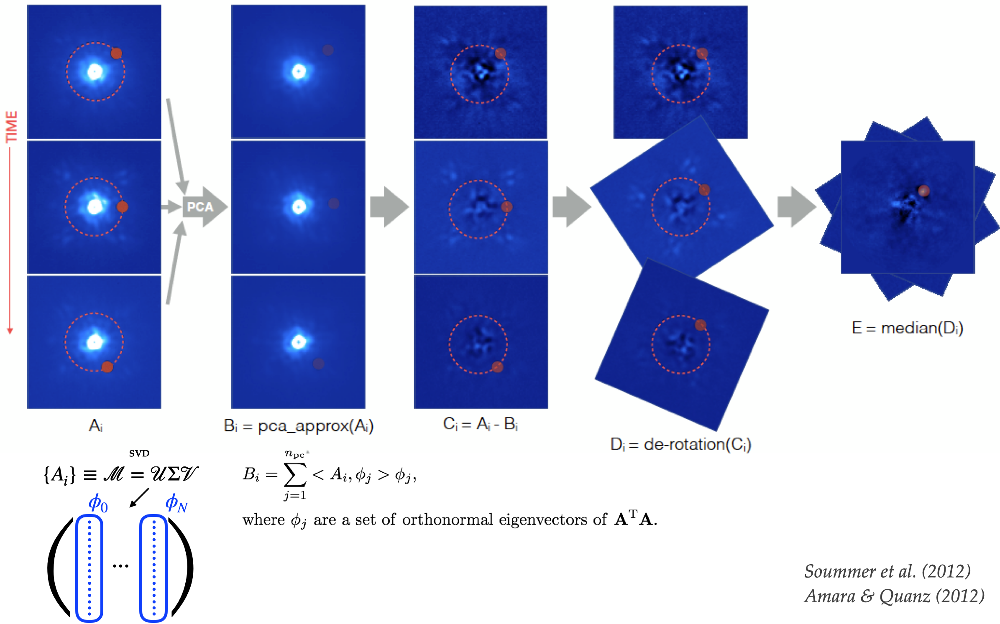

**Figure 5.2** - PCA-ADI concept. Compared to median-ADI (Fig. 3.1), only the model used for subtraction is refined. It is constructed from the projection of each image on the first $n_{\rm pc}$ principal components. The principal components are typically found by singular value decomposition, after converting the observed sequence of images $A_i$ into a 2D matrix (rows: time dimension, columns: linearized version of the images).

The `svd_mode` argument sets how the Singular Value Decomposition should be calculated. 'lapack' is the default mode (exact SVD calculation by CPU through `numpy`), although other options may get faster results depending on input matrix and your machine (see description of `svd_mode` argument).

In [52]:
fr_pca1 = vip.pca.pca(cube, angs, ncomp=5, mask_center_px=None, imlib=imlib_rot, interpolation=interpolation,
                      svd_mode='lapack')

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Starting time: 2021-09-10 16:23:58
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
System total memory = 17.180 GB
System available memory = 6.377 GB
Done vectorizing the frames. Matrix shape: (61, 10201)
Done SVD/PCA with numpy SVD (LAPACK)
Running time:  0:00:00.051228
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Done de-rotating and combining
Running time:  0:00:03.299300
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――


Here we compare the median subtraction with the PCA result (on the right). The improvement is clear:

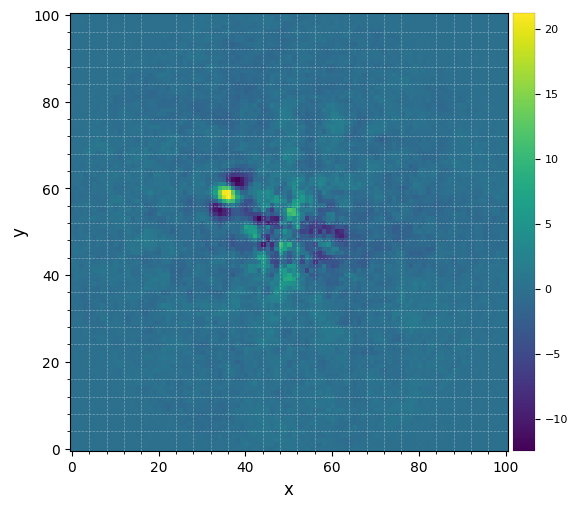

In [53]:
plot_frames(fr_pca1, grid=True)

The point-like source to the north-east shows up much more clearly. Let's see whether it is significant. Using the plot_frames() output with a grid, allows the coordinates of the point-like source to be estimated:

In [54]:
xy_b = (35.5,58.5)

In [55]:
snrmap1 = vip.metrics.snrmap(fr_pca1, fwhm_naco, plot=False)

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Starting time: 2021-09-10 16:24:02
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
S/N map created using 2 processes
Running time:  0:00:16.972185
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――


/Users/Valentin/GitHub/VIP/vip_hci/metrics/snr_source.py:121: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  res = np.array(res)


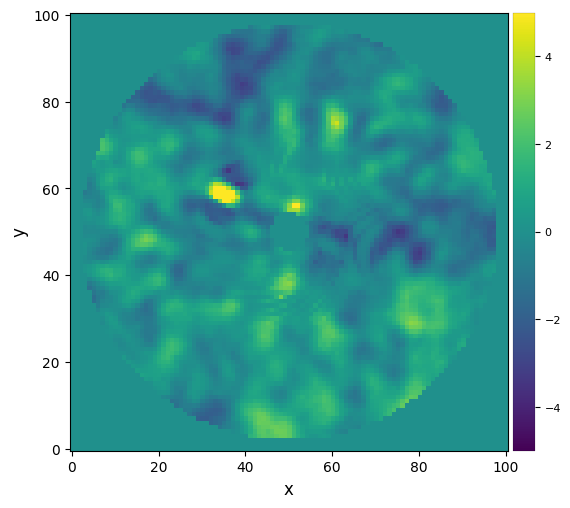

In [56]:
plot_frames(snrmap1, vmin=-5, vmax=5)

In [57]:
cy, cx = vip.var.frame_center(snrmap1)
rad = np.sqrt((cy-xy_b[1])**2+(cx-xy_b[0])**2)
snr1 = vip.metrics.snr(fr_pca1, source_xy=xy_b, fwhm=fwhm_naco)
print(r"S/N = {:.1f}".format(snr1))
sig = vip.metrics.significance(snr1, rad, fwhm_naco, student_to_gauss=True)
print(r"{:.1f} sigma detection".format(sig))

S/N = 7.2
5.0 sigma detection


Congratulations! The detection is significant! You obtained a conspicuous direct image of an exoplanet! It is bordered with two negative side lobes which are characteristic of point sources imaged with ADI-based algorithms. Although from this image (at a single wavelength) alone one cannot disentangle a true physically bound companion from a background star, this source has now been studied and followed-up extensively: it corresponds to the giant planet Beta Pic b (e.g. [Lagrange et al. 2009](https://ui.adsabs.harvard.edu/abs/2009A%26A...493L..21L/abstract), [Absil et al. 2013](https://ui.adsabs.harvard.edu/abs/2013A%26A...559L..12A/abstract)).

<font color=orange> **Question 5.3**: What is the origin of the negative side lobes? 
    
**Question 5.4**: Are they always expected to be symmetric? </font>

[Go to the top](#Table-of-contents)

### 5.4.1. Optimizing the number of PCs for full-frame ADI PCA

Clearly, modeling the background (leaked starlight + static and quasi-static speckles) with PCA leads to better images than subtracting a median frame. We chose 4 principal components (PCs), which greatly reduced the residual noise. A different number of PCs may lead to an even better detection.

With the function below we can find the optimal number of PCs for a blob at a given `source_xy` location in the image:

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Starting time: 2021-09-10 16:24:20
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
System total memory = 17.180 GB
System available memory = 6.376 GB
Done SVD/PCA with numpy SVD (LAPACK)
Running time:  0:00:00.051156
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――


/Users/Valentin/GitHub/VIP/vip_hci/pca/utils_pca.py:262: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  snr_pixels = np.array(res)[:, -1]
/Users/Valentin/GitHub/VIP/vip_hci/pca/utils_pca.py:263: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  fluxes = np.array(res)[:, 2]


Number of steps 31
Optimal number of PCs = 15, for S/N=8.919
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Coords of chosen px (X,Y) = 35.5, 58.5
Flux in a centered 1xFWHM circular aperture = 92.476
Central pixel S/N = 10.526
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Inside a centered 1xFWHM circular aperture:
Mean S/N (shifting the aperture center) = 8.919
Max S/N (shifting the aperture center) = 11.124
stddev S/N (shifting the aperture center) = 2.193



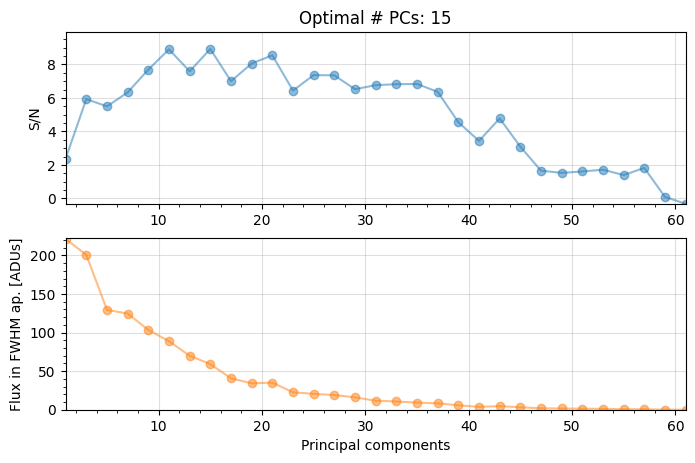

In [58]:
fr_pca2 = vip.pca.pca(cube, angs, fwhm=fwhm_naco, source_xy=xy_b, mask_center_px=None, 
                      ncomp=(1, 61, 2), imlib=imlib_rot, interpolation=interpolation)

<font color=orange> **Question 5.5**: Why is the shape of the S/N vs Principal components curve as seen above (i.e. increasing and then decreasing again)? </font>

Now let's look at the image computed using 17 PCs and compute the S/N maps:

In [59]:
snrmap1 = vip.metrics.snrmap(fr_pca1, fwhm_naco, plot=False)
snrmap2 = vip.metrics.snrmap(fr_pca2, fwhm_naco, plot=False)

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Starting time: 2021-09-10 16:25:57
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
S/N map created using 2 processes
Running time:  0:00:15.365015
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Starting time: 2021-09-10 16:26:12
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
S/N map created using 2 processes
Running time:  0:00:16.138456
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――


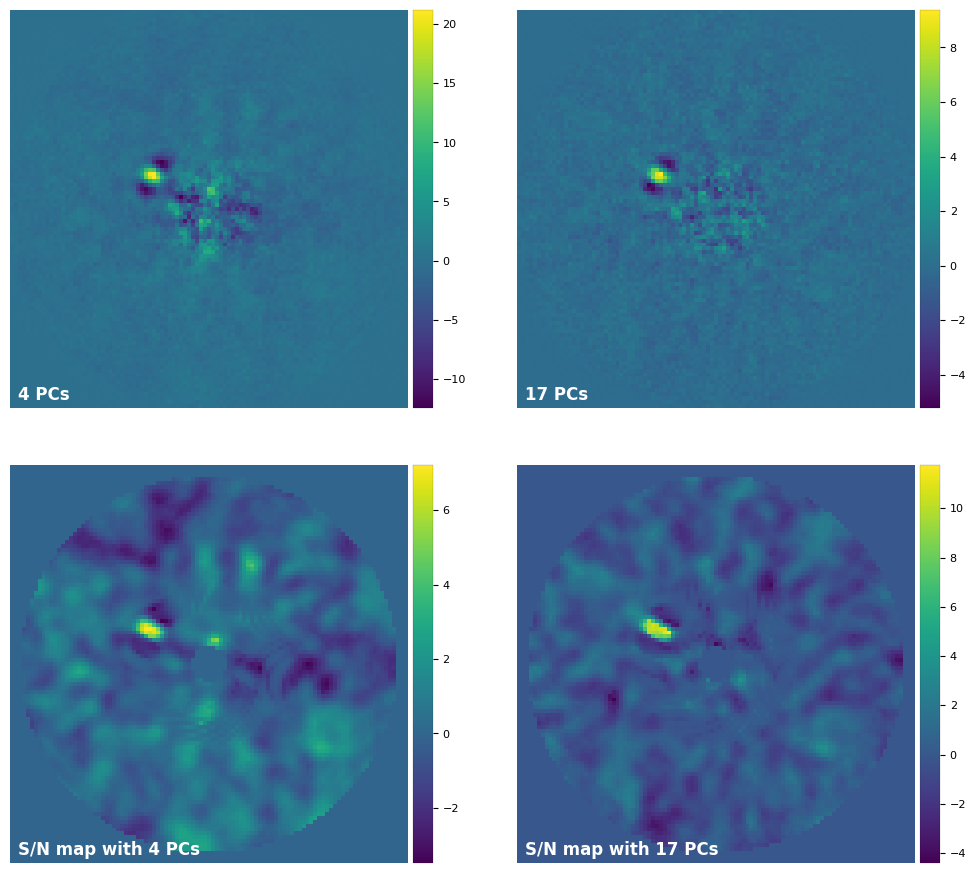

In [60]:
plot_frames((fr_pca1, fr_pca2, snrmap1, snrmap2), rows=2, dpi=100, colorbar=True, axis=False, versp=0.01, horsp=0.2,
            label=('4 PCs', '17 PCs', 'S/N map with 4 PCs', 'S/N map with 17 PCs'), label_pad=8)

In [61]:
snr2 = vip.metrics.snr(fr_pca2, source_xy=xy_b, fwhm=fwhm_naco)
print(r"S/N = {:.1f}".format(snr2))
sig = vip.metrics.significance(snr2, rad, fwhm_naco, student_to_gauss=True)
print(r"{:.1f} sigma detection".format(sig))

S/N = 10.5
6.1 sigma detection


With 17 PCs we've increased the S/N and significance of the detection (although the recovered flux is smaller).

<font color='orange'> **Question 5.6**: The result above was obtained for the full-frame PCA algorithm. For a given point source (i.e. at a given radius), is the optimal npc expected to be the same for PCA on an annulus (at the radial separation of the point source) and PCA on full frame? If not, would you intuitively expect it to be lower or higher for PCA on concentric annuli? </font> 

The answer to Q5.4 will come in [Section 5.6](#5.6.-PCA-in-a-single-annulus). 

<font color=green> **Answer 5.3**: The negative side lobes stem from the presence of the point source in the constructed model used for subtraction. Since the field of view is rotating, the point source will span a range of position angles, and the stellar halo model built for subtraction for each frame of the cube (step B) will typically include some signal from the rotating point-source. 
    
**Answer 5.4**: The negative side lobes are not *necessarily* symmetric, as the field rotation rate (hence the rate at which the point source rotates) varies during the observation. The parallactic angle variation is the fastest when the target crosses the meridian. That being said, well-designed ADI observations typically aim for maximal field rotation, which is the case for an observation that is centered around meridian crossing, hence typically resulting in relatively symmetric negative signatures. </font>

<font color=green> **Answer 5.5**: The S/N first increases with $n_{\rm pc}$ due to a better modeling of the speckle pattern by including more PCs. After reaching the optimal $n_{\rm pc}$, the planet self-subtraction starts to dominate (i.e. a large $n_{\rm pc}$ will systematically lead to overfitting of the stellar PSF). </font>

[Go to the top](#Table-of-contents)

### 5.4.2. Full-frame ADI PCA with a PA rejection criterion

This dataset has a good range of rotation:

Text(0, 0.5, 'Derotation angles')

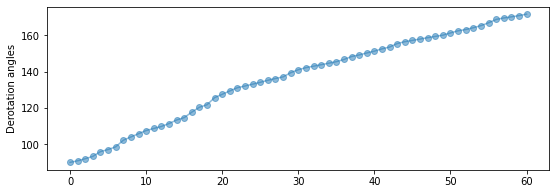

In [62]:
figure(figsize=(9,3))
plot(angs, 'o-', alpha=0.5)
ylabel('Derotation angles')

<font color=orange> **Question 5.7** For a given observatory, where are the most ideal targets (in terms of celestial coordinates) to apply the ADI strategy (i.e. the ones leading to an optimal parallactic angle variation)? </font>

We can partially avoid the companion self-subtraction with full-frame PCA by applying a PA threshold for a given distance from the center (exploiting the ~80 degrees of rotation). The PCA function in ``VIP`` accepts a parameter `source_xy` for defining this location and the corresponding PA threshold. The parameter `delta_rot` sets the amount of rotation in terms of the FWHM for rejecting frames from the library.

In [63]:
fr_pca_optlib = vip.pca.pca(cube, angs, ncomp=30, source_xy=xy_b, delta_rot=1, fwhm=fwhm_naco,
                            imlib=imlib_rot, interpolation=interpolation)

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Starting time: 2021-09-10 16:26:29
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
System total memory = 17.180 GB
System available memory = 6.443 GB
Size LIB: min=30.0 / 1st QU=33.0 / med=39.0 / 3rd QU=44.0 / max=52.0
Done de-rotating and combining
Running time:  0:00:04.104865
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――


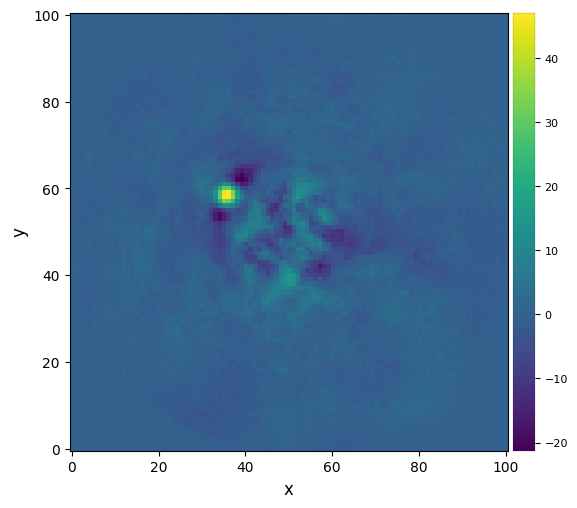

In [64]:
plot_frames(fr_pca_optlib)

<font color=orange> **Question 5.8**: As can be seen above, a PA threshold reduces the self-subtraction (notice the maximum in the scale), but also leads to a less efficient modeling and subtraction of speckle in the innermost part of the image. 
Why is that so?</font>

We can have a quick report on the last two frames by choosing a position with `source_xy`:

In [65]:
vip.metrics.snr(fr_pca2, xy_b, fwhm_naco, verbose=True)

S/N for the given pixel = 10.526
Integrated flux in FWHM test aperture = 92.476
Mean of background apertures integrated fluxes = -2.601
Std-dev of background apertures integrated fluxes = 8.825


10.526079929088564

In [66]:
vip.metrics.snr(fr_pca_optlib, xy_b, fwhm_naco, verbose=True)

S/N for the given pixel = 7.634
Integrated flux in FWHM test aperture = 525.430
Mean of background apertures integrated fluxes = -25.312
Std-dev of background apertures integrated fluxes = 70.483


7.6341728668227375

The companion flux on ``fr_pca_optlib`` is much larger than on ``fr_pca2`` (best full-frame PCA frame without the application of a rotation threshold) because we've reduced self-subtraction (companion over subtraction). On the other hand, the S/N has decreased due to the less smooth background at the same separation.

<font color=green> **Answer 5.7** Targets with a declination $\delta$ very different to the latitude $L$ of the observatory will have a very slow parallactic angle variation rate, and are hence not ideal for ADI. On the other extreme, an object whose $\delta$ matches almost exactly $L$ (within a few degrees) will have all the field rotation happening in a matter of minutes, around the time when the object crosses the local meridian (north-south imaginary line) - called transit. This is not ideal either. The best targets for ADI are thus the ones where $|\delta-L|$ is neither too small ($>5$deg) nor too large ($\lesssim 35$deg), as is the case for beta Pic as observed from the Very Large Telescope ($|\delta-L| \approx 27$deg) </font>

<font color=green> **Answer 5.8** A constant PA threshold implies that for a given image to be modeled, the PCA library will be built using images taken further away in time (hence with less correlated speckle) for the innermost annuli compared to outer annuli. This in turn can lead to a less efficient speckle subtraction. </font>

[Go to the top](#Table-of-contents)

### 5.4.3. PCA for big datacubes

Computing the PCA model can be a CPU and memory intensive procedure, when working with thousands of large frames, let's say cubes with shapes [10000, 600, 600]. Such cube won't fit on the memory of a normal laptop or desktop computer. With ``VIP`` we just need to provide a positive integer value to the ``batch`` parameter of the ``pca`` function. Let's compute the incremental PCA on our toy cube (even if its size does not require it):

In [67]:
fr_increm = vip.pca.pca(cube, angs, ncomp=19, fwhm=fwhm_naco, batch=31, imlib=imlib_rot, interpolation=interpolation)

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Starting time: 2021-09-10 16:26:34
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
System total memory = 17.180 GB
System available memory = 6.428 GB
Cube size = 0.002 GB (61 frames)
Batch size = 31 frames (0.001 GB)

Batch 1/2	shape: (31, 101, 101)	size: 1.3 MB
Batch 2/2	shape: (30, 101, 101)	size: 1.2 MB
Running time:  0:00:00.148478
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――

Reconstructing and obtaining residuals
Running time:  0:00:03.363732
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――


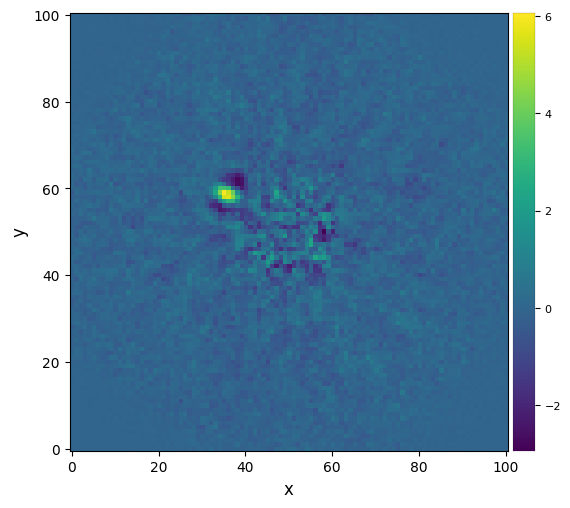

In [68]:
plot_frames(fr_increm)

[Go to the top](#Table-of-contents)

## 5.5. Annular PCA

We can exploit the range of rotation by using annular PCA approximations and applying a PA threshold for different annuli. This is the same idea used before but the PA threshold will be adjusted depending on the distance from the star. PCA can be computed in the whole annulus or in separate segments (``n_segments``). The computational cost increases accordingly.

The function `vip.pca.pca_annular` processes the cube in annular fashion in a serial or parallel way. The improvement in speed is noticeable in multi-core machines.

In [69]:
from vip_hci.pca import pca_annular

In [70]:
fr_pca_an15 = pca_annular(cube, angs, fwhm=fwhm_naco, ncomp=15, asize=fwhm_naco, delta_rot=0.2, nproc=None, 
                          svd_mode='lapack', imlib=imlib_rot, interpolation=interpolation)

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Starting time: 2021-09-10 16:26:38
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
N annuli = 10, FWHM = 4.603
PCA per annulus (or annular sectors):
Ann 1    PA thresh: 22.62    Ann center:   2    N segments: 1 
Ann 2    PA thresh:  7.63    Ann center:   7    N segments: 1 
Ann 3    PA thresh:  4.58    Ann center:  12    N segments: 1 
Ann 4    PA thresh:  3.27    Ann center:  16    N segments: 1 
Ann 5    PA thresh:  2.55    Ann center:  21    N segments: 1 
Ann 6    PA thresh:  2.08    Ann center:  25    N segments: 1 
Ann 7    PA thresh:  1.76    Ann center:  30    N segments: 1 
Ann 8    PA thresh:  1.53    Ann center:  35    N segments: 1 
Ann 9    PA thresh:  1.35    Ann center:  39    N segments: 1 
Ann 10    PA thresh:  1.23    Ann center:  43    N segments: 1 
Done derotating and combining.
Running time:  0:00:05.446262
―――――――――――――――――――――――――――――――――――――――――――――

The parameter `ncomp` can be set to *auto* for letting the algorithm define automatically the number of PCs for each patch (instead of fixing it for all of them) by minimizing the change in the standard deviation of the  residuals after the subtraction of the PCA approximation, when increasing the PCs. This procedure is similar to the Least-squares/LOCI. Note that this is different to finding the optimal $n_{\rm pc}$ that maximizes the S/N ratio of a given companion companiont (as the former does not require any companion). Let's try this with 3 segments per annulus:

In [71]:
fr_pca_auto = pca_annular(cube, angs, fwhm=fwhm_naco, ncomp='auto', svd_mode='lapack', asize=fwhm_naco, 
                          delta_rot=0.2, n_segments=3, tol=0.1, nproc=1, imlib=imlib_rot, 
                          interpolation=interpolation, verbose=True)

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Starting time: 2021-09-10 16:26:43
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
N annuli = 10, FWHM = 4.603
PCA per annulus (or annular sectors):
Ann 1    PA thresh: 22.62    Ann center:   2    N segments: 3 
Ann 2    PA thresh:  7.63    Ann center:   7    N segments: 3 
Ann 3    PA thresh:  4.58    Ann center:  12    N segments: 3 
Ann 4    PA thresh:  3.27    Ann center:  16    N segments: 3 
Ann 5    PA thresh:  2.55    Ann center:  21    N segments: 3 
Ann 6    PA thresh:  2.08    Ann center:  25    N segments: 3 
Ann 7    PA thresh:  1.76    Ann center:  30    N segments: 3 
Ann 8    PA thresh:  1.53    Ann center:  35    N segments: 3 
Ann 9    PA thresh:  1.35    Ann center:  39    N segments: 3 
Ann 10    PA thresh:  1.23    Ann center:  43    N segments: 3 
Done derotating and combining.
Running time:  0:00:11.296937
―――――――――――――――――――――――――――――――――――――――――――――

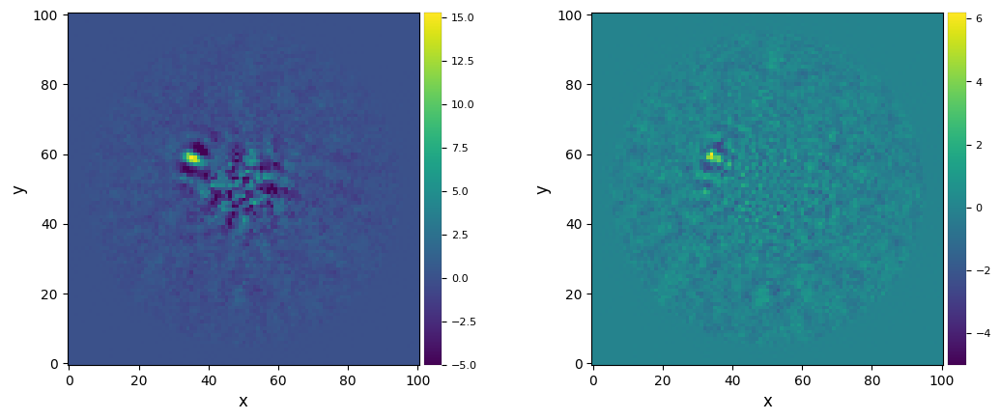

In [72]:
plot_frames((fr_pca_an15, fr_pca_auto), dpi=100, vmin=-5, colorbar=True)

In [73]:
_ = vip.metrics.snr(fr_pca_an15, fwhm=fwhm_naco, source_xy=xy_b, verbose=True)

S/N for the given pixel = 9.244
Integrated flux in FWHM test aperture = 128.743
Mean of background apertures integrated fluxes = -5.077
Std-dev of background apertures integrated fluxes = 14.143


In [74]:
_ = vip.metrics.snr(fr_pca_auto, fwhm=fwhm_naco, source_xy=xy_b, verbose=True)

S/N for the given pixel = 9.285
Integrated flux in FWHM test aperture = 28.147
Mean of background apertures integrated fluxes = -0.945
Std-dev of background apertures integrated fluxes = 3.061


Despite the relatively high S/N ratio, the planet appears significantly self-subtracted. This is because `delta_rot` was set to a low value. Setting it to a larger scalar value leads to a bug (feel free to test it). This is because for a given image to be modelled, there would not be enough images in the rest of the datacube complying with the PA threshold condition for the innermost annuli - hence not enough images in the PCA library. For more flexibility, `delta_rot` can also be set to a tuple of 2 values instead of a scalar. If a tuple, it corresponds to the PA thresholds for the innermost and outermost annuli in the image (linearly interpolated in between).

In [75]:
fr_pca_ddrot = pca_annular(cube, angs, fwhm=fwhm_naco, ncomp='auto', asize=fwhm_naco, delta_rot=(0.2,1), nproc=None, 
                          svd_mode='lapack', imlib=imlib_rot, interpolation=interpolation)

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Starting time: 2021-09-10 16:26:55
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
N annuli = 10, FWHM = 4.603
PCA per annulus (or annular sectors):
Ann 1    PA thresh: 22.62    Ann center:   2    N segments: 1 
Ann 2    PA thresh: 11.00    Ann center:   7    N segments: 1 
Ann 3    PA thresh:  8.64    Ann center:  12    N segments: 1 
Ann 4    PA thresh:  7.63    Ann center:  16    N segments: 1 
Ann 5    PA thresh:  7.06    Ann center:  21    N segments: 1 
Ann 6    PA thresh:  6.71    Ann center:  25    N segments: 1 
Ann 7    PA thresh:  6.46    Ann center:  30    N segments: 1 
Ann 8    PA thresh:  6.28    Ann center:  35    N segments: 1 
Ann 9    PA thresh:  6.14    Ann center:  39    N segments: 1 
Ann 10    PA thresh:  6.17    Ann center:  43    N segments: 1 
Done derotating and combining.
Running time:  0:00:07.851394
―――――――――――――――――――――――――――――――――――――――――――――

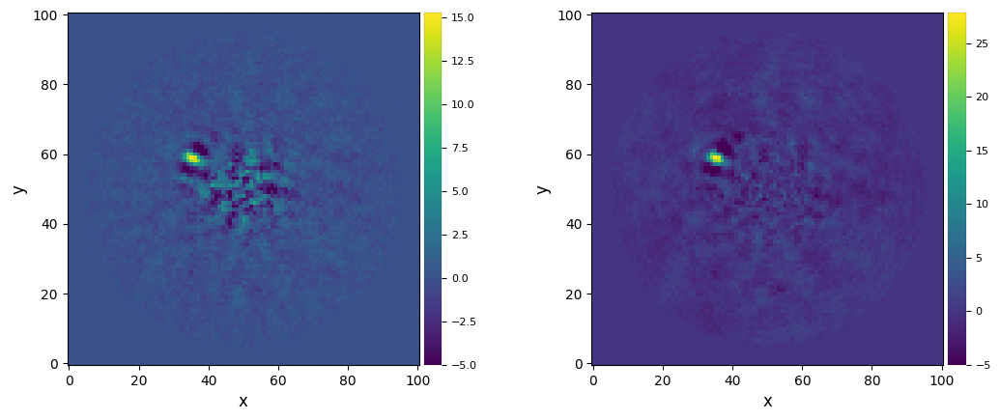

In [76]:
plot_frames((fr_pca_an15, fr_pca_ddrot), dpi=100, vmin=-5, colorbar=True)

In [77]:
_ = vip.metrics.snr(fr_pca_ddrot, fwhm=fwhm_naco, source_xy=xy_b, verbose=True)

S/N for the given pixel = 9.885
Integrated flux in FWHM test aperture = 237.169
Mean of background apertures integrated fluxes = -8.150
Std-dev of background apertures integrated fluxes = 24.246


## 5.6. PCA in a single annulus

Once a companion candidate has been identified, the fastest way to recover (and hence characterize it) is to only apply PCA on a single annulus encompassing the companion candidate. This is used in particular for the characterization of companion candidates with the negative fake companion technique (NEGFC; [Section 8](#8.-Flux-and-position-estimation-with-NEGFC))

Let's now use `vip.pca.pca_grid` to answer Q5.6 we posed earlier: <font color=orange> Is the optimal number of PCs the same for full-frame PCA and PCA in an annulus? </font>

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Starting time: 2021-09-10 16:27:04
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Done SVD/PCA with numpy SVD (LAPACK)
Running time:  0:00:00.043728
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――


/Users/Valentin/GitHub/VIP/vip_hci/pca/utils_pca.py:262: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  snr_pixels = np.array(res)[:, -1]
/Users/Valentin/GitHub/VIP/vip_hci/pca/utils_pca.py:263: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  fluxes = np.array(res)[:, 2]


Number of steps 31
Optimal number of PCs = 15, for S/N=8.919
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Coords of chosen px (X,Y) = 35.5, 58.5
Flux in a centered 1xFWHM circular aperture = 92.476
Central pixel S/N = 10.526
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Inside a centered 1xFWHM circular aperture:
Mean S/N (shifting the aperture center) = 8.919
Max S/N (shifting the aperture center) = 11.124
stddev S/N (shifting the aperture center) = 2.193

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Starting time: 2021-09-10 16:28:42
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Done SVD/PCA with numpy SVD (LAPACK)
Running time:  0:00:00.012045
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Number of steps 31
Optimal number of PCs = 7, for S/N=9.246
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――

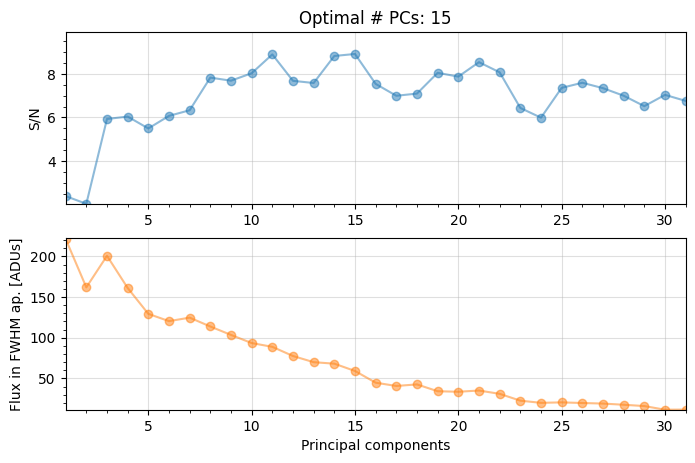

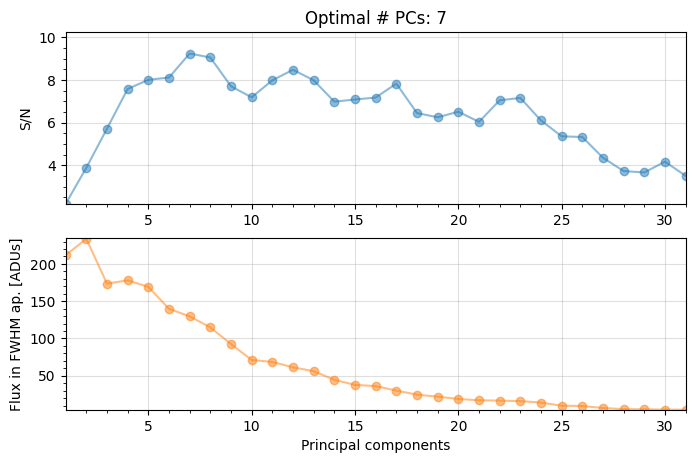

In [78]:
from vip_hci.pca import pca_grid

# full frame
res_ff_opt = pca_grid(cube, angs, fwhm=fwhm_naco, range_pcs=(1,31,1), source_xy=xy_b, mode='fullfr', 
                      imlib=imlib_rot, interpolation=interpolation, full_output=True, plot=True)

# single annulus with no PA threshold
res_ann_opt = pca_grid(cube, angs, fwhm=fwhm_naco, range_pcs=(1,31,1), source_xy=xy_b, mode='annular',
                       annulus_width=3*fwhm_naco, imlib=imlib_rot, interpolation=interpolation, full_output=True, plot=True)

In [79]:
_, final_ff_opt, _, opt_npc_ff = res_ff_opt
_, final_ann_opt, _, opt_npc_ann = res_ann_opt

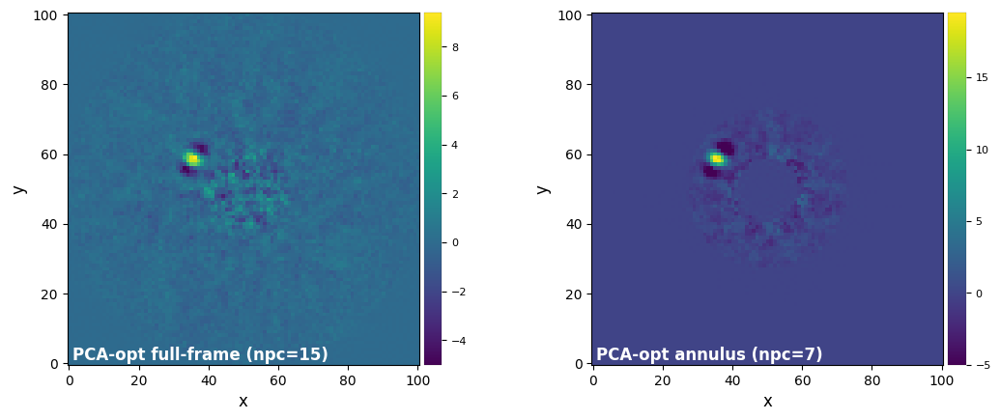

In [80]:
plot_frames((final_ff_opt, final_ann_opt), label=('PCA-opt full-frame (npc={:.0f})'.format(opt_npc_ff), 
                                                  'PCA-opt annulus (npc={:.0f})'.format(opt_npc_ann)),
            dpi=100, vmin=-5, colorbar=True)

<font color='green'> **Answer 5.6**: The optimal $n_{\rm pc}$ is found to be significantly lower for PCA on an annulus. Intuitively, one could expect this result due to the smaller number of pixels in the annular case compared to the full frame case. With less pixels (i.e. a smaller matrix for singular value decomposition), a lower $n_{\rm pc}$ is sufficient to achieve similar (or better) modeling of speckle, and conversely a lower $n_{\rm pc}$ is able to cause overfitting. </font> 

[Go to the top](#Table-of-contents)

## 5.7. Full-frame NMF

A PSF reference can be modelled using a low-rank approximation different than PCA (which relies on singular value decomposition). Non-negative matrix factorization can be used instead (Gomez Gonzalez et al. 2017; Ren et al. 2018, 2020). Instead of $M = U\Sigma V$ (SVD), non-negative matrix factorization can be written as $M = \mathcal{W} \mathcal{H}$, where both matrices are non-negative, and the columns of $\mathcal{H}$ are the non-zero components onto which the images are projected (note that the residuals can be negative though).

The two matrices are typically found iteratively. Currently, the default method in VIP is based on the `scikit-learn` implementation of NMF, which uses the principal components obtained by SVD as first guess of the iterative process. Therefore, the results can look fairly similar to PCA, in particular if the PCs are already mostly non-negative.

In [81]:
fr_nmf = vip.nmf.nmf(cube, angs, ncomp=14, max_iter=10000, init_svd='nndsvdar', mask_center_px=None, imlib=imlib_rot, 
                    interpolation=interpolation)

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Starting time: 2021-09-10 16:30:20
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Running time:  0:00:03.722965
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Done NMF with sklearn.NMF.
Running time:  0:00:03.728885
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Done derotating and combining.
Running time:  0:00:07.045032
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――


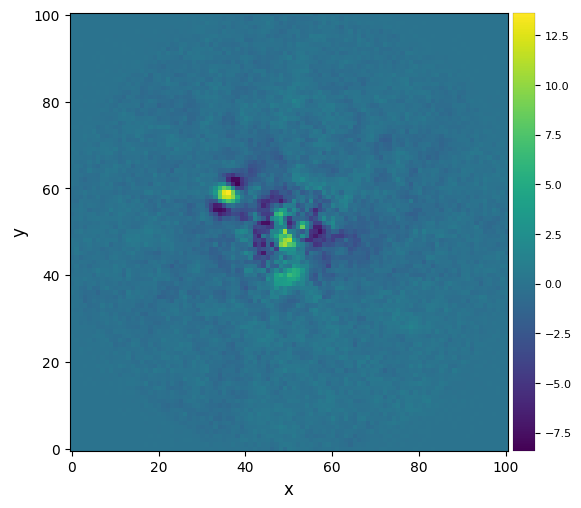

In [82]:
plot_frames(fr_nmf, dpi=100, colorbar=True)

In [83]:
_ = vip.metrics.snr(fr_nmf, fwhm=fwhm_naco, source_xy=xy_b, verbose=True)

S/N for the given pixel = 8.048
Integrated flux in FWHM test aperture = 126.547
Mean of background apertures integrated fluxes = -14.212
Std-dev of background apertures integrated fluxes = 17.087


[Go to the top](#Table-of-contents)

## 5.8. Annular NMF

Same as above, but in concentric annuli (new in v1.0.0).

In [84]:
if version.parse(vvip) >= version.parse("1.0.0"):
    fr_nmf_ann = vip.nmf.nmf_annular(cube, angs, ncomp=9, max_iter=10000, init_svd='nndsvdar', radius_int=0, 
                                     fwhm=fwhm_naco, asize=fwhm_naco, imlib=imlib_rot, interpolation=interpolation)

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Starting time: 2021-09-10 16:30:28
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
N annuli = 10, FWHM = 4.603
PCA per annulus (or annular sectors):
Ann 1    PA thresh: 11.42    Ann center:   2    N segments: 1 
Ann 2    PA thresh:  7.63    Ann center:   7    N segments: 1 
Ann 3    PA thresh:  6.87    Ann center:  12    N segments: 1 
Ann 4    PA thresh:  6.54    Ann center:  16    N segments: 1 
Ann 5    PA thresh:  6.36    Ann center:  21    N segments: 1 
Ann 6    PA thresh:  6.24    Ann center:  25    N segments: 1 
Ann 7    PA thresh:  6.16    Ann center:  30    N segments: 1 
Ann 8    PA thresh:  6.11    Ann center:  35    N segments: 1 
Ann 9    PA thresh:  6.06    Ann center:  39    N segments: 1 
Ann 10    PA thresh:  6.17    Ann center:  43    N segments: 1 
Done derotating and combining.
Running time:  0:01:38.711821
―――――――――――――――――――――――――――――――――――――――――――――

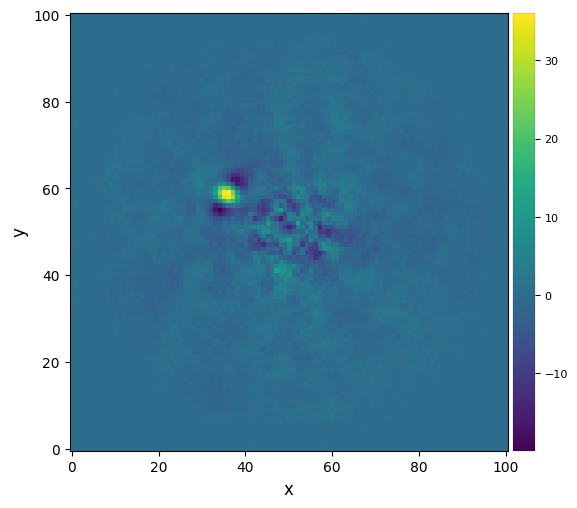

In [85]:
if version.parse(vvip) >= version.parse("1.0.0"):
    plot_frames(fr_nmf_ann, dpi=100, colorbar=True)

In [86]:
if version.parse(vvip) >= version.parse("1.0.0"):
    _ = vip.metrics.snr(fr_nmf_ann, fwhm=fwhm_naco, source_xy=xy_b, verbose=True)

S/N for the given pixel = 8.722
Integrated flux in FWHM test aperture = 370.591
Mean of background apertures integrated fluxes = -13.546
Std-dev of background apertures integrated fluxes = 43.032


――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Starting time: 2021-09-10 16:32:07
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――


/Users/Valentin/GitHub/VIP/vip_hci/metrics/snr_source.py:121: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  res = np.array(res)


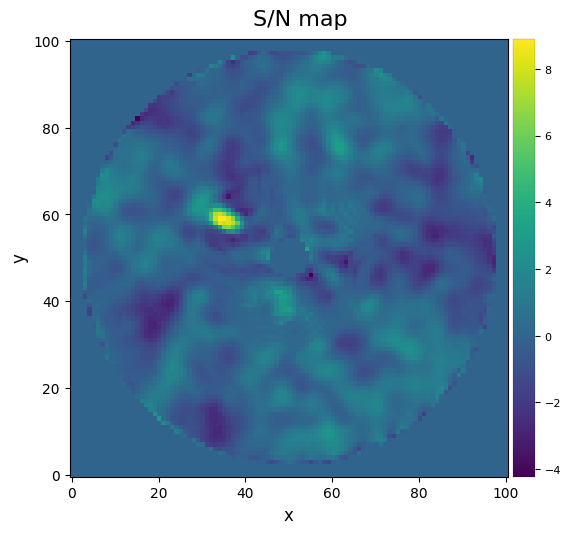

S/N map created using 2 processes
Running time:  0:00:13.973518
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――


In [87]:
snrmap_nmf_ann = vip.metrics.snrmap(fr_nmf_ann, fwhm_naco, plot=True)

## 5.9. LLSG

Local Low-rank plus Sparse plus Gaussian-noise decomposition (Gomez Gonzalez et al. 2016) proposes a three terms decomposition to improve the detectability of point-like sources in ADI data. It aims at decomposing ADI cubes into L+S+G (low-rank, sparse and Gaussian noise) terms. Separating the noise from the S component (where the moving planet should stay) allows us to increase the S/N of potential planets.


Let's try it out:

In [88]:
fr_llsg = vip.llsg.llsg(cube, angs, fwhm_naco, rank=5, thresh=1, max_iter=20, random_seed=10, 
                        imlib=imlib_rot, interpolation=interpolation)

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Starting time: 2021-09-10 16:32:21
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Annuli = 5
Processing annulus: 
1 : in_rad=0, n_segm=4
2 : in_rad=10, n_segm=4
3 : in_rad=20, n_segm=4
4 : in_rad=30, n_segm=4
5 : in_rad=40, n_segm=4

Running time:  0:00:04.396341
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――


Let's plot it along the full-frame ADI PCA result, after the optimization of the number of PCs:

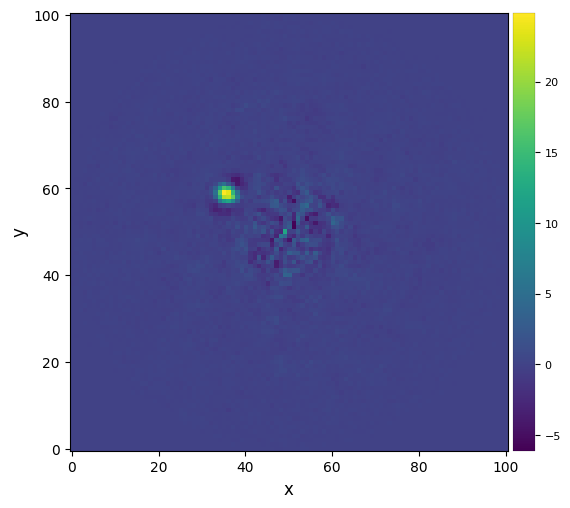

In [89]:
plot_frames(fr_llsg)

In [90]:
_ = vip.metrics.snr(fr_llsg, fwhm=fwhm_naco, source_xy=xy_b, verbose=True)

S/N for the given pixel = 36.127
Integrated flux in FWHM test aperture = 236.344
Mean of background apertures integrated fluxes = -1.492
Std-dev of background apertures integrated fluxes = 6.432


The computation of the S/N map when the noise has been almost totally supressed becomes problematic (both from a theoretical and computational points of view), but nevertheless let's compute it:

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Starting time: 2021-09-10 16:32:26
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――


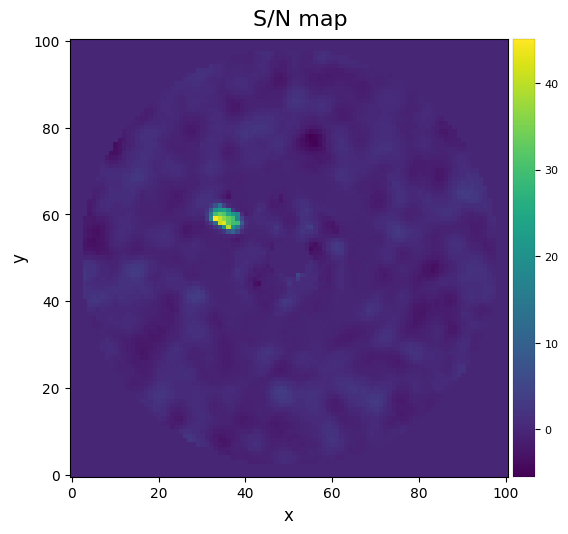

S/N map created using 2 processes
Running time:  0:00:13.066235
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――


In [91]:
snrmap_llsg = vip.metrics.snrmap(fr_llsg, fwhm_naco, plot=True)

[Go to the top](#Table-of-contents)

## 5.10. Mosaic with the ADI model PSF subtraction techniques so far

Let's take a look at the final residual frames produced by the different algorithms:

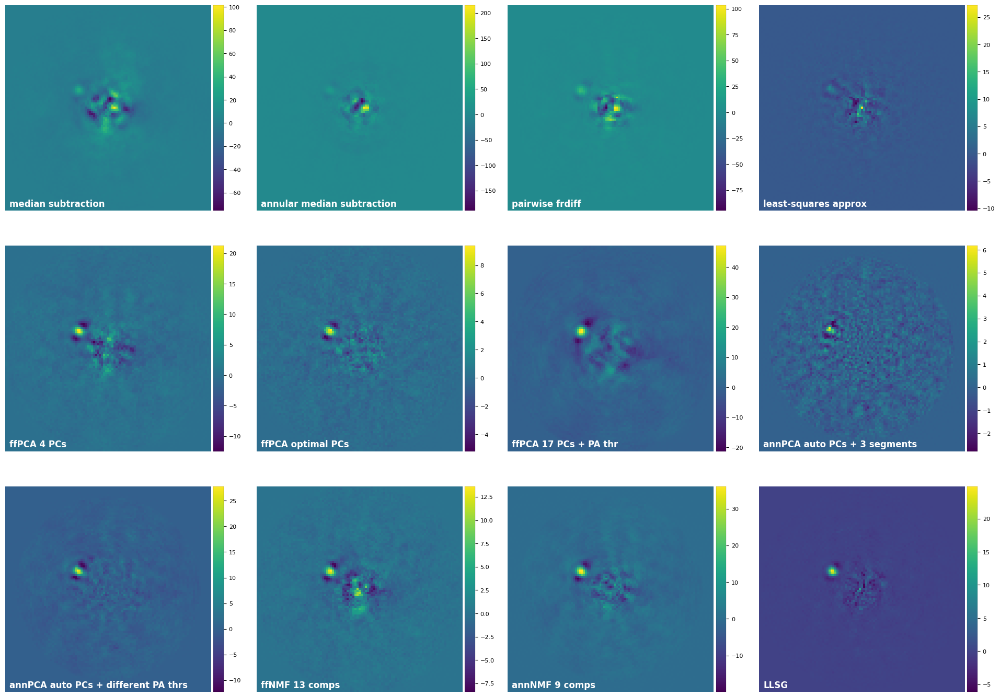

In [92]:
plot_frames((fr_adi, fr_adi_an, fr_fdiff, fr_lstsq, fr_pca1, fr_pca2, fr_pca_optlib, 
             fr_pca_auto, fr_pca_ddrot, fr_nmf, fr_nmf_ann, fr_llsg), 
            rows=3, colorbar=True, label_size=12, label_pad=8, axis=False, versp=0.05, horsp=0.15, 
            label=('median subtraction', 'annular median subtraction', 'pairwise frdiff', 'least-squares approx', 
                   'ffPCA 4 PCs', 'ffPCA optimal PCs', 'ffPCA 17 PCs + PA thr', 'annPCA auto PCs + 3 segments', 
                   'annPCA auto PCs + different PA thrs', 'ffNMF 13 comps', 'annNMF 9 comps','LLSG'))

[Go to the top](#Table-of-contents)

# 6. Detection function

Let's try the detection module, providing the processed frame, the FWHM in pixels and a PSF (i.e. what a planet should look like). Take a look at the help/docstring for a detailed explanation of the function. Depending on the `mode` the results can be different. As a final step a S/N minimum criterion can be checked, with `snr_thresh`.

We'll try a computer vision blob-detection method, the Laplacian of Gaussian filter (http://scikit-image.org/docs/dev/api/skimage.feature.html#skimage.feature.blob_log) on the median subtracted frame and the annular PCA.

Blobs found: 4
 ycen   xcen
------ ------
66.549 	 63.539
54.151 	 65.786
68.620 	 45.431
64.095 	 56.864

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
X,Y = (53.5,56.5)
S/N constraint NOT fulfilled (S/N = 1.895)

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
X,Y = (55.8,44.2)
S/N constraint NOT fulfilled (S/N = 0.866)

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
X,Y = (35.4,58.6)
S/N constraint NOT fulfilled (S/N = 2.657)

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
X,Y = (46.9,54.1)
S/N constraint NOT fulfilled (S/N = -0.518)
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――


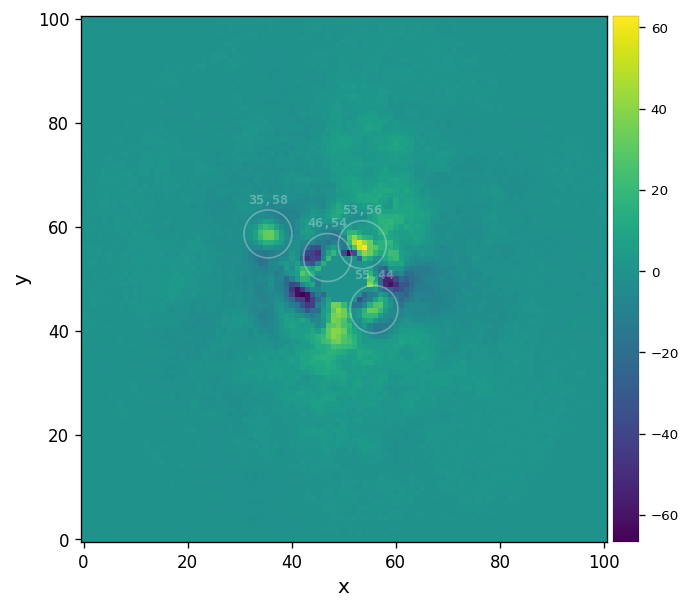

,y,x


In [93]:
vip.metrics.detection(fr_adi, fwhm=fwhm_naco, psf=psfn, debug=False, mode='log', snr_thresh=5, 
                      bkg_sigma=5, matched_filter=False)

Planet *b* is highlighted but with rather small S/N (~2). We note that a number of other much less convicing blobs are also highlighted. We can try the frame obtained with annular PCA:

Blobs found: 1
 ycen   xcen
------ ------
69.119 	 44.396

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
X,Y = (34.4,59.1)
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Coords of chosen px (X,Y) = 34.4, 59.1
Flux in a centered 1xFWHM circular aperture = 36.560
Central pixel S/N = 8.612
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Inside a centered 1xFWHM circular aperture:
Mean S/N (shifting the aperture center) = 5.469
Max S/N (shifting the aperture center) = 9.476
stddev S/N (shifting the aperture center) = 2.782

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――


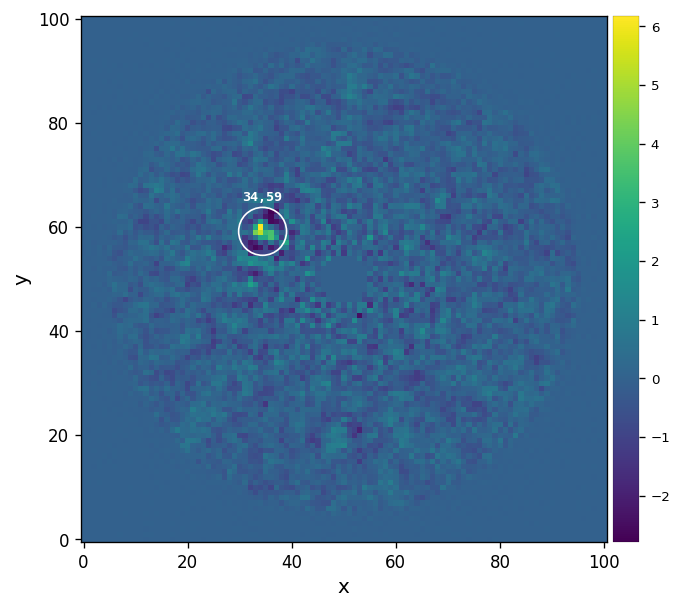

,y,x
0,59.119349,34.396232


In [94]:
vip.metrics.detection(fr_pca_auto, fwhm=fwhm_naco, psf=psfn, bkg_sigma=5, debug=False, mode='log', 
                      snr_thresh=5, plot=True, verbose=True)

Note that one should take the results obtained by this automatic detection algorithm with a pinch of salt (see. e.g the signals at the edge of the inner mask). It is unlikely to detect point sources better then can be inferred from visual inspection by human eyes. Much more advanced machine learning techniques should be used to infer the presence of companions that cannot be detected from visual inspection of the final image, and with low false positive fraction (see e.g. [Gomez Gonzalez et al. 2018](https://ui.adsabs.harvard.edu/abs/2018A%26A...613A..71G/abstract)).

[Go to the top](#Table-of-contents)

# 7. Generating synthetic planets

With `VIP` we can inject fake companions at arbitrary fluxes and locations, using the normalized PSF. Some procedures, e.g. the negative fake companion technique and the contrast curve generation, heavily rely on the injection of fake companions. The coordinates for the injection are provided in the *derotated* image, while the actual injection occurs in the images of the input cube, i.e. in the *rotated* field.

In [95]:
from vip_hci.metrics import cube_inject_companions

In [96]:
cubefc = cube_inject_companions(cube, psf_template=psfn, angle_list=angs, flevel=400, plsc=pxscale_naco, 
                                rad_dists=[30.5], theta=240, n_branches=1, imlib='ndimage-fourier')

Branch 1:
	(X,Y)=(34.75, 23.59) at 0.83 arcsec (30.50 pxs from center)


Let's set the corresponding cartesian coordinates:

In [97]:
xy_test = (35,24)

Let's infer the optimal $n_{\rm pc}$ for PCA in a single annulus - this will be useful for NEGFC ([Section 8](#8.-Flux-and-position-estimation-with-NEGFC)). Note that the `pca_grid` function is the same as used internally by `vip.pca.pca` when `source_xy` is set and a tuple provided for `ncomp`.  The advantage of using it directly is that it returns the value of the optimal $n_{\rm pc}$.

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Starting time: 2021-09-10 16:32:43
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Done SVD/PCA with numpy SVD (LAPACK)
Running time:  0:00:00.015879
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――


/Users/Valentin/GitHub/VIP/vip_hci/pca/utils_pca.py:262: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  snr_pixels = np.array(res)[:, -1]
/Users/Valentin/GitHub/VIP/vip_hci/pca/utils_pca.py:263: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  fluxes = np.array(res)[:, 2]


Number of steps 41
Optimal number of PCs = 10, for S/N=11.862
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Coords of chosen px (X,Y) = 35.0, 24.0
Flux in a centered 1xFWHM circular aperture = 103.729
Central pixel S/N = 16.868
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Inside a centered 1xFWHM circular aperture:
Mean S/N (shifting the aperture center) = 11.862
Max S/N (shifting the aperture center) = 17.309
stddev S/N (shifting the aperture center) = 4.085



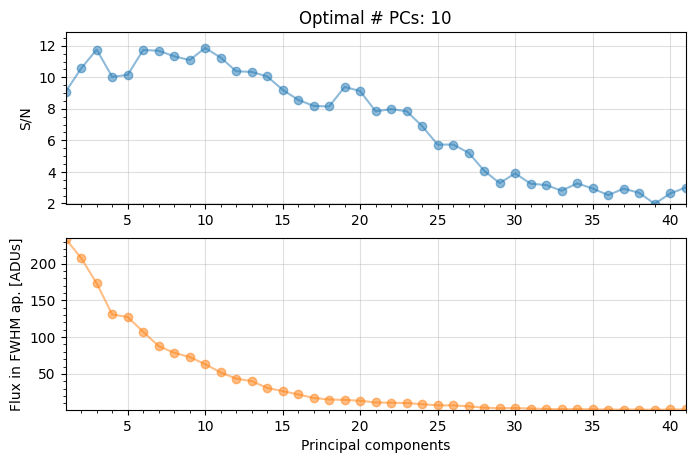

In [98]:
from vip_hci.pca import pca_grid

res_ann_opt = pca_grid(cubefc, angs, fwhm=fwhm_naco, range_pcs=(1,41,1), source_xy=xy_test, mode='annular',
                       annulus_width=4*fwhm_naco, full_output=True, plot=True)

In [99]:
_, final_ann_opt, _, opt_npc_ann = res_ann_opt

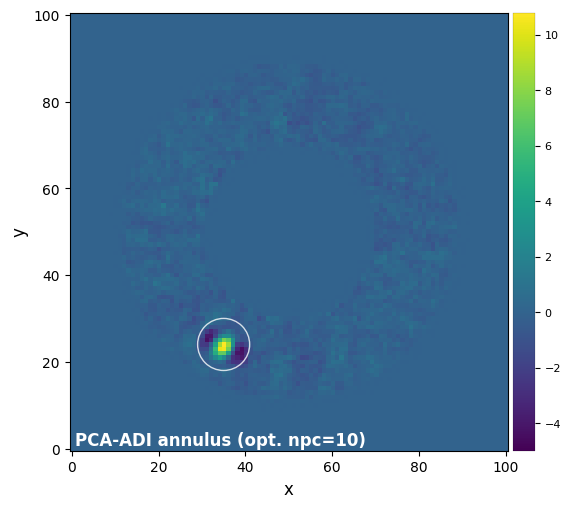

In [100]:
plot_frames(final_ann_opt, label='PCA-ADI annulus (opt. npc={:.0f})'.format(opt_npc_ann),
            dpi=100, vmin=-5, colorbar=True, circle=xy_test)

The grid search looking for the optimal number of principal components (npc) found that 10 principal components maximizes the S/N ratio of the injected fake companion. 

Note that the optimal number of PCs found for the injected fake companion is different to that found for Beta Pic b (10 vs 7; [Sec. 5.6](#5.6.-PCA-in-a-single-annulus)). This is because different $n_{\rm pc}$ values lead to a different trade-off between speckle modeling and self-subtraction/overfitting at different radii - the width of the annulus was also changed between the 2 tests. The radial dependency of optimal $n_{\rm pc}$ is a result also found in Meshkat et al. (2014).

[Go to the top](#Table-of-contents)

# 8. Flux and position estimation with NEGFC

When a companion candidate is detected, the next step is to characterize it, i.e. infer its exact position (astrometry) and flux (photometry). <font color=orange> **Question 8.1**: Why would a simple 2D Gaussian fit (as performed for the stellar PSF in Section 1) lead to biased results for the astrometry and photometry of a candidate companion? </font>

`VIP` implements the Negative fake companion (NEGFC) technique for robust extraction of the position and flux of detected point-like sources. The technique can be summarized as follow (see full description in [Wertz et al. 2017](https://ui.adsabs.harvard.edu/abs/2017A%26A...598A..83W/abstract)):

1) Estimate the position and flux of the planet, from either the visual inspection of reduced images or a previous estimator (see ABC below).

2) Scale (in flux) and shift the normalized off-axis PSF to remove the estimate from the input data cube.

3) Process the cube with PCA in a single annulus encompassing the point source.

4) Measure residuals in an aperture centered on the approximate location of the companion candidate.

5) Iterate on the position and flux of the injected negative PSF (steps 2-4), until the absolute residuals in the aperture are minimized (i.e. the injected negative companion flux and the position match exactly that of the true companion).

Iterations between steps 2-4 can be performed in one of 3 ways - sorted in increasing computation time and accuracy: 

A) a grid search on the flux only (provided a fixed estimate of the position) - in `vip.negfc.firstguess`;

B) a Nelder-Mead simplex algorithm - in `vip.negfc.firstguess`;

C) an MCMC sampler (which has the advantage to also yield uncertainties on each of the parameters of the point source) - in `vip.negfc.mcmc_negfc_sampling`.

The following default figure of merit is used for minimization (Wertz et al. 2017):
$$\chi^2 = \sum_j |I_j|,$$
where $j \in {1,...,N}$ and $N$ the total number of pixels contained in the circular aperture around the companion candidate.

[Go to the top](#Table-of-contents)

## 8.1. Nelder-Mead based optimization

With the function `vip.negfc.firstguess` we can obtain a first estimation of the flux and position by running A) a naive grid minimization (grid of values for the flux through parameter `f_range`), and B) a Nelder-mead based minimization (if the parameter `simplex` is set to *True*). The latter is done based on the preliminary guess of the grid minimization. The maximum number of iterations and error can be set with the parameter `simplex_options` as a dicitionary (see `scipy.minimize` function for the Nelder-Mead options).

In [101]:
from vip_hci.negfc import firstguess

Fisrt we define the position of the sources by examining a flux frame or S/N map. `source_xy` takes a list or array of X,Y pairs like ((x1,y1),(x2,y2)...(x_n,y_n)). Let's take the (approximate) coordinates of the previously injected companion. Also, let's set the # of PCs to 30, which is higher than the optimal value (for full-frame PCA) and leads to a more aggresive reduction:

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Starting time: 2021-09-10 16:32:50
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
             Planet 0           
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――

Planet 0: flux estimation at the position [35,24], running ...
Step | flux    | chi2r
1/100   0.000   545.892
2/100   50.505   485.462
3/100   101.010   424.949
4/100   151.515   364.521
5/100   202.020   305.939
6/100   252.525   253.847
7/100   303.030   213.271
8/100   353.535   189.275
9/100   404.040   186.180
10/100   454.545   213.103
11/100   505.051   257.139
12/100   555.556   308.600


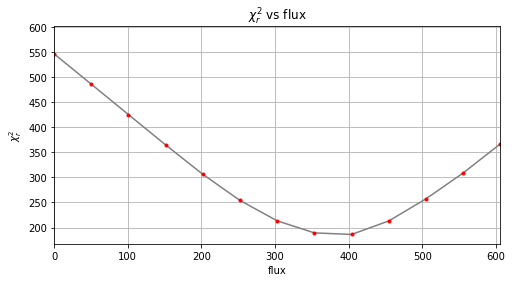

Planet 0: preliminary guess: (r, theta, f)=(30.0, 240.0, 404.0)
Planet 0: Simplex Nelder-Mead minimization, running ...
Planet 0: Success: True, nit: 84, nfev: 201, chi2r: 113.80924987792969
message: Optimization terminated successfully.
Planet 0: simplex result: (r, theta, f)=(30.509, 239.962, 382.282) at 
          (X,Y)=(34.73, 23.59)

 ―――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――― 
DONE !
 ――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Running time:  0:00:32.729338
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――


In [102]:
r_lo, theta_lo, f_lo = firstguess(cubefc, angs, psfn, ncomp=5, plsc=pxscale_naco,
                                  planets_xy_coord=[xy_test], fwhm=fwhm_naco, 
                                  f_range=None, annulus_width=4*fwhm_naco, aperture_radius=2,
                                  simplex=True, plot=True, verbose=True)

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Starting time: 2021-09-10 16:33:23
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
             Planet 0           
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――

Planet 0: flux estimation at the position [35,24], running ...
Step | flux    | chi2r
1/100   0.000   71.693
2/100   50.505   69.308
3/100   101.010   68.516
4/100   151.515   64.634
5/100   202.020   58.988
6/100   252.525   53.819
7/100   303.030   47.277
8/100   353.535   42.067
9/100   404.040   40.111
10/100   454.545   39.591
11/100   505.051   45.362
12/100   555.556   48.853
13/100   606.061   54.820


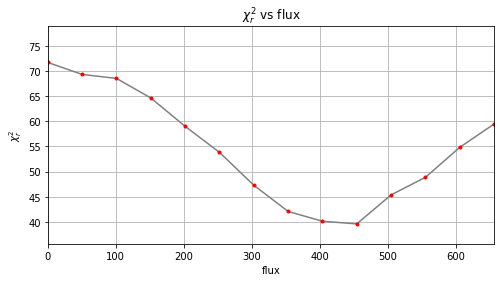

Planet 0: preliminary guess: (r, theta, f)=(30.0, 240.0, 454.5)
Planet 0: Simplex Nelder-Mead minimization, running ...
Planet 0: Success: True, nit: 83, nfev: 209, chi2r: 36.89762496948242
message: Optimization terminated successfully.
Planet 0: simplex result: (r, theta, f)=(30.149, 240.024, 427.297) at 
          (X,Y)=(34.94, 23.88)

 ―――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――― 
DONE !
 ――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Running time:  0:00:34.209248
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――


In [103]:
r_hi, theta_hi, f_hi = firstguess(cubefc, angs, psfn, ncomp=25, plsc=pxscale_naco,
                                  planets_xy_coord=[xy_test], fwhm=fwhm_naco, 
                                  f_range=None, annulus_width=4*fwhm_naco, aperture_radius=2,
                                  simplex=True, plot=True, verbose=True)

The Nelder-Mead optimization found close-to-optimal minima. For both the $n_{\rm pc} = 5$ and $n_{\rm pc} = 25$ cases, the estimated parameters are unfortunately not equal to the original values (radius=30.5, theta=240, flux=400), which reflects:
- the limitations of this heuristic minization procedure (depending on the initial guess the minimization can get trapped in a different local minimum);
- the higher residual speckle noise level in images obtained with low $n_{\rm pc}$ values; 
- the higher self-subtraction for high $n_{\rm pc}$ values.
These are parameter estimates without uncertainties (error bars). We will come back to this question later on. 

It is worth noting that on the other hand using the optimal $n_{\rm pc} = 10$ found in [Section 5.6](#5.6.-PCA-in-a-singla-annulus) leads to a much closer estimate to the ground truth:

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Starting time: 2021-09-10 16:33:57
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
             Planet 0           
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――

Planet 0: flux estimation at the position [35,24], running ...
Step | flux    | chi2r
1/100   0.000   301.945
2/100   50.505   275.517
3/100   101.010   248.892
4/100   151.515   218.802
5/100   202.020   189.592
6/100   252.525   159.158
7/100   303.030   132.443
8/100   353.535   113.964
9/100   404.040   111.277
10/100   454.545   120.917
11/100   505.051   142.017
12/100   555.556   169.396


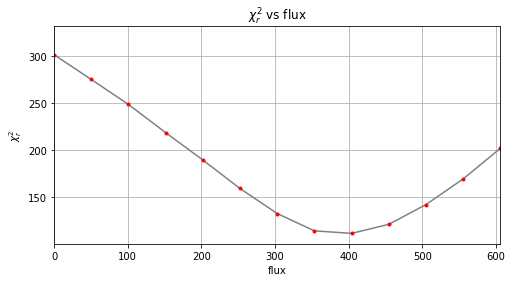

Planet 0: preliminary guess: (r, theta, f)=(30.0, 240.0, 404.0)
Planet 0: Simplex Nelder-Mead minimization, running ...
Planet 0: Success: True, nit: 100, nfev: 225, chi2r: 66.37152099609375
message: Optimization terminated successfully.
Planet 0: simplex result: (r, theta, f)=(30.542, 239.879, 399.868) at 
          (X,Y)=(34.67, 23.58)

 ―――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――― 
DONE !
 ――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Running time:  0:00:36.215267
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――


In [104]:
r_0, theta_0, f_0 = firstguess(cubefc, angs, psfn, ncomp=opt_npc_ann, plsc=pxscale_naco,
                               planets_xy_coord=[xy_test], fwhm=fwhm_naco, 
                               f_range=None, annulus_width=4*fwhm_naco, aperture_radius=2,
                               simplex=True, plot=True, verbose=True)

<font color=green> **Answer 8.1**: If relying on a 2D Gaussian fit, both the photometry and astrometry would be biased by self-subtraction and the negative side lobes. </font>

[Go to the top](#Table-of-contents)

## 8.2. Planet subtraction

Let's use the values obtained with the simplex optimization to subtract the planet with the function `vip.negfc.cube_planet_free`.

In [105]:
from vip_hci.negfc import cube_planet_free

First we define a list with the parameters (r, theta, flux) is each companion that we obtained via the NegFC, in this case one:

In [106]:
plpar_fc = [(r_0[0], theta_0[0], f_0[0])]

Note: r_0, theta_0 and f_0 have the same length as the number of planet coordinates `planets_xy_coord` provided to `firstguess`. Here there is only one planet, so we take the zeroth index. The number of tuples in (i.e the length of) `plpar_fc` should match the number of planets.

In [107]:
cube_emp = cube_planet_free(plpar_fc, cubefc, angs, psfn, pxscale_naco)

In [108]:
fr_pca_emp = vip.pca.pca_annulus(cube_emp, angs, ncomp=opt_npc_ann, annulus_width=4*fwhm_naco, r_guess=30.5)

Let's take a look at the PSF of the planet in the full-frame PCA final image and the same PSF in the frame resulting of processing the planet-subtracted cube:

In [109]:
cropped_frame1 = vip.preproc.frame_crop(final_ann_opt, cenxy=xy_test, size=15)

New shape: (15, 15)


In [110]:
cropped_frame2 = vip.preproc.frame_crop(fr_pca_emp, cenxy=xy_test, size=15)

New shape: (15, 15)


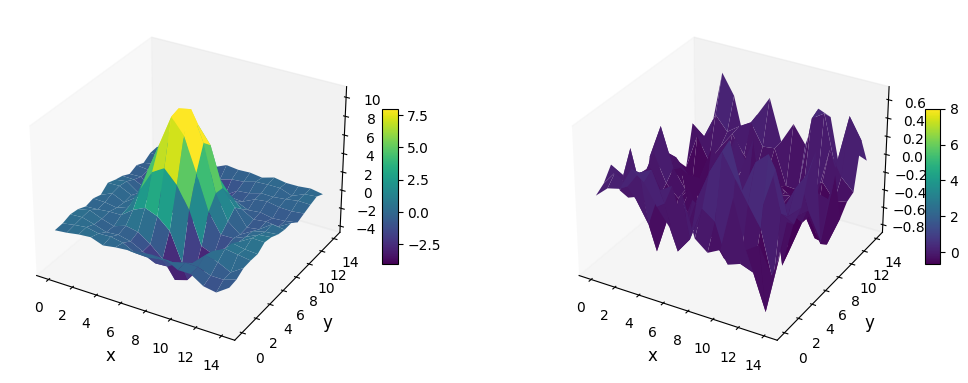

In [111]:
plot_frames((cropped_frame1, cropped_frame2), mode='surface', vmax=8)

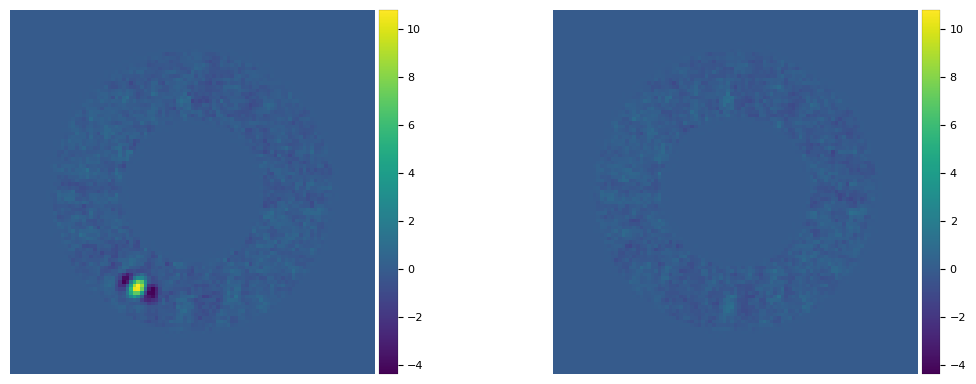

In [112]:
plot_frames((final_ann_opt, fr_pca_emp), vmin = float(np.amin(final_ann_opt)), 
            vmax= float(np.amax(final_ann_opt)), axis=False)

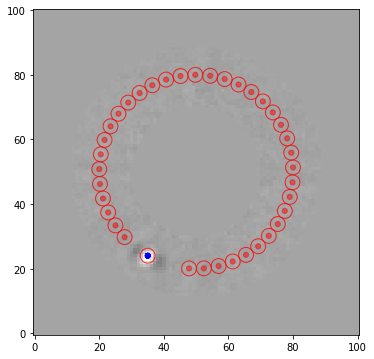

-0.6114653249353637 3.6157754099037067


In [113]:
from vip_hci.metrics import snr
res_snr = snr(final_ann_opt, xy_test, fwhm_naco, full_output=True, 
                      exclude_negative_lobes=True, plot=True)
fluxes = res_snr[-2]
fluxes = fluxes[4:-4]
n2 = len(fluxes)
mu = fluxes.mean()
sigma = fluxes.std(ddof=1)*np.sqrt(1+1/n2)
print(mu,sigma)

Not only the bright point-like signal is subtracted, but so are the negative side lobes. A subtraction not leaving any significant artifact/defect is a good sign that the inferred parameters are correct. However, keep in mind that even for slightly inaccurate parameters, the final image can still look relatively clean. Let's take for example the parameters inferred with non-optimal $n_{\rm pc}$: 

[(30.50921820616194, 239.96163640420855, 382.28192056176556)]


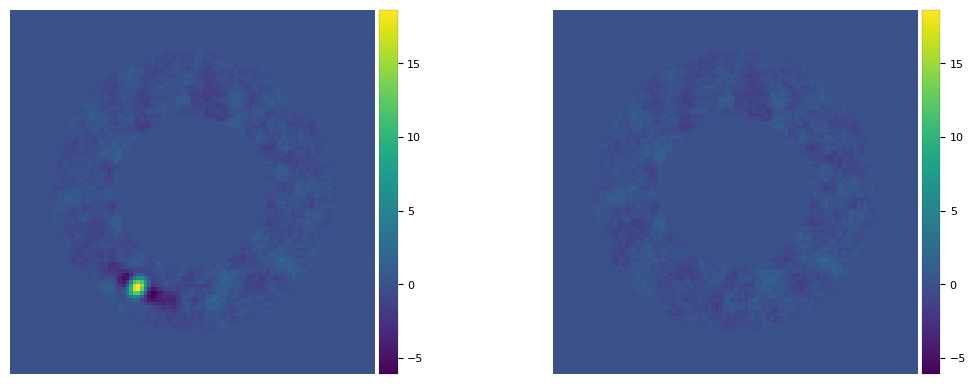

In [114]:
# planet parameters inferred from npc=5 used to make empty cube, then processed with PCA (npc=10)
plpar_fc = [(r_lo[0], theta_lo[0], f_lo[0])]
print(plpar_fc)
cube_emp = cube_planet_free(plpar_fc, cubefc, angs, psfn, pxscale_naco)
final_ann_5 = vip.pca.pca_annulus(cubefc, angs, ncomp=5, annulus_width=4*fwhm_naco, r_guess=30.5)
fr_pca_emp5 = vip.pca.pca_annulus(cube_emp, angs, ncomp=5, annulus_width=4*fwhm_naco, r_guess=30.5)
plot_frames((final_ann_5, fr_pca_emp5), vmin = float(np.amin(final_ann_5)), 
            vmax= float(np.amax(final_ann_5)), axis=False)

[(30.148520399645655, 240.02409052607686, 427.29674517276385)]


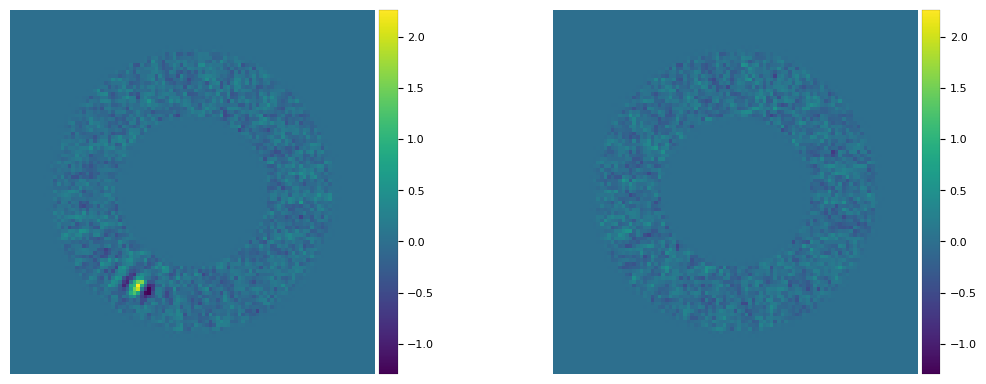

In [115]:
# parameters inferred from npc=25 used to make empty cube, then processed with PCA (npc=10)
plpar_fc = [(r_hi[0], theta_hi[0], f_hi[0])]
print(plpar_fc)
cube_emp = cube_planet_free(plpar_fc, cubefc, angs, psfn, pxscale_naco)
final_ann_25 = vip.pca.pca_annulus(cubefc, angs, ncomp=25, annulus_width=4*fwhm_naco, r_guess=30.5)
fr_pca_emp25 = vip.pca.pca_annulus(cube_emp, angs, ncomp=25, annulus_width=4*fwhm_naco, r_guess=30.5)
plot_frames((final_ann_25, fr_pca_emp25), vmin = float(np.amin(final_ann_25)), 
            vmax= float(np.amax(final_ann_25)), axis=False)

Inaccurate parameters still leading to an apparently good removal of the companion brings the question of the uncertainties on each of the three parameters characterizing the companion. The next sections are dedicated to this question. 

[Go to the top](#Table-of-contents)

## 8.3. NEGFC technique coupled with MCMC

### 8.3.1. Running the MCMC sampler

MCMC is a more robust way of obtaining the flux and position. It samples the posterior distributions of the parameters and from them we can infer both the most likely parameter values and uncertainties on each parameter. 

In [116]:
from vip_hci.negfc import mcmc_negfc_sampling

In NEGFC, PCA in a single annulus is used to speed up the algorithm. Let's set the $n_{\rm pc}$ to the optimal $n_{\rm pc}$ found in [Section 7](#7.-Generating-synthetic-planets). `annulus_width` is the width of the annulus on which PCA is performed (in pixels), and `aperture_radius` is the radius of the aperture  (in `fwhm` units) in which the residual intensities $I_j$ are considered.

In [117]:
ncomp_fc = opt_npc_ann

Parameter ``initial_state`` corresponds to the initial first estimation of the planets parameters (r, theta, flux). We set it to the result of the simplex optimization, obtained with optimal $n_{\rm pc}$. Note that the MCMC minimization can only run for one companion candidate at a time, hence the first dimension of init should always be 3 (not the number of planets, contrary to `xy_planet` in `firstguess`).

In [118]:
initial_state = np.array([r_0[0], theta_0[0], f_0[0]])

Beware that the MCMC procedure is a very CPU intensive procedure and can take several hours when run properly on a standard laptop. We use the affine invariant sampler from `emcee` which can be run in parallel. At least 100 walkers are recommended for our MCMC chain, although both the number of walkers and iterations will depend on your dataset. 
For the sake of preventing this tutorial to take too long to run, we set the maximum number of iterations to 500, although feel free to significantly increase it in case of non-convergence.

In [119]:
nwalkers, itermin, itermax = (100, 200, 500)


Another update from Christiaens et al. (2021) is that the convergence can now be evaluated based on the auto-correlation time (see more details in the [documentation of `emcee`](https://emcee.readthedocs.io/en/stable/tutorials/autocorr/)), instead of the Gelman-Rubin test, which is inappropriate for non-independent samples (such as an MCMC chain).
We set the convergence test to the autocorrelation time based criterion using `conv_test='ac'` (instead of Gelman-Rubin 'gb'). We also set the autocorrelation criterion $N/\tau >= a_c$, where $N$ is the number of samples and $\tau$ the autocorrelation time, to `ac_c=50` (the value recommended in the `emcee` documentation). Finally, we set the number of consecutive times the criterion must be met to: `ac_count_thr=1`, and the maximum gap in number of steps between 2 checks of the convergence criterion to: `check_maxgap=50`.

In [120]:
conv_test, ac_c, ac_count_thr, check_maxgap = ('ac', 50, 1, 50)

Setting `bounds=None` does *not* mean no bounds are used for parameter exploration, but rather that they are set automatically to:
- $r \in [r_0-w_{ann}/2, r_0+w_{ann}/2]$, where $w_{ann}$ is the `annulus_width`,
- $\theta \in [\theta_0-\Delta {\rm rot}, \theta_0+\Delta {\rm rot}]$, where $\Delta {\rm rot}$ is the angle subtended by min(`aperture_radius`/2,`fwhm`) at $r_0$,
- $f \in [0.1*f_0, 2*f_0]$,

where ($r_0, \theta_0, f_0$) = `initial_state`.
If the `bounds` are provided manually (as a tuple of tuples), they will supersede the automatic setting above.

Now let's start the sampler. Note that the results can be saved by setting `save=False` and providing a path to `output_dir`:

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Starting time: 2021-09-10 16:34:37
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
        MCMC sampler for the NEGFC technique       
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
(34.67338681586196, 23.58202543412054)
Beginning emcee Ensemble sampler...
emcee Ensemble sampler successful

Start of the MCMC run ...
Step  |  Duration/step (sec)  |  Remaining Estimated Time (sec)
0		11.60736			5792.07289
1		12.06906			6010.39238
2		11.84680			5887.86010
3		11.80890			5857.21539
4		11.72922			5805.96588
5		11.79308			5825.78350
6		11.79125			5813.08477
7		12.64087			6219.30755
8		11.87161			5828.95904
9		11.75549			5760.19255
10		11.78883			5764.73983
11		12.18046			5944.06643
12		11.83460			5763.44923
13		11.95871			5811.93112
14		11.78009			5713.34365
15		11.79162			5707.14408
16		11.90808			5751.60505
17		12.62944			6087.38767
18		12.58221

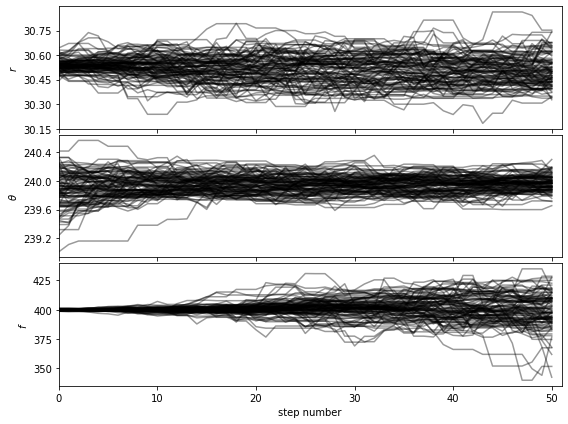

51		13.36131			5985.86643
52		12.08637			5402.60516
53		11.77667			5252.39304
54		11.70091			5206.90362
55		11.70824			5198.45856
56		11.72884			5195.87789
57		12.53662			5541.18471
58		12.12742			5348.19090
59		11.71796			5155.90240
60		11.70431			5138.19121
61		11.90883			5216.06885
62		12.03460			5259.12020
63		11.78008			5136.11488
64		11.76468			5117.63754
65		11.79311			5118.21017
66		11.69282			5062.99063
67		12.01432			5190.18840
68		13.09135			5642.37142
69		13.69570			5889.14928
70		13.89963			5962.94127
71		14.45800			6188.02357
72		14.49874			6190.96326
73		13.70013			5836.25751
74		13.63648			5795.50485
75		13.83702			5866.89733
76		14.21286			6012.04020
77		13.73888			5797.80525
78		13.72802			5779.49726
79		13.72064			5762.67006
80		14.20211			5950.68367
81		13.97204			5840.31105
82		13.63952			5687.67817
83		13.87398			5771.57693
84		13.67270			5674.17216
85		15.25437			6315.30752
86		13.70010			5658.14089
87		13.85519			5708.33787
88		14.40972			5922.39615
89		14.51446

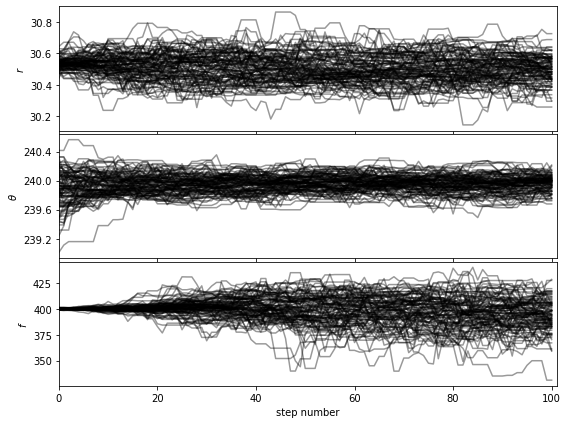

101		15.40817			6132.45325
102		14.82100			5883.93581
103		13.71398			5430.73568
104		13.76060			5435.43898
105		14.24890			5614.06699
106		13.84678			5441.78533
107		13.64058			5347.10814
108		13.75944			5379.94182
109		13.66931			5331.03168
110		15.02201			5843.56306
111		13.94443			5410.43962
112		13.71699			5308.47397
113		13.79958			5326.63942
114		14.13274			5441.10682
115		14.89154			5718.35021
116		13.73717			5261.33649
117		13.80721			5274.35537
118		13.74569			5237.10789
119		14.17777			5387.55412
120		13.67121			5181.38973
121		14.02834			5302.71176
122		14.14944			5334.34001
123		13.90240			5227.30353
124		13.74150			5153.06212
125		13.89540			5196.88072
126		13.68957			5106.20849
127		13.89981			5170.73006
128		15.05254			5584.49049
129		13.74204			5084.55332
130		13.89079			5125.70040
131		14.12697			5198.72606
132		14.67482			5385.65747
133		13.80559			5052.84631
134		13.78326			5030.89026
135		13.72657			4996.47221
136		14.22439			5163.45466
137		13.73827			4973.25446
1

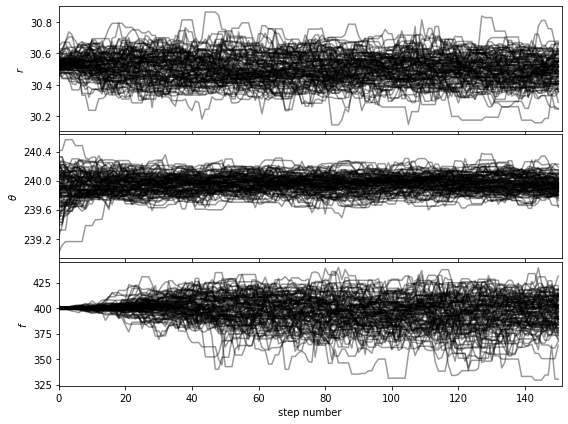

151		15.42786			5368.89389
152		13.86638			4811.63455
153		15.21113			5263.05133
154		13.84595			4776.85137
155		13.72993			4723.09489
156		13.78270			4727.46781
157		14.12715			4831.48667
158		13.73245			4682.76443
159		13.71415			4662.80998
160		13.81731			4684.06945
161		13.77188			4654.89443
162		15.30108			5156.46261
163		13.69807			4602.55253
164		13.72880			4599.14767
165		14.38841			4805.72760
166		13.75125			4579.16758
167		13.71626			4553.79799
168		14.48122			4793.28250
169		13.82760			4563.10866
170		15.13714			4980.11807
171		13.83448			4537.71075
172		13.75635			4498.32645
173		13.77233			4489.78023
174		14.61224			4748.97670
175		14.02334			4543.56346
176		13.74666			4440.16957
177		13.74891			4427.14741
178		13.67262			4388.91006
179		14.32976			4585.52160
180		13.92877			4443.27763
181		13.67646			4349.11555
182		14.38839			4561.11868
183		14.19227			4484.75732
184		13.74728			4330.39446
185		13.73575			4313.02676
186		13.79570			4318.05441
187		15.48496			4831.30752
1

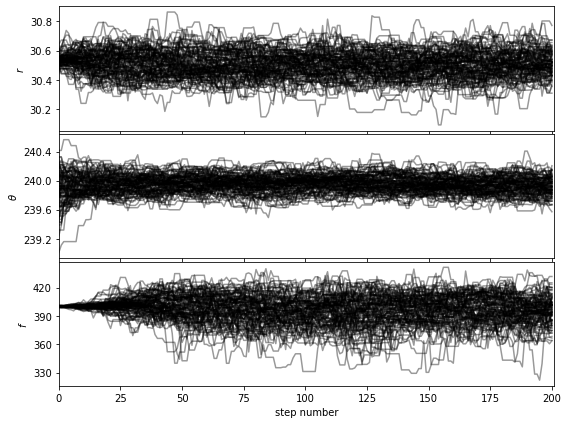

Auto-corr tau/N = [0.0682717  0.07160518 0.06606665]
tau/N <= 0.02 = [False False False] 

201		15.83823			4719.79284
202		13.77489			4091.14114
203		13.80522			4086.34601
204		15.51503			4576.93532
205		13.85104			4072.20635
206		13.71452			4018.35553
207		13.79261			4027.44154
208		14.29512			4159.87905
209		13.75635			3989.34092
210		13.87087			4008.68056
211		13.78080			3968.87069
212		13.76087			3949.36883
213		15.28249			4370.79100
214		13.71275			3908.13460
215		13.76273			3908.61532
216		14.16011			4007.31056
217		13.79471			3890.10737
218		14.10308			3962.96576
219		12.65418			3543.17068
220		11.70858			3266.69298
221		11.74489			3265.07914
222		12.70009			3517.92548
223		11.70656			3231.01194
224		11.94580			3285.09527
225		11.75051			3219.63947
226		12.06078			3292.59212
227		11.74567			3194.82251
228		11.71610			3175.06202
229		11.73970			3169.71792
230		11.70336			3148.20438
231		11.68174			3130.70632
232		12.60045			3364.32042
233		12.01564			3196.16104
234		11.74552			31

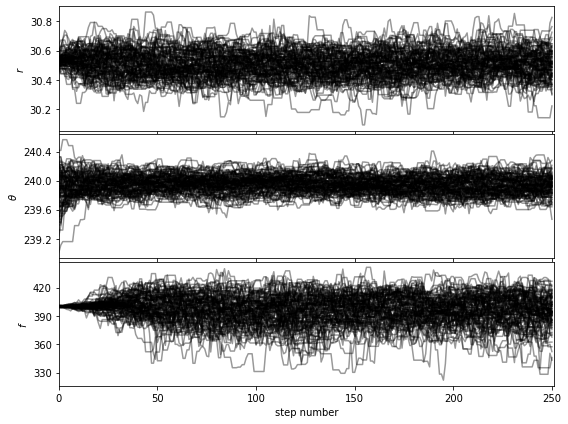

Auto-corr tau/N = [0.06451508 0.07210839 0.06138446]
tau/N <= 0.02 = [False False False] 

251		12.74967			3161.91915
252		12.87062			3179.04339
253		12.09579			2975.56409
254		11.74695			2878.00324
255		11.69018			2852.40490
256		12.14328			2950.81777
257		11.77371			2849.23685
258		11.71471			2823.24439
259		11.79365			2830.47528
260		11.73535			2804.74817
261		11.70029			2784.66831
262		12.64467			2996.78774
263		11.85861			2798.63149
264		11.70573			2750.84608
265		11.77373			2755.05212
266		12.05026			2807.71011
267		11.73665			2722.90257
268		11.72886			2709.36666
269		11.73549			2699.16316
270		11.73398			2687.08234
271		11.70286			2668.25162
272		12.59940			2860.06403
273		11.84129			2676.13064
274		11.72789			2638.77547
275		11.71819			2624.87478
276		12.04629			2686.32289
277		11.75846			2610.37856
278		11.71426			2588.85190
279		11.70032			2574.06974
280		11.71102			2564.71404
281		11.73382			2557.97276
282		12.95855			2812.00557
283		11.99320			2590.53228
284		11.71197			25

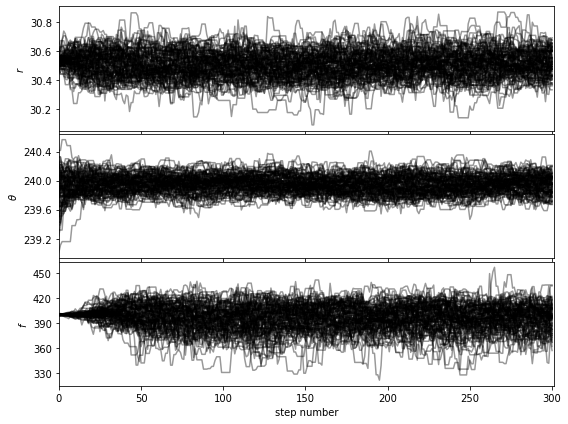

Auto-corr tau/N = [0.06161987 0.06438964 0.05654289]
tau/N <= 0.02 = [False False False] 

301		12.84227			2542.76887
302		12.65735			2493.49815
303		11.92010			2336.33882
304		11.65965			2273.63155
305		11.70811			2271.37431
306		12.16449			2347.74715
307		11.84658			2274.54413
308		11.71486			2237.53921
309		11.68287			2219.74549
310		11.81759			2233.52413
311		11.74508			2208.07466
312		12.76076			2386.26268
313		11.89685			2212.81391
314		11.74348			2172.54398
315		11.81428			2173.82715
316		12.09370			2213.14783
317		12.40157			2257.08574
318		11.92174			2157.83530
319		11.69271			2104.68834
320		11.71264			2096.56202
321		11.73804			2089.37059
322		12.09919			2141.55698
323		11.74440			2067.01475
324		11.72850			2052.48750
325		11.71526			2038.45576
326		11.72601			2028.59938
327		11.96421			2057.84498
328		11.80068			2017.91560
329		11.74068			1995.91645
330		12.04156			2035.02296
331		11.72876			1970.43151
332		11.97901			2000.49500
333		12.56680			2086.08913
334		11.69357			19

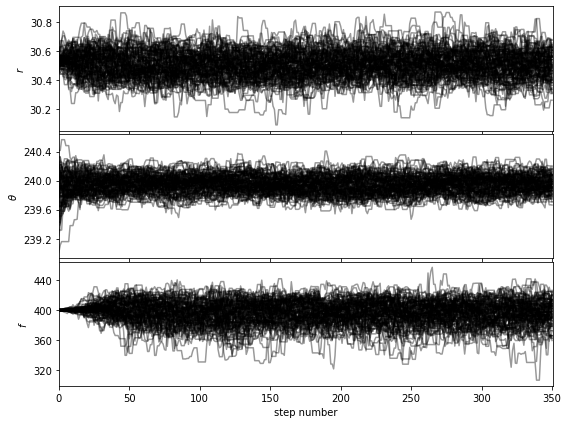

Auto-corr tau/N = [0.05684119 0.05942346 0.05155673]
tau/N <= 0.02 = [False False False] 

351		13.01862			1926.75591
352		11.69600			1719.31171
353		12.76481			1863.66255
354		11.78718			1709.14081
355		11.70140			1685.00117
356		11.67586			1669.64827
357		11.91419			1691.81569
358		11.85500			1671.55472
359		11.81790			1654.50530
360		11.80700			1641.17286
361		11.99767			1655.67874
362		11.72157			1605.85441
363		12.62975			1717.64586
364		11.73929			1584.80361
365		11.74227			1573.46472
366		11.75511			1563.42976
367		12.13720			1602.11080
368		11.80771			1546.81001
369		11.63863			1513.02216
370		11.75458			1516.34069
371		11.87243			1519.67078
372		11.71448			1487.73960
373		12.73372			1604.44897
374		11.83923			1479.90350
375		11.74057			1455.83006
376		11.67867			1436.47690
377		12.21001			1489.62146
378		11.79793			1427.54977
379		11.75910			1411.09188
380		11.67294			1389.07927
381		11.73917			1385.22206
382		11.77373			1377.52664
383		12.75378			1479.43883
384		11.82504			13

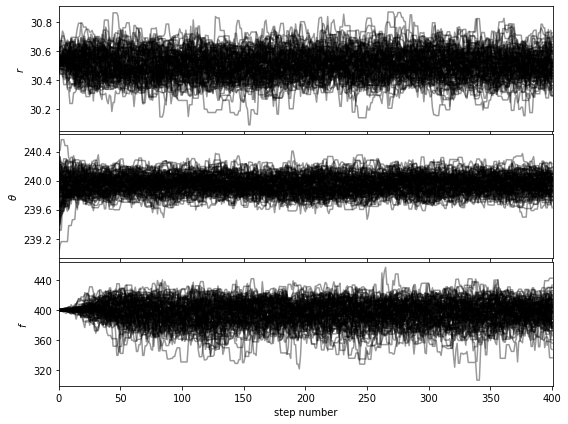

Auto-corr tau/N = [0.05381585 0.05570559 0.04799757]
tau/N <= 0.02 = [False False False] 

401		12.84970			1259.27070
402		11.83207			1147.71079
403		12.24500			1175.52038
404		11.77925			1119.02894
405		11.78148			1107.45884
406		11.80375			1097.74894
407		11.93473			1097.99562
408		12.00017			1092.01574
409		11.72245			1055.02014
410		11.74171			1045.01264
411		11.72570			1031.86151
412		11.71061			1018.82342
413		12.80443			1101.18081
414		12.02621			1022.22759
415		11.71019			983.65604
416		11.75349			975.53992
417		11.98479			982.75270
418		12.26167			993.19487
419		11.75814			940.65152
420		11.70698			924.85174
421		11.72269			914.37005
422		11.66169			897.95021
423		12.08013			918.08988
424		11.71046			878.28465
425		11.70209			865.95503
426		11.71820			855.42889
427		11.94566			860.08716
428		11.85809			841.92460
429		11.82444			827.71052
430		11.71244			808.15829
431		11.74495			798.65633
432		11.71663			785.01428
433		12.58222			830.42626
434		11.89396			773.10759
435		11.720

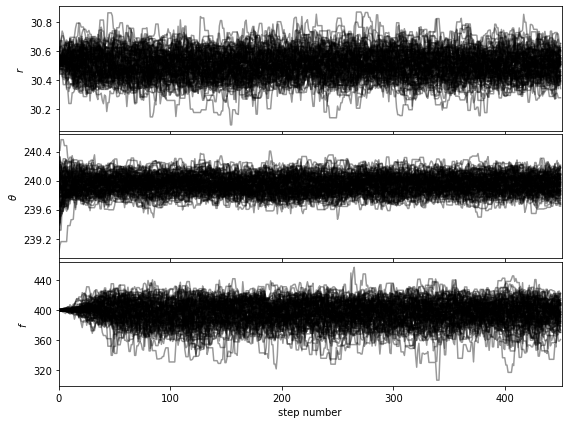

Auto-corr tau/N = [0.05105363 0.05146463 0.04482238]
tau/N <= 0.02 = [False False False] 

451		13.08795			628.22160
452		11.79874			554.54097
453		12.75630			586.78966
454		11.89366			535.21470
455		11.72316			515.81904
456		11.75679			505.54210
457		12.08690			507.65001
458		11.88484			487.27860
459		11.76081			470.43244
460		11.92071			464.90781
461		11.76791			447.18047
462		11.68784			432.45012
463		12.53696			451.33042
464		12.05371			421.87974
465		11.75754			399.75643
466		11.73072			387.11383
467		11.89747			380.71894
468		12.26523			380.22207
469		12.00791			360.23733
470		11.71504			339.73619
471		11.69627			327.49567
472		11.71244			316.23580
473		12.13575			315.52937
474		11.83026			295.75660
475		11.78188			282.76519
476		11.71499			269.44479
477		11.68810			257.13820
478		11.96994			251.36882
479		12.25066			245.01320
480		11.91549			226.39441
481		11.74026			211.32463
482		11.70473			198.98036
483		12.17915			194.86632
484		12.01359			180.20391
485		11.72331			164.12641

In [121]:
chain = mcmc_negfc_sampling(cubefc, angs, psfn, ncomp=ncomp_fc, plsc=pxscale_naco, scaling=None, 
                            fwhm=fwhm_naco, svd_mode='lapack', annulus_width=4*fwhm_naco, aperture_radius=2, 
                            initial_state=initial_state, nwalkers=nwalkers, niteration_min=itermin, 
                            niteration_limit=itermax, conv_test=conv_test, ac_c=ac_c, ac_count_thr=ac_count_thr, 
                            check_maxgap=check_maxgap, #rhat_count_threshold=1,
                            bounds=None, nproc=2, display=True, verbosity=2, save=False)

Let's pickle the result to not have to re-run the previous box. For that, adapt the `output_dir` path and turn the 'False' into 'True' in the following box before running it:

In [122]:
if False:
    import pickle
    output_dir = "/Users/Valentin/Documents/"
    output_file = 'MCMC_results_chain'
    output = {'chain':chain}
    with open(output_dir+output_file, 'wb') as fileSave:
        pickle.dump(output, fileSave)

Note that an alternative to the box above, is to provide `output_dir` in the call to `mcmc_negfc_sampling` and set `save` to True. This will save the results including additional keys - apart from 'chain', it will also save: 'input_parameters', 'AR' (acceptance ratio), and 'lnprobability'.

Pickled results can be loaded from disk like this:

In [123]:
try:
    if os.path.isfile(output_dir+output_file):
        with open(output_dir+output_file,'rb') as fi:
            myPickler = pickle.Unpickler(fi)
            mcmc_result = myPickler.load()

        print(mcmc_result.keys())

        chain = mcmc_result['chain']
except:
    print("First run the MCMC and pickle the results")

dict_keys(['chain'])


The most accurate approach would involve setting a large enough max. number of iterations and using FFT-based rotation for PCA. The latter in particular, may change a bit the most likely parameter values given the better flux conservation. However, these changes would involve over ~3 orders of magnitude longer calculation time. It is therefore intractable for a personal laptop and not shown in this notebook. If you have access to a supercomputer feel free to adopt it though. The results after 500 iterations are nonetheless good enough for illustrative purpose:

### 8.3.2. Visualizing the MCMC chain: corner plots and walk plots 

In [124]:
from vip_hci.negfc import show_corner_plot, show_walk_plot

Let's first check that the walk plots look ok:

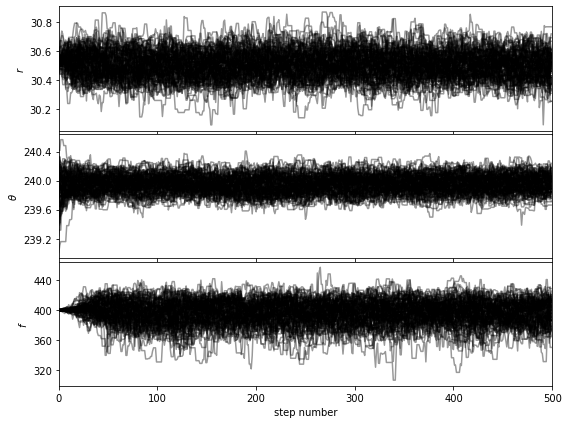

In [125]:
show_walk_plot(chain)

Then based on the walk plot, let's burn-in conservatively the first third of the chain, to calculate the corner plots:

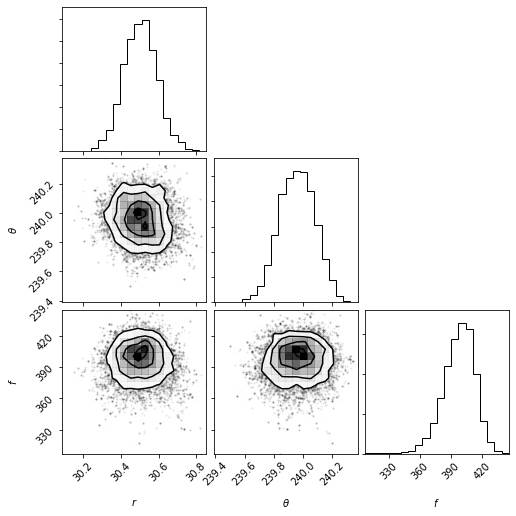

In [126]:
burnin = 0.3
burned_chain = chain[:, int(chain.shape[1]//(1/burnin)):, :]
show_corner_plot(burned_chain)

For the purpose of this tutorial and to limit computation time involved we set the maximum number of iterations to 500 for 100 walkers. The look of the corner plots may improve with more samples (i.e. higher number of iterations, for a given burn-in ratio). This can be tested by setting the max. number of iterations arbitrarily high for the autocorrelation-time convergence criterion to be met.

### 8.3.3. Highly probable values and confidence intervals 

Now let's determine the most highly probable value for each model parameter, as well as the 1-sigma confidence interval. For this, let's flatten the chains:

percentage for r: 68.55840455840459%
percentage for $\theta$: 69.32763532763532%
percentage for flux: 69.07977207977207%


Confidence intervals:
r: 30.515049489278038 [-0.09720299364152751,0.08942675415020673]
theta: 239.93216910729967 [-0.11712688580408326,0.14768172557907633]
flux: 399.0462172097063 [-15.701624710134695,15.701624710134695]

Gaussian fit results:
r: 30.507556263919955 +-0.09048759039470657
theta: 239.95116977292759 +-0.12332175036057297
f: 396.93605282644796 +-15.367432539141346


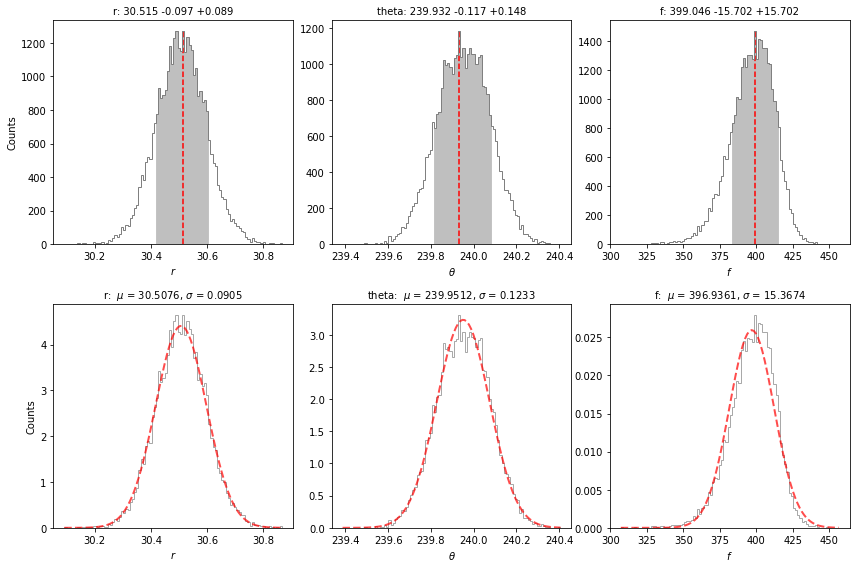

In [127]:
from vip_hci.negfc import confidence

isamples_flat = chain[:, int(chain.shape[1]//(1/burnin)):, :].reshape((-1,3))

val_max, conf = confidence(isamples_flat, cfd=68, gaussian_fit=False,
                           verbose=False, save=False, title=True)
plt.close()
mu, sigma = confidence(isamples_flat, cfd=68, gaussian_fit=True, 
                       verbose=True, save=False, title=True)

It is recommended to report the results as confidence intervals (i.e. with possibly asymmetric uncertainties) as long as the bin interval is small enough. Here, we also fitted the residual posterior distribution of each parameter to a Gaussian distribution (this shape is the expected one if the noise has been well whitened, but is not necessarily guaranteed at all separations depending on the adopted $n_{\rm pc}$). In case, the $\sigma$ value from can be more accurate.

We can see that the confidence intervals inferred by NEGFC for the different parameters barely encompass the ground truth values used for injection (in particular for the flux). So far, only the uncertainty associated to *photon noise* is reflected in the MCMC result (this is a direct consequence of the expression provided for $\chi^2$). As we'll see in the next section, another source of statistical uncertainty has to be taken into account.

[Go to the top](#Table-of-contents)

## 8.4. Residual speckle uncertainty

Residual speckle noise can still bias the best parameter estimates found for the companion.
To evaluate the uncertainty associated to this additional source of noise, it is recommended to inject a large number of fake companions at the same radius and flux as estimated for the true companion but different azimuths, and then estimate their parameters using simplex-NEGFC. The distribution of differences with respect to injected parameters can then give us an idea of the *residual speckle noise uncertainty*. This is done in VIP with `vip.negfc.speckle_noise_uncertainty` (see also Sec. 3.3 in Wertz et al. 2017 for more details).

In [128]:
pl_par = (val_max['r'],val_max['theta'],val_max['f']) #(30.466232592720647, 239.97149215920115, 399.76518693157954)
pl_par

(30.515049489278038, 239.93216910729967, 399.0462172097063)


#######################################################
###            SPECKLE NOISE DETERMINATION          ###
#######################################################

Number of steps: 360

Process is running for angle: 0.00
Process is running for angle: 45.00
Process is running for angle: 1.00
Process is running for angle: 46.00
Process is running for angle: 2.00
Process is running for angle: 47.00
Process is running for angle: 48.00
Process is running for angle: 3.00
Process is running for angle: 4.00
Process is running for angle: 49.00
Process is running for angle: 5.00
Process is running for angle: 50.00
Process is running for angle: 6.00
Process is running for angle: 7.00
Process is running for angle: 51.00
Process is running for angle: 8.00
Process is running for angle: 52.00
Process is running for angle: 9.00
Process is running for angle: 53.00
Process is running for angle: 10.00
Process is running for angle: 54.00
Process is running for angle: 11.00
Process is running for ang

percentage for $\theta$: 73.33333333333333%
percentage for flux: 69.72222222222221%


Confidence intervals:
r: 0.009504485513866422 [-0.12355420836759076,0.05538636926823035]
theta: 0.011423230548857096 [-0.0963388587109885,0.07882270258171785]
flux: -0.6359516312857905 [-11.896593323579376,14.540280728819239]

Gaussian fit results:
r: -0.0020376750207126864 +-0.059325934288646194
theta: -0.0037619161007983915 +-0.079638601170969
f: -0.13697216202846646 +-11.204366589066083


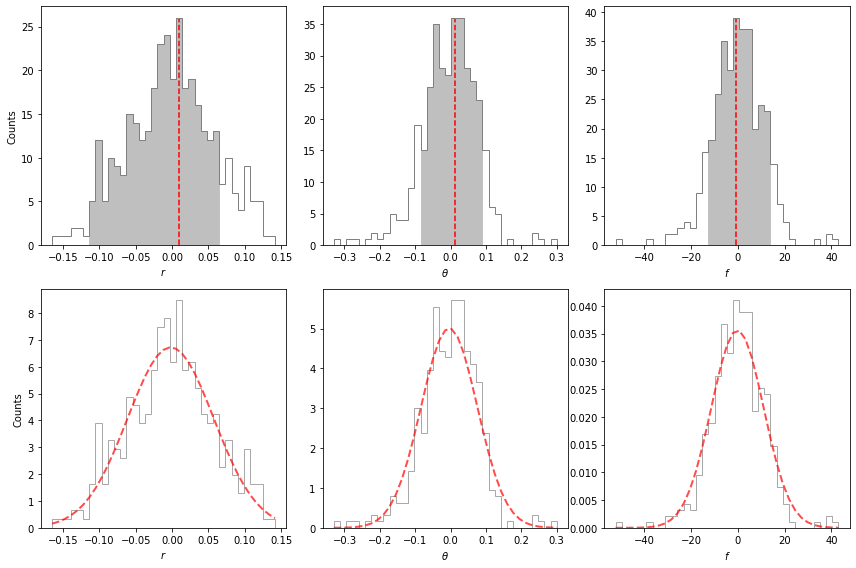

In [129]:
from vip_hci.negfc import speckle_noise_uncertainty
speckle_res = speckle_noise_uncertainty(cubefc, pl_par, np.linspace(0,359,360), angs, vip.pca.pca_annulus, 
                                        psfn, pxscale_naco, fwhm_naco, aperture_radius=2, fmerit='sum', 
                                        algo_options={'ncomp':ncomp_fc, 'annulus_width':4*fwhm_naco}, 
                                        transmission=None, mu_sigma=None, wedge=None, weights=None, force_rPA=False, 
                                        nproc=2, simplex_options=None, bins=None, save=False, output=None, 
                                        verbose=True, full_output=True, plot=True)

In [130]:
sp_unc, mean_dev, p_simplex, offset, chi2, nit, success = speckle_res

The speckle uncertainty associated to each parameter is contained in `sp_unc` which corresponds to the 1$\sigma$ width of a Gaussian distribution fitted to the `offset` distribution (i.e. the differences with respect to injected ground truths):

In [131]:
sp_unc

array([ 0.05932593,  0.0796386 , 11.20436659])

For comparison, the uncertainties associated to photon noise found by the MCMC procedure were:

In [132]:
sigma

array([ 0.09048759,  0.12332175, 15.36743254])

The statistical uncertainties on the parameters of the test companion are therefore:

In [133]:
stat_unc = np.sqrt(np.power(sigma,2)+np.power(sp_unc,2))
stat_unc

array([ 0.10820153,  0.14680109, 19.01830207])

In [134]:
msg = "The inferred parameters of the test companion, including statistical uncertainties are thus: "
msg += " r={:.2f}+-{:.2f} px, PA={:.2f}+-{:.2f}deg and flux={:.2f}+-{:.2f} ADUs"
print(msg.format(val_max['r'],stat_unc[0],val_max['theta'],stat_unc[1],val_max['f'],stat_unc[2]))

The inferred parameters of the test companion, including statistical uncertainties are thus:  r=30.52+-0.11 px, PA=239.93+-0.15deg and flux=399.05+-19.02 ADUs


[Go to the top](#Table-of-contents)

## 8.5. Final uncertainties

The final uncertainties on the planet parameters should include both *statistical* and *systematic* uncertainties. 
The latter include both the photon noise and residual speckle noise uncertainties discussed above. 
Systematic uncertainties include both the uncertainty on the star location (with respect to the center of the AGPM), affecting and instrumental calibration errors such as:
- the uncertainty on the star location (with respect to the center of the AGPM);
- the uncertainty on the plate scale (for $r$, when converting to angular separation) - note that it is proportional to the radial separation itself;
- the uncertainty on the PA of true north (for $\theta$).

The uncertainty on the star location is of the order of 0.3px in individual NACO+AGPM images. Given the shift plots in [Sec. 2.1](#2.1.-Re-centering-the-ADI-frames), it appears the autocorrelation timescale is of the order of ~5 frames. Therefore, considering that there are 61 frames in the datacube, the uncertainty on the star location in the final combined image must be roughly:

In [135]:
cen_unc_indiv = 0.3 #px
cen_unc = cen_unc_indiv/np.sqrt(61/5) #px

The latter translates to an uncertainty on $\theta$ of $0.09/r$ (in rad). The stellar centering uncertainties on each planet parameter can thus be expressed as:

In [136]:
star_unc = np.array([cen_unc*pxscale_naco, np.rad2deg(cen_unc/val_max['r']), 0]) # uncertainty on each of the 3 parameters due to stellar centering

where the multiplication by `pxscale_naco` has converted the radial separation in arcsec.

For the instrumental calibration errors, we adopt the values quoted in Absil et al. (2013). Note that the uncertainty related to the plate scale is directly proportional to the radial separation of the companion.

In [137]:
dr_unc = 0.00004 # plate scale uncertainty in arcsec per px
tn_unc = 0.09    # deg
syst_unc = np.array([val_max['r']*dr_unc, tn_unc, 0])

The final uncertainties are then the different sources of uncertainty added quadratically - after conversion of the radial separation to arcsec:

In [138]:
sigma[0] *= pxscale_naco
sp_unc[0] *= pxscale_naco

final_unc = np.sqrt(np.power(sigma,2)+np.power(sp_unc,2)+np.power(star_unc,2)+np.power(syst_unc,2))

In [139]:
msg = "The final uncertainties on the radial separation, PA and flux of the companion are: "
msg+= "dr = {:.2f} mas, dPA = {:.2f}deg and df = {:.2f} ADUs"
print(msg.format(final_unc[0]*1000, final_unc[1], final_unc[2]))

The final uncertainties on the radial separation, PA and flux of the companion are: dr = 3.95 mas, dPA = 0.24deg and df = 19.02 ADUs


[Go to the top](#Table-of-contents)

# 9. Throughput and contrast curve

## 9.1. Algorithmic throughput

`VIP` allows to measure the throughput of its algorithms by injecting fake companions. The throughput gives us an idea of how much the algorithm subtracts or biases the signal from companions, as a function of the distance from the center (high throughput = low amount of self-subtraction). Let's assess it for our toy datacube. The relevant function is `vip.metrics.throughput`.

First, let's create a cube without the real companion (beta Pic b) - the parameters hardcoded below were inferred separately in the same way as was done for the fake companion in Sec. 8:

In [140]:
cube_emp = cube_planet_free([(16.583, 149.111, 700)], cube, angs, psfn=psfn, plsc=pxscale_naco)

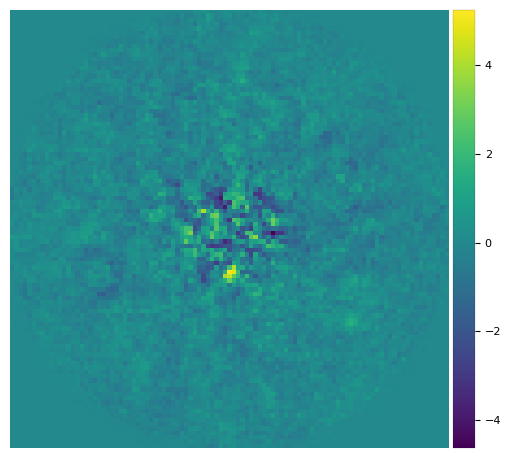

In [141]:
plot_frames(vip.pca.pca(cube_emp, angs, ncomp=11, verbose=False), axis=False)

In [142]:
res_thr = vip.metrics.throughput(cube_emp, angs, psfn, fwhm_naco, pxscale_naco, ncomp=15, 
                                 algo=vip.pca.pca, nbranch=1, full_output=True)

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Starting time: 2021-09-10 20:23:11
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Cube without fake companions processed with pca
Running time:  0:00:00.212023
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Measured annulus-wise noise in resulting frame
Running time:  0:00:00.300138
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Flux in 1xFWHM aperture: 1.000
Fake companions injected in branch 1 (pattern 1/3)
Running time:  0:00:00.596757
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Cube with fake companions processed with pca
Measuring its annulus-wise throughput
Running time:  0:00:00.796362
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Fake companions injected in branch 1 (pattern 2/3)
Running time:  0:00:01.052989
――――――――――――――――――

Text(0.5, 0, 'separation in pixels')

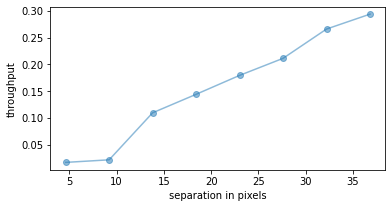

In [143]:
figure(figsize=(6,3))
if version.parse(vvip)>=version.parse('1.0.0'):
    plot(res_thr[3], res_thr[0][0,:], 'o-', alpha=0.5)
else:
    plot(res_thr[2], res_thr[0][0,:], 'o-', alpha=0.5)    
ylabel('throughput')
xlabel('separation in pixels')

<font color=orange> **Question 9.1**: Why does the throughput increase with radial separation?</font>

Let's compare this with the annular PCA result:

In [144]:
res_thr2 = vip.metrics.throughput(cube_emp, angs, psfn, fwhm_naco, pxscale_naco, 
                                  algo=vip.pca.pca_annular, nbranch=1, verbose=False,
                                  full_output=True, ncomp=15, radius_int=int(fwhm_naco), 
                                  delta_rot=0.5, svd_mode='lapack', asize=2)

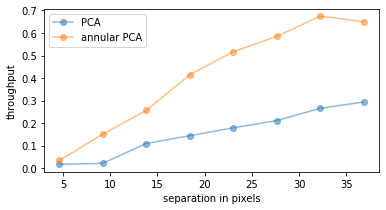

In [145]:
figure(figsize=(6,3))
if version.parse(vvip)>=version.parse('1.0.0'):
    plot(res_thr[3], res_thr[0][0,:], 'o-', label='PCA', alpha=0.5)
    plot(res_thr2[3], res_thr2[0][0,:], 'o-', label='annular PCA', alpha=0.5)
else:
    plot(res_thr[2], res_thr[0][0,:], 'o-', label='PCA', alpha=0.5)
    plot(res_thr2[2], res_thr2[0][0,:], 'o-', label='annular PCA', alpha=0.5)
ylabel('throughput')
xlabel('separation in pixels')
_ = legend(loc='best')

We clearly see the gain in throughput by applying a parallactic angle rejection in our annular PCA processing. For a sequence with more field rotation, the `delta_rot` value could be increased to further increase the throughput.

<font color=green> **Answer 9.1**: For a given parallactic angle threshold (or lack thereof in standard `pca.pca`), there is more linear motion of the field, resulting in less self-subtraction of any putative planet. </font>

[Go to the top](#Table-of-contents)

## 9.2. Contrast curve generation for ADI

Now let's see how to generate 5-sigma contrast curves for ADI data using `vip.metrics.contrast_curve`. 
The contrast curve shows the achieved contrast (i.e. how much fainter than the star a companion can be detected) as a function of radius, for a given datacube post-processed with a given algorithm.

The contrast curve takes into account both the noise level in the final image and the algorithmic throughput. The noise level is used to infer the signal required for the S/N to achieve a 5-sigma significance at each radial separation, as calculated in [Section 4.2](#4.2.-Significance). Note that `sigma` is an input parameter such that the contrast curve can also be calculated for e.g. 1 or 3 $\sigma$.

Among other parameters of the `contrast_curve` function, ``algo`` takes any function in ``VIP`` for model PSF subtraction, and optional parameters of the `algo` can also be passed as regular parameters of `contrast_curve`. Parameter `starphot` sets the flux of the star. The latter was obtained from the non-coronagraphic PSF before normalization:

In [146]:
starphot = 764939.6

In the example below, we'll first calculate the contrast curve obtained with full-frame PCA, and then with PCA in concentric annuli with a PA threshold.

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Starting time: 2021-09-10 20:23:27
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
ALGO : pca, FWHM = 4.603450563658683, # BRANCHES = 1, SIGMA = 5, STARPHOT = 764939.6
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Finished the throughput calculation
Running time:  0:00:01.433511
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――


/Users/Valentin/anaconda2/envs/vipenv/lib/python3.6/site-packages/scipy/signal/_savitzky_golay.py:135: RuntimeWarning: internal gelsd driver lwork query error, required iwork dimension not returned. This is likely the result of LAPACK bug 0038, fixed in LAPACK 3.2.2 (released July 21, 2010). Falling back to 'gelss' driver.
  coeffs, _, _, _ = lstsq(A, y)


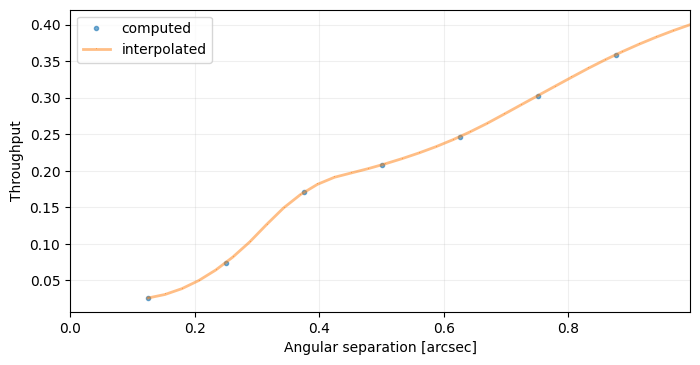

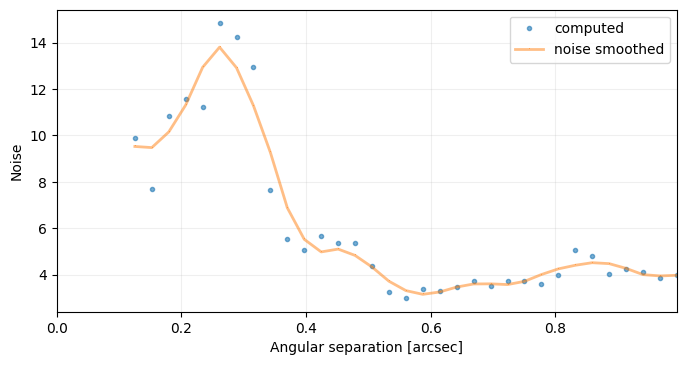

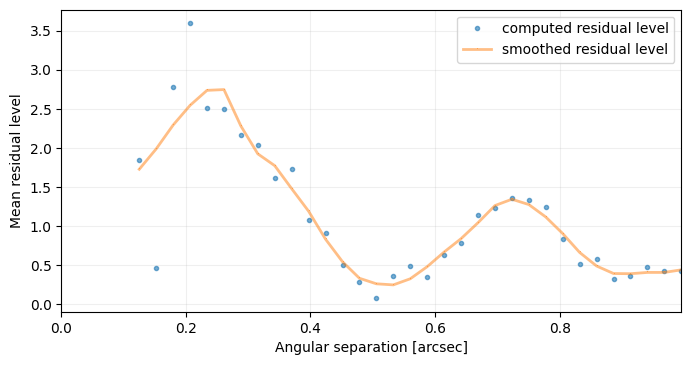

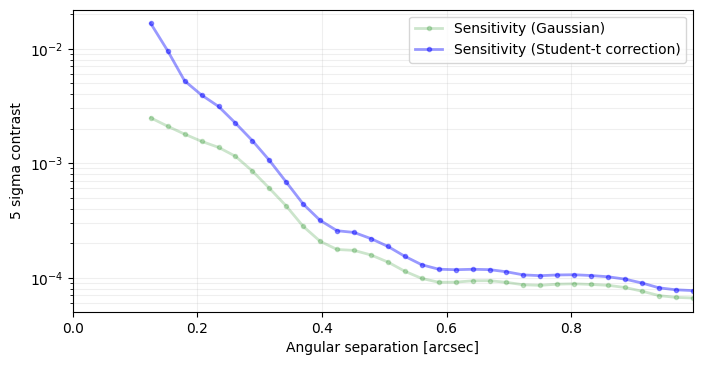

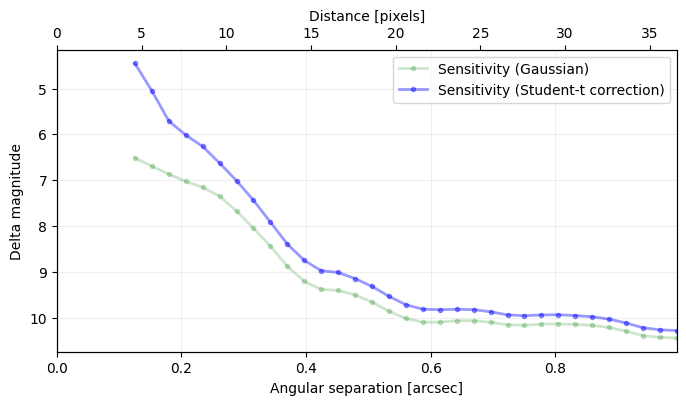

In [147]:
_ = vip.metrics.contrast_curve(cube_emp, angs, psfn, fwhm=fwhm_naco, pxscale=pxscale_naco, starphot=starphot, 
                               sigma=5, nbranch=1, algo=vip.pca.pca, ncomp=11, debug=True)

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Starting time: 2021-09-10 20:23:31
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
ALGO : pca_annular, FWHM = 4.603450563658683, # BRANCHES = 1, SIGMA = 5, STARPHOT = 764939.6
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Finished the throughput calculation
Running time:  0:00:08.647911
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――


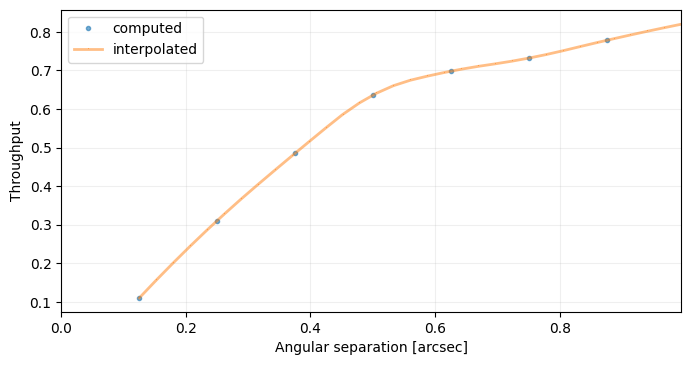

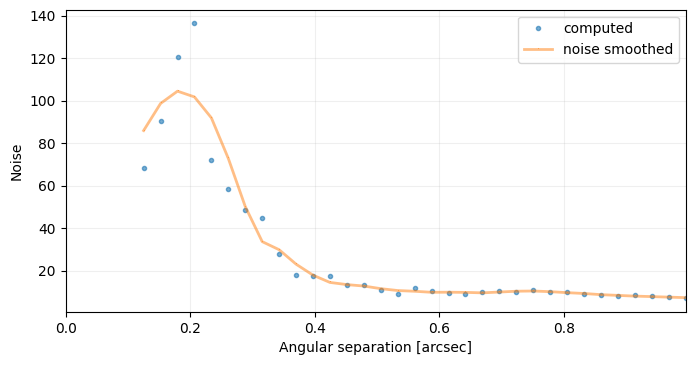

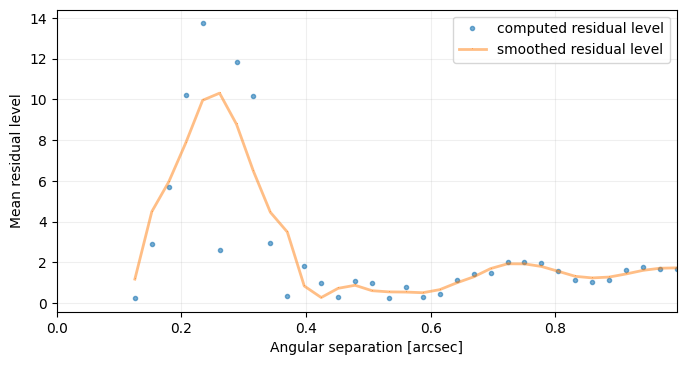

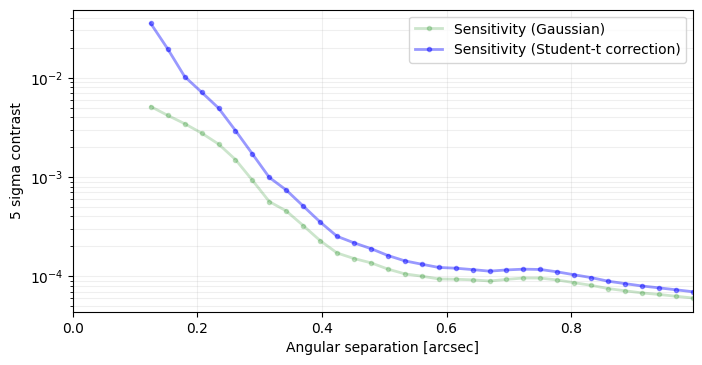

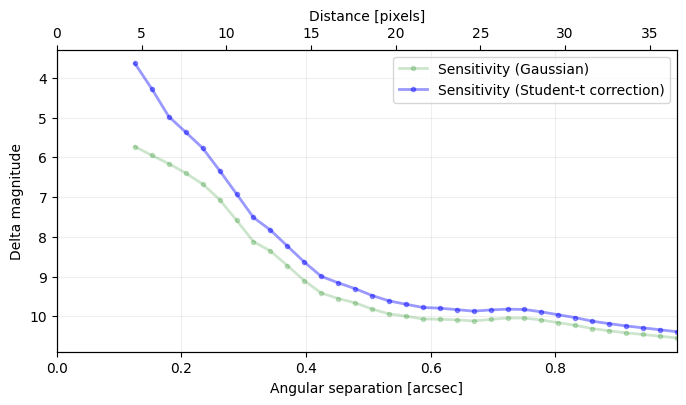

In [148]:
_ = vip.metrics.contrast_curve(cube_emp, angs, psfn, fwhm=fwhm_naco, pxscale=pxscale_naco, starphot=starphot, 
                               sigma=5, nbranch=1, delta_rot=0.5, algo=vip.pca.pca_annular, radius_int=int(fwhm_naco),
                               ncomp=8, debug=True)

<font color=orange> **Question 9.2**: Given the hard encoded planet parameters and stellar flux above, where would Beta Pic b sit in this contrast curve?</font>

<font color=orange> **Question 9.3**: If a companion is present in the datacube, how do you expect it to affect the contrast curve? In other words what would happen if `cube` was provided to `contrast_curve` instead of `cube_emp`? </font>

<font color=green> **Answer 9.2**:  Not removing authentic companions from the cube before calculating the contrast curve will lead to a bump in the contrast curve (i.e. an underestimation of the contrast performance) at the radial separation of the companion. This is because the point source and surrounding negative side lobes will contribute to increase the estimated noise (i.e. it will increase the standard deviation of fluxes measured in apertures at that radius - cfr. definition of S/N ratio). </font>

<font color=green> **Answer 9.3**:  Not removing authentic companions from the cube before calculating the contrast curve will lead to a bump in the contrast curve (i.e. an underestimation of the contrast performance) at the radial separation of the companion. This is because the point source and surrounding negative side lobes will contribute to increase the estimated noise (i.e. it will increase the standard deviation of fluxes measured in apertures at that radius - cfr. definition of S/N ratio). </font>

[Go to the top](#Table-of-contents)